# Exploring the Impact of County, State-Level Economic Factors on Sentiment Toward the Presidential Incumbent and Challenger: A Test of Economic Voting Theory

# 1. Project One

## 1.1 Introduction

In 2020, the United States faced severe economic downturn due to the COVID-19 pandemic, with many states experiencing stagnant economic growth and higher poverty levels (Reality Check Team, 2020). Albeit unfortunate, these conditions foster an ideal environment to determine how economic slumps influence political behavior. Interestingly, economic voting theory suggests that voters electorally support the incumbent and oppose the challenger when the economy is strong but turn against the incumbent and favor the challenger when the economy is weak (Lewis‐Beck and Nadeau, 2010). Whilst traditionally applied to ballot behavior, social media has introduced a new avenue for expressing public sentiment. This study extends economic voting theory to posts on Twitter. Regarding economic factors, the research focuses on unemployment, taxes, housing costs, wages, income inequality, poverty, personal consumption expenditure, and GDP, which are directly relevant to Americans' economic concerns (Gallup, 2019; Silver, 2025). Therefore, I want to examine whether economic conditions—such as unemployment, taxes, housing costs, poverty, personal consumption expenditures, income inequality, income per capita, and GDP—predict public sentiment toward political candidates. More specifically, I aimed to test whether worse/better economic conditions are associated with more negative/positive sentiment toward the president and more positive/negative sentiment toward the challenger, as suggested by economic voting theory.

In U.S. presidential elections, voters are generally sociotropic and retrospective (Leighley, 2010; Sartorius, 2015), meaning they evaluate county and state-level economic conditions and their respective year-end economic growth. In addition, they assess their county and state's current economy (Healy and Lenz, 2013; Hopkins, 2017; Kinder and Kiewiet, 1981; Sartorius, 2015). At the county and state level, voters typically assess factors, such as unemployment, taxes, housing costs, wages, personal income, personal consumption expenditures, income inequality, poverty rate, and GDP (Silver, 2025). Research consistently shows that economic conditions sway electoral outcomes (Lewis-Beck and Stegmaier, 2000; De BenedictisKessner and Warshaw, 2020), and that election-related tweets can serve as proxies for determining who people would vote for (Fujiwara et al., 2023). Crucially, we assume American tweeters yield the same properties as American voters. Therefore, in line with economic voting theory, worse/better economic conditions at the county and state level should result in more negative/positive tweets about the president and more positive/negative tweets about the challenger. 

This study combines political tweet data from the 2020 U.S. election with county and state-level economic indicators to explore how economic conditions relate to digital political expression. The tweet data comes from the publicly available “US Election 2020 Tweets” dataset on Kaggle, which includes over 7 million tweets. Using geolocation and text classification, tweets were aggregated by county and state, and categorized by negative sentiment toward Trump or Biden using a sentiment analysis tool. County-level economic variables were sourced from the U.S. Census Bureau and the Bureau of Economic Analysis (BEA). These indicators include GDP, poverty rate, housing costs, unemployment rate, income per capita, income inequality (Gini index), and population, along with growth rates calculated from 2019 to 2020. Each county represents one observation. State-level indicators include GDP, poverty, unemployment, taxes, housing prices, personal income, and personal consumption expenditure along with their growth rates. These variables were sourced from BEA, BLS, U.S. Census, the Tax Foundation, and the FHFA. To incorporate public infrastructure, the study adds library data scraped from archived versions of PublicLibraries.com using the Wayback Machine. The dataset captures the number of libraries per county in 2020, providing a measure of investment in public learning resources. Overall, the final dataset contains county-level economic and tweet data (n = 1,500). This structure allows a nuanced analysis of how economic hardship and economic factors shape online political sentiment. 


## 1.2 Data Cleaning/Loading

In [1]:
import pandas as pd
import numpy as np
joe_data = pd.read_csv(
    r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\Political Data\hashtag_joebiden.csv",
    encoding="utf-8",
    on_bad_lines="skip",  
    sep=",",
    engine="python",      
)
donald_data = pd.read_csv(
    r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\Political Data\hashtag_donaldtrump.csv",
    encoding="utf-8",
    on_bad_lines="skip", 
    sep=",",
    engine="python",
)
combined_data = pd.concat([joe_data, donald_data], ignore_index=True)
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

In [2]:
# Data preparation

# Sociotropic + Current Comparison perspective (State-level) (stronger)

# First, I want to filter for tweets that originate from a U.S. state
us_states = [
    'Alabama', 'Alaska', 'Arizona', 'Arkansas', 'California', 'Colorado', 'Connecticut', 'Delaware', 
    'Florida', 'Georgia', 'Hawaii', 'Idaho', 'Illinois', 'Indiana', 'Iowa', 'Kansas', 'Kentucky', 
    'Louisiana', 'Maine', 'Maryland', 'Massachusetts', 'Michigan', 'Minnesota', 'Mississippi', 
    'Missouri', 'Montana', 'Nebraska', 'Nevada', 'New Hampshire', 'New Jersey', 'New Mexico', 
    'New York', 'North Carolina', 'North Dakota', 'Ohio', 'Oklahoma', 'Oregon', 'Pennsylvania', 
    'Rhode Island', 'South Carolina', 'South Dakota', 'Tennessee', 'Texas', 'Utah', 'Vermont', 
    'Virginia', 'Washington', 'West Virginia', 'Wisconsin', 'Wyoming'
]

def is_valid_state(state):
    return state in us_states

# Filter rows where the state is valid
donald_data = donald_data[donald_data['state'].apply(is_valid_state)]
joe_data = joe_data[joe_data['state'].apply(is_valid_state)]

In [3]:
state_gdp_data = pd.read_csv(
    r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\GDP Data\SQGDP1__ALL_AREAS_2005_2020.csv", encoding="utf-8", on_bad_lines="skip", sep=",", engine="python")
# Now, I want to fix the state_gdp_data to faciliate the merging process
state_gdp_data.rename(columns={'GeoName': 'State'}, inplace=True)

state_gdp_data = state_gdp_data[state_gdp_data['State'].isin(us_states)]

# Filter for "Current-dollar GDP (millions of current dollars)" in the "Description" column
state_gdp_data = state_gdp_data[state_gdp_data['Description'] == "Current-dollar GDP (millions of current dollars)"]

# Keep only 'State' and '2020:Q3' columns
state_gdp_data = state_gdp_data[['State', '2020:Q3']]

# print(state_gdp_data)
# Missing District of Columbia

In [4]:
state_housing_cost_data = pd.read_csv(
    r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\Housing Cost Data\hpi_master (2).csv", encoding="utf-8", on_bad_lines="skip", sep=",", engine="python")

# Now, I want to fix the state_housing_cost_data to faciliate the merging process
# Filter for rows where 'hpi_type' is traditional
state_housing_cost_data = state_housing_cost_data[state_housing_cost_data['hpi_type'] == "traditional"]

# Filter for rows where 'hpi_flavor' is all-transactions
state_housing_cost_data = state_housing_cost_data[state_housing_cost_data['hpi_flavor'] == "all-transactions"]

# Filter for rows where 'period' is 4
state_housing_cost_data = state_housing_cost_data[state_housing_cost_data['period'] == 4]

# Filter for rows where 'yr' is 2020
state_housing_cost_data = state_housing_cost_data[state_housing_cost_data['yr'] == 2020]

# Filter for rows where 'level' is 'State'
state_housing_cost_data = state_housing_cost_data[state_housing_cost_data['level'] == 'State']

# Rename 'place_name' to 'State'
state_housing_cost_data.rename(columns={'place_name': 'State'}, inplace=True)

# Keep only 'State' and 'index_nsa' columns
state_housing_cost_data = state_housing_cost_data[['State', 'index_nsa']]

# Display the result
# print(state_housing_cost_data)


In [5]:
country_inflation_data = pd.read_csv(
    r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\Inflation Data\konbert-output-df35e539.csv", encoding="utf-8", on_bad_lines="skip", sep=",", engine="python")

# Now, I want to fix the state_housing_cost_data to faciliate the merging process
# Keep only rows where Year == 2020
country_inflation_data = country_inflation_data[country_inflation_data['Year'] == 2020]

# Keep only the 'Year' and 'Nov' columns
country_inflation_data = country_inflation_data[['Year', 'Nov']]

# Extract the November inflation rate for 2020
country_inflation_data = country_inflation_data['Nov'].values[0]

# Create a new DataFrame associating inflation rate with each state
state_inflation_data = pd.DataFrame({'State': us_states, 'Inflation_2020_Nov': country_inflation_data})

# Display the result
# print(state_inflation_data)


In [6]:
state_tax_data = pd.read_csv(
    r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\Tax Data\konbert-output-afa57720 (2).csv", encoding="utf-8", on_bad_lines="skip", sep=",", engine="python")


# Now, I want to fix the state_tax_data to faciliate the merging process
state_tax_data = state_tax_data.drop(columns=['Rank'])

# print(state_tax_data)

# 

In [7]:
state_personal_income_data = pd.read_csv(
    r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\Personal Income Data\SQINC1__ALL_AREAS_1948_2020.csv", encoding="utf-8", on_bad_lines="skip", sep=",", engine="python")

# Now, I want to fix the state_personal_income_data to faciliate the merging process
state_personal_income_data = state_personal_income_data[state_personal_income_data['GeoName'].isin(us_states)]

# Rename 'GeoName' to 'State'
state_personal_income_data.rename(columns={'GeoName': 'State'}, inplace=True)

# Rename '2020:Q3' to '2020:Q3PID'
state_personal_income_data.rename(columns={'2020:Q3': '2020:Q3PID'}, inplace=True)

# Filter for "Per capita personal income (dollars) 2/" in the "Description" column
state_personal_income_data = state_personal_income_data[state_personal_income_data['Description'] == "Per capita personal income (dollars) 2/"]

# Keep only 'State' and '2020:Q3' columns
state_personal_income_data = state_personal_income_data[['State', '2020:Q3PID']]

# Display the result
# print(state_personal_income_data)

# Missing Alaska, Hawaii, District of Columbia

In [8]:
state_personal_consumption_expenditure_data = pd.read_csv(
    r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\Personal Consumption Expenditure Data\SAPCE1__ALL_AREAS_1997_2020.csv", encoding="utf-8", on_bad_lines="skip", sep=",", engine="python")

# Now, I want to fix the state_personal_income_data to faciliate the merging process
state_personal_consumption_expenditure_data = state_personal_consumption_expenditure_data[state_personal_consumption_expenditure_data['Description'] == "Personal consumption expenditures"]

# Filter only US states
state_personal_consumption_expenditure_data = state_personal_consumption_expenditure_data[state_personal_consumption_expenditure_data['GeoName'].isin(us_states)]

# Rename 'GeoName' to 'State'
state_personal_consumption_expenditure_data.rename(columns={'GeoName': 'State'}, inplace=True)

# Keep only 'State' and '2020' columns
state_personal_consumption_expenditure_data = state_personal_consumption_expenditure_data[['State', '2020']]

# Display the result
# print(state_personal_consumption_expenditure_data)

# Missing District of Columbia

In [9]:
state_unemployment_data = pd.read_csv(
    r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\Unemployment Data\konbert-output-b1b0a611.csv", encoding="utf-8", on_bad_lines="skip", sep=",", engine="python")

# Now, I want to fix the state_personal_income_data to faciliate the merging process
state_unemployment_data = state_unemployment_data.drop(columns=['Rank'])

state_unemployment_data.rename(columns={'2020 rate': 'Unemployment Rate'}, inplace=True)

# print(state_unemployment_data)

# No missing states

In [10]:
# Merging dataframes together
# In the future, I will have to create a Donald Trump dataframe and a Joe Biden dataframe, then combine my state data with it merged_data_trump = pd.merge(donald_data, state_well_being_data, on='state', how='inner')
merged_data_state  = pd.merge(state_unemployment_data, state_personal_consumption_expenditure_data, on='State', how='inner')
merged_data_state  = pd.merge(merged_data_state, state_personal_income_data, on='State', how='inner')
merged_data_state  = pd.merge(merged_data_state, state_tax_data, on='State', how='inner')
merged_data_state  = pd.merge(merged_data_state, state_inflation_data, on='State', how='inner')
merged_data_state  = pd.merge(merged_data_state, state_housing_cost_data, on='State', how='inner')
merged_data_state  = pd.merge(merged_data_state, state_gdp_data, on='State', how='inner')

# print(merged_data_state)

# Unfortunately, I cannot merge my outcome variable, being tweet sentiment, to this dataframe as it requires machine learning techniques that have not been taught yet ;( 


In [11]:
# Sociotropic + Retrospective perspective (State-level) (weaker) (one-year https://onlinelibrary.wiley.com/doi/abs/10.1111/ajps.12053)

# Now, I want to fix the state_gdp_data to faciliate the merging process
# Load the dataset
state_gdp_data = pd.read_csv(
    r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\GDP Data\SQGDP1__ALL_AREAS_2005_2020.csv",
    encoding="utf-8", on_bad_lines="skip", sep=",", engine="python"
)

# Rename 'GeoName' to 'State' to facilitate merging
state_gdp_data.rename(columns={'GeoName': 'State'}, inplace=True)

# Filter for U.S. states only
state_gdp_data = state_gdp_data[state_gdp_data['State'].isin(us_states)]

# Keep only rows related to "Current-dollar GDP (millions of current dollars)"
state_gdp_data = state_gdp_data[state_gdp_data['Description'] == "Current-dollar GDP (millions of current dollars)"]

# Select the relevant columns: 'State', '2019:Q3', and '2020:Q3'
state_gdp_data = state_gdp_data[['State', '2019:Q3', '2020:Q3']]

# Convert GDP values to numeric (if they are stored as strings)
state_gdp_data[['2019:Q3', '2020:Q3']] = state_gdp_data[['2019:Q3', '2020:Q3']].apply(pd.to_numeric, errors='coerce')

# Compute GDP growth percentage between 2019:Q3 and 2020:Q3
state_gdp_data['GDP_Growth'] = ((state_gdp_data['2020:Q3'] - state_gdp_data['2019:Q3']) / state_gdp_data['2019:Q3']) * 100

# Display the first few rows
state_gdp_data = state_gdp_data.drop(columns=['2019:Q3', '2020:Q3'])

# print(state_gdp_data)


In [12]:
state_housing_cost_data = pd.read_csv(
    r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\Housing Cost Data\hpi_master (2).csv", encoding="utf-8", on_bad_lines="skip", sep=",", engine="python")

# Now, I want to fix the state_housing_cost_data to faciliate the merging process
import pandas as pd

# Read the CSV file
state_housing_cost_data = pd.read_csv(
    r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\Housing Cost Data\hpi_master (2).csv",
    encoding="utf-8", on_bad_lines="skip", sep=",", engine="python"
)

# Apply filters:
# 1. hpi_type is "traditional"
state_housing_cost_data = state_housing_cost_data[state_housing_cost_data['hpi_type'] == "traditional"]

# 2. hpi_flavor is "all-transactions"
state_housing_cost_data = state_housing_cost_data[state_housing_cost_data['hpi_flavor'] == "all-transactions"]

# 3. period is 4 (e.g., quarterly data, period 4 might correspond to Q4, or whichever period it represents)
state_housing_cost_data = state_housing_cost_data[state_housing_cost_data['period'] == 4]

# 4. Only include years 2019 and 2020
state_housing_cost_data = state_housing_cost_data[state_housing_cost_data['yr'].isin([2019, 2020])]

# 5. level is 'State'
state_housing_cost_data = state_housing_cost_data[state_housing_cost_data['level'] == 'State']

# Rename 'place_name' to 'State'
state_housing_cost_data.rename(columns={'place_name': 'State'}, inplace=True)

# Keep only the columns of interest: 'State', 'yr', and 'index_nsa'
state_housing_cost_data = state_housing_cost_data[['State', 'yr', 'index_nsa']]

# Pivot the data so that each state has its own row and each year is a column
housing_pivot = state_housing_cost_data.pivot(index='State', columns='yr', values='index_nsa').reset_index()

# Optionally, rename the columns for clarity
housing_pivot.columns = ['State', 'index_nsa_2019', 'index_nsa_2020']

housing_pivot['housing_cost_growth_rate'] = ((housing_pivot['index_nsa_2020'] - housing_pivot['index_nsa_2019']) / housing_pivot['index_nsa_2019']) * 100

# Display the resulting DataFrame
housing_pivot = housing_pivot.drop(columns=['index_nsa_2019', 'index_nsa_2020'])

# print(housing_pivot)


In [13]:
country_inflation_data = pd.read_csv(
    r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\Inflation Data\konbert-output-df35e539.csv", encoding="utf-8", on_bad_lines="skip", sep=",", engine="python")

# Now, I want to fix the state_housing_cost_data to faciliate the merging process
# Filter for rows where Year is either 2019 or 2020
country_inflation_data = country_inflation_data[country_inflation_data['Year'].isin([2019, 2020])]

# Keep only the 'Year' and 'Nov' columns
country_inflation_data = country_inflation_data[['Year', 'Nov']]

# (Optional) Convert the 'Nov' column to numeric in case it's read as a string
country_inflation_data['Nov'] = pd.to_numeric(country_inflation_data['Nov'], errors='coerce')

# Set the 'Year' as the index so you can easily access each year's inflation rate
country_inflation_data.set_index('Year', inplace=True)

# Extract the November inflation rate for 2019 and 2020
inflation_2019_nov = country_inflation_data.loc[2019, 'Nov']
inflation_2020_nov = country_inflation_data.loc[2020, 'Nov']

# Compute the growth rate between November 2019 and November 2020
inflation_growth_rate = ((inflation_2020_nov - inflation_2019_nov) / inflation_2019_nov) * 100

# If you want to assign this computed growth rate to each state, assuming 'us_states' is a predefined list of state names:
state_inflation_data = pd.DataFrame({
    'State': us_states,
    'inflation_growth_rate': inflation_growth_rate
})

# Display the resulting DataFrame
# print(state_inflation_data)


In [14]:
import re

# --- Step 1: Load the 2020 Tax Data ---
state_tax_data_2020 = pd.read_csv(
    r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\Tax Data\konbert-output-afa57720 (2).csv",
    encoding="utf-8", on_bad_lines="skip", sep=",", engine="python"
)
# Drop the 'Rank' column
state_tax_data_2020 = state_tax_data_2020.drop(columns=['Rank'])

# --- Step 2: Load the 2019 Tax Data ---
state_tax_data_2019 = pd.read_csv(
    r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\Tax Data\konbert-output-b43c4055.csv",
    encoding="utf-8", on_bad_lines="skip", sep=",", engine="python"
)
# Drop the 'Rank' column
state_tax_data_2019 = state_tax_data_2019.drop(columns=['Rank'])

state_abbr_to_full = {
    'Ala.': 'Alabama', 'Alaska': 'Alaska', 'Ariz.': 'Arizona', 'Ark.': 'Arkansas', 
    'Calif.': 'California', 'Colo.': 'Colorado', 'Conn.': 'Connecticut', 'Del.': 'Delaware',
    'Fla.': 'Florida', 'Ga.': 'Georgia', 'Hawaii': 'Hawaii', 'Idaho': 'Idaho', 'Ill.': 'Illinois',
    'Ind.': 'Indiana', 'Iowa.': 'Iowa', 'Kans.': 'Kansas', 'Ky.': 'Kentucky', 'La.': 'Louisiana',
    'Md.': 'Maryland', 'Mass.': 'Massachusetts', 'Mich.': 'Michigan', 'Minn.': 'Minnesota', 'Miss.': 'Mississippi',
    'Mo.': 'Missouri', 'Mont.': 'Montana', 'Nebr.': 'Nebraska', 'Nev.': 'Nevada', 'N.H.': 'New Hampshire',
    'N.J.': 'New Jersey', 'N.M.': 'New Mexico', 'N.Y.': 'New York', 'N.C.': 'North Carolina', 'N.D.': 'North Dakota',
    'Ohio': 'Ohio', 'Okla.': 'Oklahoma', 'Ore.': 'Oregon', 'Pa.': 'Pennsylvania', 'R.I.': 'Rhode Island',
    'S.C.': 'South Carolina', 'S.D.': 'South Dakota', 'Tenn.': 'Tennessee', 'Tex.': 'Texas', 'Utah': 'Utah',
    'Vt.': 'Vermont', 'Va.': 'Virginia', 'Wash.': 'Washington', 'W.Va.': 'West Virginia', 'Wis.': 'Wisconsin',
    'Wyo.': 'Wyoming', 'D.C.': 'District of Columbia'
}

def clean_state_name(state_abbr):
    # Remove characters like (b), (c), etc.
    state_abbr = re.sub(r'\s*\(.*\)', '', state_abbr)
    # Map abbreviation to full state name
    return state_abbr_to_full.get(state_abbr.strip(), state_abbr)

# Apply the function to the 'State' column
state_tax_data_2019['State'] = state_tax_data_2019['State'].apply(clean_state_name)


# --- Step 3: Merge the Two Datasets ---
# Merge on the 'State' column; the suffixes will label columns from 2020 and 2019.
merged_tax_data = pd.merge(state_tax_data_2020, state_tax_data_2019, on="State", suffixes=("_2020", "_2019"))

# --- Step 4: Compute the Growth Rates ---
# List of tax variable columns for which to compute growth rates:
tax_columns = ["State Tax Rate", "Avg. Local Tax Rate", "Combined Rate", "Max Local Tax Rate"]


# Loop through each tax column and compute the growth rate from 2019 to 2020.
for col in tax_columns:
    # Convert to numeric in case the columns are read as strings
    merged_tax_data[col + "_2020"] = pd.to_numeric(merged_tax_data[col + "_2020"].str.rstrip('%'), errors='coerce')
    merged_tax_data[col + "_2019"] = pd.to_numeric(merged_tax_data[col + "_2019"].str.rstrip('%'), errors='coerce')
    
    # Compute the growth rate using the formula:
    # Growth Rate (%) = ((2020 value - 2019 value) / 2019 value) * 100
    merged_tax_data[col + " Growth Rate"] = ((merged_tax_data[col + "_2020"] - merged_tax_data[col + "_2019"]) / 
                                              merged_tax_data[col + "_2019"]) * 100

# --- Step 5: (Optional) Select and Display Only Relevant Columns ---
# For example, you might only want the State and the computed growth rates:
growth_rate_columns = ["State"] + [col + " Growth Rate" for col in tax_columns]
tax_growth_data = merged_tax_data[growth_rate_columns]

# print(tax_growth_data.head())


In [15]:
state_personal_income_data = pd.read_csv(
    r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\Personal Income Data\SQINC1__ALL_AREAS_1948_2020.csv", encoding="utf-8", on_bad_lines="skip", sep=",", engine="python")

# Filter for rows where the GeoName is one of your US states
# (Make sure that 'us_states' is defined as a list of state names matching the GeoName format.)
state_personal_income_data = state_personal_income_data[state_personal_income_data['GeoName'].isin(us_states)]

# Rename columns:
# - Rename 'GeoName' to 'State'
# - Rename '2020:Q3' to '2020:Q3PID'
# - Rename '2019:Q3' to '2019:Q3PID' (assuming your CSV has this column)
state_personal_income_data.rename(columns={
    'GeoName': 'State',
    '2020:Q3': '2020:Q3PID',
    '2019:Q3': '2019:Q3PID'
}, inplace=True)

# Filter for the row with the appropriate description
state_personal_income_data = state_personal_income_data[
    state_personal_income_data['Description'] == "Per capita personal income (dollars) 2/"
]

# Keep only the columns we need: State, 2020:Q3PID, and 2019:Q3PID
state_personal_income_data = state_personal_income_data[['State', '2020:Q3PID', '2019:Q3PID']]

# Convert the income columns to numeric values (if they are not already)
state_personal_income_data['2020:Q3PID'] = pd.to_numeric(state_personal_income_data['2020:Q3PID'], errors='coerce')
state_personal_income_data['2019:Q3PID'] = pd.to_numeric(state_personal_income_data['2019:Q3PID'], errors='coerce')

# Calculate the growth rate from 2019 Q3 to 2020 Q3
state_personal_income_data['pid_growth_rate'] = (
    (state_personal_income_data['2020:Q3PID'] - state_personal_income_data['2019:Q3PID'])
    / state_personal_income_data['2019:Q3PID']
) * 100

state_personal_income_data = state_personal_income_data.drop(columns=['2020:Q3PID', '2019:Q3PID'])

# Display the result
# print(state_personal_income_data)


In [16]:
state_personal_consumption_expenditure_data = pd.read_csv(
    r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\Personal Consumption Expenditure Data\SAPCE1__ALL_AREAS_1997_2020.csv", encoding="utf-8", on_bad_lines="skip", sep=",", engine="python")

state_personal_consumption_expenditure_data = state_personal_consumption_expenditure_data[
    state_personal_consumption_expenditure_data['Description'] == "Personal consumption expenditures"
]

# Filter only for US states (ensure that the variable 'us_states' is defined as a list of state names)
state_personal_consumption_expenditure_data = state_personal_consumption_expenditure_data[
    state_personal_consumption_expenditure_data['GeoName'].isin(us_states)
]

# Rename 'GeoName' to 'State'
state_personal_consumption_expenditure_data.rename(columns={'GeoName': 'State'}, inplace=True)

# Keep only the columns for 'State', '2019', and '2020'
state_personal_consumption_expenditure_data = state_personal_consumption_expenditure_data[['State', '2019', '2020']]

# Convert the 2019 and 2020 columns to numeric values (in case they're read as strings)
state_personal_consumption_expenditure_data['2019'] = pd.to_numeric(state_personal_consumption_expenditure_data['2019'], errors='coerce')
state_personal_consumption_expenditure_data['2020'] = pd.to_numeric(state_personal_consumption_expenditure_data['2020'], errors='coerce')

# Calculate the growth rate from 2019 to 2020
state_personal_consumption_expenditure_data['pce_growth_rate'] = (
    (state_personal_consumption_expenditure_data['2020'] - state_personal_consumption_expenditure_data['2019'])
    / state_personal_consumption_expenditure_data['2019']
) * 100

# Display the resulting DataFrame
state_personal_consumption_expenditure_data = state_personal_consumption_expenditure_data.drop(columns=['2020', '2019'])


# print(state_personal_consumption_expenditure_data)


In [17]:
state_unemployment_data_2020 = pd.read_csv(
    r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\Unemployment Data\konbert-output-b1b0a611.csv", encoding="utf-8", on_bad_lines="skip", sep=",", engine="python")

# Now, I want to fix the state_personal_income_data to faciliate the merging process
state_unemployment_data_2020 = state_unemployment_data_2020.drop(columns=['Rank'])

state_unemployment_data_2020.rename(columns={'2020 rate': 'Unemployment Rate 2020'}, inplace=True)

state_unemployment_data_2019 = pd.read_csv(
    r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\Unemployment Data\konbert-output-a90ebc22.csv", encoding="utf-8", on_bad_lines="skip", sep=",", engine="python")

# Now, I want to fix the state_personal_income_data to faciliate the merging process
state_unemployment_data_2019 = state_unemployment_data_2019.drop(columns=['Rank'])

state_unemployment_data_2019.rename(columns={'2019 rate': 'Unemployment Rate 2019'}, inplace=True)


def clean_rate(column):
    # Remove the "%" sign if it exists and convert the result to float
    return pd.to_numeric(column.astype(str).str.rstrip('%').str.strip(), errors='coerce')

state_unemployment_data_2020['Unemployment Rate 2020'] = clean_rate(state_unemployment_data_2020['Unemployment Rate 2020'])
state_unemployment_data_2019['Unemployment Rate 2019'] = clean_rate(state_unemployment_data_2019['Unemployment Rate 2019'])

# --- Merge the Two Datasets on 'State' ---
merged_unemployment = pd.merge(state_unemployment_data_2019, state_unemployment_data_2020, on='State')

# --- Calculate the Growth Rate from 2019 to 2020 ---
# The growth rate formula: ((2020 rate - 2019 rate) / 2019 rate) * 100
merged_unemployment['unemployment_growth_rate'] = (
    (merged_unemployment['Unemployment Rate 2020'] - merged_unemployment['Unemployment Rate 2019'])
    / merged_unemployment['Unemployment Rate 2019']
) * 100

merged_unemployment = merged_unemployment.drop(columns=['Unemployment Rate 2019', 'Unemployment Rate 2020'])

# print(merged_unemployment.head())

# print(state_unemployment_data)


In [18]:
### INCOME INEQUALITY
# Load the datasets
file_2019 = r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\New Data\State\Income Inequality\ACSDT5Y2019.B19083-Data.csv"
file_2020 = r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\New Data\State\Income Inequality\ACSDT5Y2020.B19083-Data.csv"

df_2019 = pd.read_csv(file_2019)
df_2020 = pd.read_csv(file_2020)

# Extract relevant columns
df_2019_selected = df_2019[['NAME', 'B19083_001E']].rename(columns={'NAME': 'State', 'B19083_001E': '2019 Income Inequality'})
df_2020_selected = df_2020[['NAME', 'B19083_001E']].rename(columns={'NAME': 'State', 'B19083_001E': '2020 Income Inequality'})

# Merge datasets on 'State'
df_gini = pd.merge(df_2019_selected, df_2020_selected, on='State', how='inner')

# Drop the first row if it contains column descriptions instead of actual data
df_gini = df_gini.iloc[1:].reset_index(drop=True)

df_gini[['2019 Income Inequality', '2020 Income Inequality']] = df_gini[['2019 Income Inequality', '2020 Income Inequality']].apply(pd.to_numeric, errors='coerce')

df_gini['Income Inequality Growth (%)'] = ((df_gini['2020 Income Inequality'] - df_gini['2019 Income Inequality']) / df_gini['2019 Income Inequality']) * 100

# print(df_gini)


In [19]:
########## POVERTY RATE
file_2019_poverty = r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\New Data\State\Poverty Rate\ACSST5Y2019.S1701-Data.csv"
file_2020_poverty = r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\New Data\State\Poverty Rate\ACSST5Y2020.S1701-Data.csv"

df_2019_poverty = pd.read_csv(file_2019_poverty)
df_2020_poverty = pd.read_csv(file_2020_poverty)

# Extract relevant columns
df_2019_poverty_selected = df_2019_poverty[['NAME', 'S1701_C03_001E']].rename(columns={'NAME': 'State', 'S1701_C03_001E': '2019 Poverty Rate'})
df_2020_poverty_selected = df_2020_poverty[['NAME', 'S1701_C03_001E']].rename(columns={'NAME': 'State', 'S1701_C03_001E': '2020 Poverty Rate'})

# Merge datasets on 'State'
df_poverty = pd.merge(df_2019_poverty_selected, df_2020_poverty_selected, on='State', how='inner')

# Drop the first row if it contains column descriptions instead of actual data
df_poverty = df_poverty.iloc[1:].reset_index(drop=True)

df_poverty[['2019 Poverty Rate', '2020 Poverty Rate']] = df_poverty[['2019 Poverty Rate', '2020 Poverty Rate']].apply(pd.to_numeric, errors='coerce')

df_poverty['Poverty Rate Growth (%)'] = ((df_poverty['2020 Poverty Rate'] - df_poverty['2019 Poverty Rate']) / df_poverty['2019 Poverty Rate']) * 100

In [20]:
# Merging time:
merged_data_state_growth  = pd.merge(merged_unemployment, state_personal_consumption_expenditure_data, on='State', how='inner')
merged_data_state_growth  = pd.merge(merged_data_state_growth, state_personal_income_data, on='State', how='inner')
merged_data_state_growth  = pd.merge(merged_data_state_growth, tax_growth_data, on='State', how='inner')
merged_data_state_growth  = pd.merge(merged_data_state_growth, state_inflation_data, on='State', how='inner')
merged_data_state_growth  = pd.merge(merged_data_state_growth, housing_pivot, on='State', how='inner')
merged_data_state_growth  = pd.merge(merged_data_state_growth, state_gdp_data, on='State', how='inner')
merged_data_state_growth  = pd.merge(merged_data_state_growth, df_poverty, on='State', how='inner')
merged_data_state_growth  = pd.merge(merged_data_state_growth, df_gini, on='State', how='inner')

#merged_data_state_growth.head()


In [21]:
# Sociotropic + Retrospective (Country-level) (stronger) (one-year https://onlinelibrary.wiley.com/doi/abs/10.1111/ajps.12053)

country_inflation_data = pd.read_csv(
    r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\Inflation Data\konbert-output-df35e539.csv", encoding="utf-8", on_bad_lines="skip", sep=",", engine="python")

# Now, I want to fix the state_housing_cost_data to faciliate the merging process
# Filter for rows where Year is either 2019 or 2020
country_inflation_data = country_inflation_data[country_inflation_data['Year'].isin([2019, 2020])]

# Keep only the 'Year' and 'Nov' columns
country_inflation_data = country_inflation_data[['Year', 'Nov']]

# (Optional) Convert the 'Nov' column to numeric in case it's read as a string
country_inflation_data['Nov'] = pd.to_numeric(country_inflation_data['Nov'], errors='coerce')

# Set the 'Year' as the index so you can easily access each year's inflation rate
country_inflation_data.set_index('Year', inplace=True)

# Extract the November inflation rate for 2019 and 2020
inflation_2019_nov = country_inflation_data.loc[2019, 'Nov']
inflation_2020_nov = country_inflation_data.loc[2020, 'Nov']

# Compute the growth rate between November 2019 and November 2020
inflation_growth_rate = ((inflation_2020_nov - inflation_2019_nov) / inflation_2019_nov) * 100

# If you want to assign this computed growth rate to each state, assuming 'us_states' is a predefined list of state names:
state_inflation_data = pd.DataFrame({
    'State': us_states,
    'Country Inflation Growth Rate 2019 to 2020': inflation_growth_rate
})
state_inflation_data = state_inflation_data[state_inflation_data["State"] == "Alabama"]

state_inflation_data['State'].replace('Alabama', 'United States', inplace=True)

# Display the resulting DataFrame
# print(state_inflation_data)


In [22]:
# GDP growth from 2019 to 2020

country_gdp_growth_data = pd.read_csv(
    r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\Country GDP Data\API_NY.GDP.MKTP.KD.ZG_DS2_en_csv_v2_127.csv", encoding="utf-8", on_bad_lines="skip", sep=",", engine="python")

us_data = country_gdp_growth_data[country_gdp_growth_data['Unnamed: 0'] == "United States"]

# Alternatively, if you want to keep it as a DataFrame/Series:
us_data = us_data[['Unnamed: 64']]

us_data.rename(columns={'Unnamed: 64': 'Country GDP Growth Rate 2019 to 2020'}, inplace=True)

data = {
    'State': ['United States'],
    'GDP Growth Rate 2019 to 2020': [-2.163029]
}

us_data_gdp_growth_rate = pd.DataFrame(data)

# print(us_data_gdp_growth_rate)


In [23]:
# Country Unemployment Change from 2019 to 2020
country_unemployment_growth_data_2019 = pd.read_csv(
    r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\Country Unemployment Data\konbert-output-9d1d0410.csv", encoding="utf-8", on_bad_lines="skip", sep=",", engine="python")

country_unemployment_growth_data_2019 = country_unemployment_growth_data_2019[country_unemployment_growth_data_2019["State"] == "United States"]

country_unemployment_growth_data_2020 = pd.read_csv(
    r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\Unemployment Data\konbert-output-b1b0a611.csv", encoding="utf-8", on_bad_lines="skip", sep=",", engine="python")

country_unemployment_growth_data_2020 = country_unemployment_growth_data_2020[country_unemployment_growth_data_2020["State"] == "United States"]

merged_unemployment_growth_data  = pd.merge(country_unemployment_growth_data_2020, country_unemployment_growth_data_2019, on='State', how='inner')

merged_unemployment_growth_data['Country Unemployment Growth Rate'] = (merged_unemployment_growth_data['2020 rate'] - merged_unemployment_growth_data['2019 rate']) / merged_unemployment_growth_data['2019 rate'] * 100

# Drop the Rank_x and Rank_y columns
merged_unemployment_growth_data = merged_unemployment_growth_data.drop(columns=['Rank_x', 'Rank_y', "2020 rate", "2019 rate"])

# Display the cleaned DataFrame
# print(merged_unemployment_growth_data)


In [24]:
# Country Real Wage Change from 2019 to 2020
country_real_wage_growth_data = pd.read_csv(
    r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\Country Real Wage Growth\SeriesReport-20250207105707_56c30d.csv", encoding="utf-8", on_bad_lines="skip", sep=",", engine="python")

data = {
    'State': ['United States'],
    'Country Real Wage Growth 2020 to 2019': [3.4]
}

real_wage_growth_Rate = pd.DataFrame(data)
# print(real_wage_growth_Rate)


In [25]:
file_federal_deficit = r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\New Data\Country\MTS_RcptOutlyDfctSur_20190701_20201202.csv"  # Update with the correct path

data = {
    "State": ["United States"], "Country Federal Deficit Growth Rate (%)":[
        ((3131917244443.3 - 814012071084.73) / 814012071084.73) * 100
    ]
}

# Create DataFrame
df_deficit_growth = pd.DataFrame(data)
# print(df_deficit_growth)

In [26]:
# Merging Time
merged_data_country  = pd.merge(real_wage_growth_Rate, merged_unemployment_growth_data, on='State', how='inner')
merged_data_country  = pd.merge(merged_data_country, state_inflation_data, on='State', how='inner')
merged_data_country  = pd.merge(merged_data_country, us_data_gdp_growth_rate, on='State', how='inner')
merged_data_country  = pd.merge(merged_data_country, df_deficit_growth, on='State', how='inner')
merged_data_country.rename(columns={"State": "Country"}, inplace=True)
# print(merged_data_country)


In [27]:
#########################################  ADD EXTRA COUNTRY LEVEL VARIABLES #####################################


In [28]:
#########################################  ADD EXTRA COUNTY LEVEL VARIABLES #########################################
# The unit is in thousands of chained 2017 dollars (how to change)
# County GDP data
county_GDP_data = pd.read_csv(
    r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\New Data\County\GDP\CAGDP9__ALL_AREAS_2001_2023.csv", encoding="latin1", on_bad_lines="skip", sep=",", engine="python")

county_GDP_data.columns = county_GDP_data.columns.str.strip()
county_GDP_data["Description"] = county_GDP_data["Description"].str.strip()
county_GDP_data["GeoName"] = county_GDP_data["GeoName"].str.strip()

# Filter for U.S. counties in the format "County, State" (e.g., "Baldwin, AL")
county_mask = county_GDP_data["GeoName"].str.contains(r"^[A-Za-z\s]+,\s[A-Z]{2}$", na=False)
county_df = county_GDP_data[county_mask].copy()

# Extract the state abbreviation into a separate column
county_df["State"] = county_df["GeoName"].str.split(", ").str[1]

# Keep only relevant columns: GeoName, State, 2019, 2020, and Description
county_df = county_df[["GeoName", "State", "Description", "2019", "2020"]]

# Filter for rows where the Description is "All industry total"
county_df = county_df[county_df["Description"] == "All industry total"]

# Drop the Description column as it's now redundant
county_df = county_df.drop(columns=["Description"])

county_df["County"] = county_df["GeoName"].str.split(", ").str[0]

# Rename the GDP columns
county_df = county_df.rename(columns={"2019": "County 2019 GDP", "2020": "County 2020 GDP"})

# Drop the old GeoName column
county_df = county_df.drop(columns=["GeoName"])

# State abbreviation to full name mapping
state_abbr_to_name = {
    "AL": "Alabama", "AK": "Alaska", "AZ": "Arizona", "AR": "Arkansas", "CA": "California",
    "CO": "Colorado", "CT": "Connecticut", "DE": "Delaware", "FL": "Florida", "GA": "Georgia",
    "HI": "Hawaii", "ID": "Idaho", "IL": "Illinois", "IN": "Indiana", "IA": "Iowa",
    "KS": "Kansas", "KY": "Kentucky", "LA": "Louisiana", "ME": "Maine", "MD": "Maryland",
    "MA": "Massachusetts", "MI": "Michigan", "MN": "Minnesota", "MS": "Mississippi",
    "MO": "Missouri", "MT": "Montana", "NE": "Nebraska", "NV": "Nevada", "NH": "New Hampshire",
    "NJ": "New Jersey", "NM": "New Mexico", "NY": "New York", "NC": "North Carolina",
    "ND": "North Dakota", "OH": "Ohio", "OK": "Oklahoma", "OR": "Oregon", "PA": "Pennsylvania",
    "RI": "Rhode Island", "SC": "South Carolina", "SD": "South Dakota", "TN": "Tennessee",
    "TX": "Texas", "UT": "Utah", "VT": "Vermont", "VA": "Virginia", "WA": "Washington",
    "WV": "West Virginia", "WI": "Wisconsin", "WY": "Wyoming"
}

# Map state abbreviations to full names
county_df["State"] = county_df["State"].map(state_abbr_to_name)


# Display the resulting DataFrame
# print(county_df.head())  # Print first few rows to check


In [29]:
# Load the 2019 and 2020 datasets
file_2019 = r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\New Data\County\Housing Costs\ACSST5Y2019.S2503-Data.csv"
file_2020 = r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\New Data\County\Housing Costs\ACSST5Y2020.S2503-Data.csv"

df_2019 = pd.read_csv(file_2019, encoding='latin1', low_memory=False)
df_2020 = pd.read_csv(file_2020, encoding='latin1', low_memory=False)

# Extract relevant columns
df_2019_filtered = df_2019[["NAME", "S2503_C01_024E"]].copy()
df_2020_filtered = df_2020[["NAME", "S2503_C01_024E"]].copy()

# Rename columns for clarity
df_2019_filtered = df_2019_filtered.rename(columns={"S2503_C01_024E": "County 2019 Housing Costs"})
df_2020_filtered = df_2020_filtered.rename(columns={"S2503_C01_024E": "County 2020 Housing Costs"})

# Extract County and State from the NAME column
df_2019_filtered["County"] = df_2019_filtered["NAME"].str.replace(r" County, .*", "", regex=True)
df_2020_filtered["County"] = df_2020_filtered["NAME"].str.replace(r" County, .*", "", regex=True)

df_2019_filtered["State"] = df_2019_filtered["NAME"].str.split(", ").str[1]
df_2020_filtered["State"] = df_2020_filtered["NAME"].str.split(", ").str[1]

# Drop original NAME column
df_2019_filtered = df_2019_filtered.drop(columns=["NAME"])
df_2020_filtered = df_2020_filtered.drop(columns=["NAME"])

# Merge the 2019 and 2020 datasets on County and State
housing_costs_df = pd.merge(df_2019_filtered, df_2020_filtered, on=["County", "State"], how="inner")

# Convert housing cost values to numeric (ignoring errors)
housing_costs_df["County 2019 Housing Costs"] = pd.to_numeric(housing_costs_df["County 2019 Housing Costs"], errors="coerce")
housing_costs_df["County 2020 Housing Costs"] = pd.to_numeric(housing_costs_df["County 2020 Housing Costs"], errors="coerce")
# print(housing_costs_df)
# Puerto Rico is not a state so remove it

In [30]:
# File paths for the datasets
file_2019_income = r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\New Data\County\Income\ACSST5Y2019.S1902-Data.csv"  # Update with your actual file path
file_2020_income = r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\New Data\County\Income\ACSST5Y2020.S1902-Data.csv"

# Load the datasets
df_2019_income = pd.read_csv(file_2019_income, encoding='utf-8')
df_2020_income = pd.read_csv(file_2020_income, encoding='utf-8')

# Extract relevant columns: "NAME" (county/state) and "S1902_C03_019E" (income data)
df_2019_income_filtered = df_2019_income[["NAME", "S1902_C03_019E"]].copy()
df_2020_income_filtered = df_2020_income[["NAME", "S1902_C03_019E"]].copy()

# Rename columns for clarity
df_2019_income_filtered = df_2019_income_filtered.rename(columns={"S1902_C03_019E": "County 2019 Income"})
df_2020_income_filtered = df_2020_income_filtered.rename(columns={"S1902_C03_019E": "County 2020 Income"})

# Extract County and State from the NAME column
df_2019_income_filtered["County"] = df_2019_income_filtered["NAME"].str.replace(r" County, .*", "", regex=True)
df_2020_income_filtered["County"] = df_2020_income_filtered["NAME"].str.replace(r" County, .*", "", regex=True)

df_2019_income_filtered["State"] = df_2019_income_filtered["NAME"].str.split(", ").str[1]
df_2020_income_filtered["State"] = df_2020_income_filtered["NAME"].str.split(", ").str[1]

# Drop original NAME column
df_2019_income_filtered = df_2019_income_filtered.drop(columns=["NAME"])
df_2020_income_filtered = df_2020_income_filtered.drop(columns=["NAME"])

# Merge the 2019 and 2020 datasets on County and State
income_df = pd.merge(df_2019_income_filtered, df_2020_income_filtered, on=["County", "State"], how="inner")

# Convert income values to numeric (ignoring errors)
income_df["County 2019 Income"] = pd.to_numeric(income_df["County 2019 Income"], errors="coerce")
income_df["County 2020 Income"] = pd.to_numeric(income_df["County 2020 Income"], errors="coerce")

# print(income_df)


In [31]:
# County Income Equality Data
file_2019_gini = r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\New Data\County\Income Inequality\ACSDT5Y2019.B19083-Data.csv"  
file_2020_gini = r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\New Data\County\Income Inequality\ACSDT5Y2020.B19083-Data.csv"

# Load the datasets
df_2019_gini = pd.read_csv(file_2019_gini, encoding='latin1')
df_2020_gini = pd.read_csv(file_2020_gini, encoding='latin1')

# Extract relevant columns: "NAME" (county/state) and "B19083_001E" (Gini coefficient data)
df_2019_gini_filtered = df_2019_gini[["NAME", "B19083_001E"]].copy()
df_2020_gini_filtered = df_2020_gini[["NAME", "B19083_001E"]].copy()

# Rename columns for clarity
df_2019_gini_filtered = df_2019_gini_filtered.rename(columns={"B19083_001E": "County 2019 Gini Index"})
df_2020_gini_filtered = df_2020_gini_filtered.rename(columns={"B19083_001E": "County 2020 Gini Index"})

# Extract County and State from the NAME column
df_2019_gini_filtered["County"] = df_2019_gini_filtered["NAME"].str.replace(r" County, .*", "", regex=True)
df_2020_gini_filtered["County"] = df_2020_gini_filtered["NAME"].str.replace(r" County, .*", "", regex=True)

df_2019_gini_filtered["State"] = df_2019_gini_filtered["NAME"].str.split(", ").str[1]
df_2020_gini_filtered["State"] = df_2020_gini_filtered["NAME"].str.split(", ").str[1]

# Drop original NAME column
df_2019_gini_filtered = df_2019_gini_filtered.drop(columns=["NAME"])
df_2020_gini_filtered = df_2020_gini_filtered.drop(columns=["NAME"])

# Merge the 2019 and 2020 datasets on County and State
gini_df = pd.merge(df_2019_gini_filtered, df_2020_gini_filtered, on=["County", "State"], how="inner")

# Convert Gini values to numeric (ignoring errors)
gini_df["County 2019 Gini Index"] = pd.to_numeric(gini_df["County 2019 Gini Index"], errors="coerce")
gini_df["County 2020 Gini Index"] = pd.to_numeric(gini_df["County 2020 Gini Index"], errors="coerce")

# print(gini_df)

In [32]:
# Poverty Rate Data
file_2019_poverty = r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\New Data\County\Poverty Rate\ACSST5Y2019.S1701-Data.csv"
file_2020_poverty = r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\New Data\County\Poverty Rate\ACSST5Y2020.S1701-Data.csv"

# Load the datasets
df_2019_poverty = pd.read_csv(file_2019_poverty, encoding='utf-8', low_memory=False)
df_2020_poverty = pd.read_csv(file_2020_poverty, encoding='utf-8', low_memory=False)

# Extract relevant columns: "NAME" (county/state) and "S1701_C03_001E" (poverty rate data)
df_2019_poverty_filtered = df_2019_poverty[["NAME", "S1701_C03_001E"]].copy()
df_2020_poverty_filtered = df_2020_poverty[["NAME", "S1701_C03_001E"]].copy()

# Rename columns for clarity
df_2019_poverty_filtered = df_2019_poverty_filtered.rename(columns={"S1701_C03_001E": "County 2019 Poverty Rate"})
df_2020_poverty_filtered = df_2020_poverty_filtered.rename(columns={"S1701_C03_001E": "County 2020 Poverty Rate"})

# Extract County and State from the NAME column
df_2019_poverty_filtered["County"] = df_2019_poverty_filtered["NAME"].str.replace(r" County, .*", "", regex=True)
df_2020_poverty_filtered["County"] = df_2020_poverty_filtered["NAME"].str.replace(r" County, .*", "", regex=True)

df_2019_poverty_filtered["State"] = df_2019_poverty_filtered["NAME"].str.split(", ").str[1]
df_2020_poverty_filtered["State"] = df_2020_poverty_filtered["NAME"].str.split(", ").str[1]

# Drop original NAME column
df_2019_poverty_filtered = df_2019_poverty_filtered.drop(columns=["NAME"])
df_2020_poverty_filtered = df_2020_poverty_filtered.drop(columns=["NAME"])

# Merge the 2019 and 2020 datasets on County and State
poverty_df = pd.merge(df_2019_poverty_filtered, df_2020_poverty_filtered, on=["County", "State"], how="inner")

import warnings
warnings.simplefilter(action='ignore', category=pd.errors.DtypeWarning)

# Convert poverty rate values to numeric (ignoring errors)
poverty_df["County 2019 Poverty Rate"] = pd.to_numeric(poverty_df["County 2019 Poverty Rate"], errors="coerce")
poverty_df["County 2020 Poverty Rate"] = pd.to_numeric(poverty_df["County 2020 Poverty Rate"], errors="coerce")

In [33]:
# Unemployment Rate Data
file_2019_unemployment = r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\New Data\County\Unemployment Rate\ACSST5Y2019.S2301-Data.csv"  # Update with your actual file path
file_2020_unemployment = r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\New Data\County\Unemployment Rate\ACSST5Y2020.S2301-Data.csv"

# Load the datasets
df_2019_unemployment = pd.read_csv(file_2019_unemployment, encoding='latin1')
df_2020_unemployment = pd.read_csv(file_2020_unemployment, encoding='latin1')

# Extract relevant columns: "NAME" (county/state) and "S2301_C04_001E" (unemployment rate data)
df_2019_unemployment_filtered = df_2019_unemployment[["NAME", "S2301_C04_001E"]].copy()
df_2020_unemployment_filtered = df_2020_unemployment[["NAME", "S2301_C04_001E"]].copy()

# Rename columns for clarity
df_2019_unemployment_filtered = df_2019_unemployment_filtered.rename(columns={"S2301_C04_001E": "County 2019 Unemployment Rate"})
df_2020_unemployment_filtered = df_2020_unemployment_filtered.rename(columns={"S2301_C04_001E": "County 2020 Unemployment Rate"})

# Extract County and State from the NAME column
df_2019_unemployment_filtered["County"] = df_2019_unemployment_filtered["NAME"].str.replace(r" County, .*", "", regex=True)
df_2020_unemployment_filtered["County"] = df_2020_unemployment_filtered["NAME"].str.replace(r" County, .*", "", regex=True)

df_2019_unemployment_filtered["State"] = df_2019_unemployment_filtered["NAME"].str.split(", ").str[1]
df_2020_unemployment_filtered["State"] = df_2020_unemployment_filtered["NAME"].str.split(", ").str[1]

# Drop original NAME column
df_2019_unemployment_filtered = df_2019_unemployment_filtered.drop(columns=["NAME"])
df_2020_unemployment_filtered = df_2020_unemployment_filtered.drop(columns=["NAME"])

# Merge the 2019 and 2020 datasets on County and State
unemployment_df = pd.merge(df_2019_unemployment_filtered, df_2020_unemployment_filtered, on=["County", "State"], how="inner")

# Convert unemployment rate values to numeric (ignoring errors)
unemployment_df["County 2019 Unemployment Rate"] = pd.to_numeric(unemployment_df["County 2019 Unemployment Rate"], errors="coerce")
unemployment_df["County 2020 Unemployment Rate"] = pd.to_numeric(unemployment_df["County 2020 Unemployment Rate"], errors="coerce")

# print(unemployment_df)


In [34]:
# County GDP Growth Data
# Ensure GDP columns are numeric
county_df["County 2019 GDP"] = pd.to_numeric(county_df["County 2019 GDP"], errors="coerce")
county_df["County 2020 GDP"] = pd.to_numeric(county_df["County 2020 GDP"], errors="coerce")

county_df["County GDP Growth (%)"] = ((county_df["County 2020 GDP"] - county_df["County 2019 GDP"]) / county_df["County 2019 GDP"]) * 100
# print(county_df)


In [35]:
# County Housing Cost Growth Data
housing_costs_df["County Housing Cost Growth (%)"] = ((housing_costs_df["County 2020 Housing Costs"] - housing_costs_df["County 2019 Housing Costs"]) / housing_costs_df["County 2019 Housing Costs"]) * 100
# print(housing_costs_df)

In [36]:
# County Income Growth Data
income_df["County Income Growth (%)"] = ((income_df["County 2020 Income"] - income_df["County 2019 Income"]) / income_df["County 2019 Income"]) * 100
# print(income_df)

In [37]:
# County Income Equality Growth Data
gini_df["County Income Equality Growth (%)"] = ((gini_df["County 2020 Gini Index"] - gini_df["County 2019 Gini Index"]) / gini_df["County 2019 Gini Index"]) * 100
# print(gini_df)

In [38]:
# County Poverty Rate Growth Data
poverty_df["County Poverty Rate Growth (%)"] = ((poverty_df["County 2020 Poverty Rate"] - poverty_df["County 2019 Poverty Rate"]) / poverty_df["County 2019 Poverty Rate"]) * 100
# print(poverty_df)

In [39]:
# County Unemployment Rate Growth Data
unemployment_df["County Unemployment Rate Growth (%)"] = ((unemployment_df["County 2020 Unemployment Rate"] - unemployment_df["County 2019 Unemployment Rate"]) / unemployment_df["County 2019 Unemployment Rate"]) * 100
# print(unemployment_df)
# print(unemployment_df["County"])

In [40]:
####################### MERGING TIME FOR COUNTY #########################
import pandas as pd
from functools import reduce

# 🔹 Step 1: Drop 'State' column from all but one DataFrame (prevents duplication issues)
for df in [county_df, income_df, gini_df, poverty_df, unemployment_df]:
    df.drop(columns=["State"], errors="ignore", inplace=True)

# 🔹 Step 2: Ensure 'County' is correctly named and indexed
for df in [housing_costs_df, county_df, income_df, gini_df, poverty_df, unemployment_df]:
    if "Geographic Area Name" in df.columns:
        df.rename(columns={"Geographic Area Name": "County"}, inplace=True)
    
    # Ensure 'County' is lowercase and trimmed
    df["County"] = df["County"].astype(str).str.strip().str.lower()

    # Remove duplicates
    df.drop_duplicates(subset=["County"], inplace=True)

    # Set 'County' as index
    df.set_index("County", inplace=True)

# 🔹 Step 3: Use `pd.concat()` for faster merging
merged_data_county = pd.concat(
    [housing_costs_df, county_df, income_df, gini_df, poverty_df, unemployment_df], axis=1, join="inner"
)

# 🔹 Step 4: Reset index to bring back 'County' as a column
merged_data_county.reset_index(inplace=True)

# Display the final merged DataFrame
# merged_data_county.head()


In [41]:

# merged_data_country.head()

In [42]:
######### REDO THE NAMING
# Make sure that the dollars for growth are on the same timeline
merged_data_state.rename(columns={'2020': 'State-level Personal Consumption Expenditure'}, inplace=True)
merged_data_state.rename(columns={'2020:Q3PID': 'Per capita personal income'}, inplace=True)
merged_data_state.rename(columns={'index_nsa': 'State-level Housing Index'}, inplace=True)
merged_data_state.rename(columns={'2020:Q3': 'State-level Current-dollar GDP'}, inplace=True)
merged_data_state.rename(columns={'Inflation_2020_Nov': 'Country-level Inflation Rate'}, inplace=True)
merged_data_state_global  = pd.merge(merged_data_state_growth, merged_data_state, on='State', how='inner')
# merged_data_state_global

In [43]:
##################### TIME FOR ONE BIG DATAFRAME ###########################


### IF IT SAYS Unemployment Rate without the level, assume its state-level 
import pandas as pd

# 🔹 Step 1: Merge county-level data with state-level data (inner join to drop missing states)
merged_data = merged_data_county.merge(merged_data_state_global, on="State", how="inner")

# 🔹 Step 2: Merge national-level data with the combined dataset (cross join to apply it to all rows)
merged_final = merged_data.merge(merged_data_country, how="cross")

# 🔹 Display the final merged DataFrame
# print(merged_final.columns)

# Rename some columns

In [44]:
########### TIME FOR DATA STANDARDIZATION ############################
### Turns all monetary values into 2020 dollars
# Variables such as GDP are converted to their per capita values

county_pop = pd.read_csv(r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\New Data\County\Population\county_population_2020.csv", encoding='utf-8')
state_pop = pd.read_csv(r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\New Data\State\Population\state_population_2020.csv", encoding='utf-8')

# Lowercase county names for consistency
merged_final['County'] = merged_final['County'].str.lower()
county_pop['County'] = county_pop['County'].str.lower()

# Clean numeric population columns by removing commas and converting to numeric
county_pop['County_Pop_2020'] = county_pop['County_Pop_2020'].replace(',', '', regex=True).astype(float)
state_pop['State_Pop_2020'] = state_pop['State_Pop_2020'].replace({',': ''}, regex=True).astype(float)

# Merge county population data
merged_final = merged_final.merge(county_pop[['County', 'State','County_Pop_2020']], on=['County','State'], how='left')

# Merge state population data
merged_final = merged_final.merge(state_pop[['State', 'State_Pop_2020']], on='State', how='left')

# CPI conversion factor
CPI_2020_2017 = 1.057 

# Convert County 2020 GDP from chained to current dollars
merged_final['County 2020 GDP (Current Dollars)'] = (merged_final['County 2020 GDP'] * CPI_2020_2017 * 1000)

# Calculate County 2020 GDP per capita
merged_final['County 2020 GDP per capita'] = (
    merged_final['County 2020 GDP (Current Dollars)'] / merged_final['County_Pop_2020']
)

# Calculate State-level GDP per capita
merged_final['State-level GDP per capita'] = (
    (merged_final['State-level Current-dollar GDP'].replace({',': ''}, regex=True).astype(float) * 1000000) / merged_final['State_Pop_2020']
)

# Rename columns for clarity
merged_final.rename(columns={
    'County_Pop_2020': 'County Population 2020',
    'State_Pop_2020': 'State Population 2020'
}, inplace=True)

cols_to_keep = [
    'GDP Growth Rate 2019 to 2020',
    'Country Real Wage Growth 2020 to 2019',
    'Country Inflation Growth Rate 2019',
    'Country Inflation Growth Rate 2019 to 2020',
    'GDP Growth Rate 2019 to 2020'
]

merged_final = merged_final.loc[:, ~merged_final.columns.str.contains('2019') | merged_final.columns.isin(cols_to_keep)]

merged_final['County'] = merged_final['County'].str.title()

# Display resulting DataFrame
# print(merged_final.columns)

### Explanation for choosing these X variables 
In analyzing interstate and county comparisons, state tax rates are a key factor, as taxes directly impact disposable income. Higher taxes can lead to financial strain and dissatisfaction with the government, while lower taxes may result in more economic stability and fewer negative tweets about the president. State and county-level unemployment rates directly measure labor market health, and higher unemployment often leads to economic hardship, which typically results in negative sentiment toward the incumbent. Rising county and state housing costs can reduce disposable income, heighten financial stress, and increase negative sentiment expressed on social media. Similarly, state and county-level GDP reflects economic productivity, with a growing GDP suggesting prosperity and a declining GDP signaling distress. Conversely, lower GDP is expected to correlate with more negative sentiment toward the president. State and county-level personal income is another important factor, as stagnant or declining wages often lead to economic insecurity and greater dissatisfaction with the incumbent. State-level personal consumption expenditures (PCE) measure spending patterns, and a decline in consumption often signals financial insecurity, reinforcing economic grievances and negative political sentiment. County and state-level income inequality reflects the fairness of income distribution; higher inequality is expected to increase negative tweets, while lower inequality should reduce them. Similarly, the county and state-level poverty rate indicates the population's overall well-being; higher rates are anticipated to raise negative tweets toward the presidential incumbent, and lower rates to decrease them. Yearly growth rates of these variables capture Americans' retrospective evaluation of the economy, which influences their judgment of the incumbent.

National-level economic indicators such as inflation, federal deficit, GDP, real wage, and unemployment growths shape sentiment. Sociotropic voting theory suggests tweeters are influenced by county, state, and national economic conditions. High inflation can reduce purchasing power, leading to negative sentiment toward the incumbent, while strong GDP growth and real wage increases might foster positive feelings toward the administration. Specifically, these national-level variables are crucial for understanding the broader economic context that shapes collective sentiment. By incorporating county, state, and national-level economic indicators, this study tests whether economic hardship translates into more negative sentiment toward the president on Twitter.



In [45]:
############### NEGATIVE TWEETS TRUMP ############## 
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
from tqdm import tqdm  # For progress tracking
from textblob import TextBlob  # Sentiment analysis tool

# Clean and filter invalid coordinates
donald_data['lat'] = pd.to_numeric(donald_data['lat'], errors='coerce')
donald_data['long'] = pd.to_numeric(donald_data['long'], errors='coerce')

# Drop invalid rows
initial_count = len(donald_data)
donald_data = donald_data.dropna(subset=['lat', 'long'])
donald_data = donald_data[
    (donald_data['lat'].between(-90, 90)) &
    (donald_data['long'].between(-180, 180))
]

# Load TIGER/Line Shapefiles
try:
    counties_shp = gpd.read_file(r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Code\tl_2023_us_county.shp")
    states_shp = gpd.read_file(r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Code\tl_2023_us_state.shp")
except Exception as e:
    exit()

# Convert shapefiles to EPSG 4326 (standard lat/long format)
counties_shp = counties_shp.to_crs(epsg=4326)
states_shp = states_shp.to_crs(epsg=4326)

# Function to perform offline geocoding using shapefiles
def offline_geocode(df):

    # Create geometry column with lat/long points
    geometry = [Point(lon, lat) for lat, lon in zip(df['lat'], df['long'])]

    # Convert DataFrame to GeoDataFrame
    geo_df = gpd.GeoDataFrame(df, geometry=geometry, crs='EPSG:4326')

    # Spatial join to match coordinates with county shapefile
    matched_counties = gpd.sjoin(geo_df, counties_shp, how='left', predicate='within')
    matched_states = gpd.sjoin(geo_df, states_shp, how='left', predicate='within')

    # Add state and county columns
    df['state'] = matched_states['NAME']
    df['county'] = matched_counties['NAME']

    return df

# Function to classify tweets as negative
def is_negative(tweet):
    if pd.notna(tweet):
        sentiment = TextBlob(str(tweet)).sentiment.polarity
        return sentiment < 0
    return False

# Perform offline geocoding
donald_data = offline_geocode(donald_data)

# Drop rows where state or county is missing
initial_count = len(donald_data)
donald_data.dropna(subset=['state', 'county'], inplace=True)

# Apply sentiment analysis
tqdm.pandas(desc="Analyzing Sentiment")
donald_data['is_negative'] = donald_data['tweet'].progress_apply(is_negative)

# Remove "County" suffix from the 'county' column
donald_data['county'] = donald_data['county'].str.replace(r'\s*County$', '', regex=True)

# Calculate the frequency of negative tweets by state and county
state_county_negative_freq = (
    donald_data[donald_data['is_negative']]
    .groupby(['state', 'county'])
    .size()
    .reset_index(name='Negative Tweet Count Trump')
)

# Merge with total tweet counts by state and county
state_county_total_freq = (
    donald_data.groupby(['state', 'county'])
    .size()
    .reset_index(name='Total Tweet Count Trump')
)

# Combine negative and total counts
state_county_negative_freq = pd.merge(
    state_county_negative_freq,
    state_county_total_freq,
    on=['state', 'county'],
    how='right'
)

# Calculate negative tweet frequency
state_county_negative_freq['Negative Tweet Frequency Trump'] = (
    state_county_negative_freq['Negative Tweet Count Trump'] /
    state_county_negative_freq['Total Tweet Count Trump']
).fillna(0)

# Save to CSV
state_county_negative_freq.to_csv('state_negative_tweet_frequency_trump.csv', index=False)



Analyzing Sentiment: 100%|██████████| 168685/168685 [00:36<00:00, 4624.67it/s]


In [46]:
############### NEGATIVE TWEETS BIDEN ############## 
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
from tqdm import tqdm  # For progress tracking
from textblob import TextBlob  # Sentiment analysis tool

# Clean and filter invalid coordinates
joe_data['lat'] = pd.to_numeric(joe_data['lat'], errors='coerce')
joe_data['long'] = pd.to_numeric(joe_data['long'], errors='coerce')

# Drop invalid rows
initial_count = len(joe_data)
joe_data = joe_data.dropna(subset=['lat', 'long'])
joe_data = joe_data[
    (joe_data['lat'].between(-90, 90)) &
    (joe_data['long'].between(-180, 180))
]

# Load TIGER/Line Shapefiles
try:
    counties_shp = gpd.read_file(r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Code\tl_2023_us_county.shp")
    states_shp = gpd.read_file(r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Code\tl_2023_us_state.shp")
except Exception as e:
    exit()

# Convert shapefiles to EPSG 4326 (standard lat/long format)
counties_shp = counties_shp.to_crs(epsg=4326)
states_shp = states_shp.to_crs(epsg=4326)

# Function to perform offline geocoding using shapefiles
def offline_geocode(df):

    # Create geometry column with lat/long points
    geometry = [Point(lon, lat) for lat, lon in zip(df['lat'], df['long'])]

    # Convert DataFrame to GeoDataFrame
    geo_df = gpd.GeoDataFrame(df, geometry=geometry, crs='EPSG:4326')

    # Spatial join to match coordinates with county shapefile
    matched_counties = gpd.sjoin(geo_df, counties_shp, how='left', predicate='within')
    matched_states = gpd.sjoin(geo_df, states_shp, how='left', predicate='within')

    # Add state and county columns
    df['state'] = matched_states['NAME']
    df['county'] = matched_counties['NAME']

    return df

# Function to classify tweets as negative
def is_negative(tweet):
    if pd.notna(tweet):
        sentiment = TextBlob(str(tweet)).sentiment.polarity
        return sentiment < 0
    return False

# Perform offline geocoding
joe_data = offline_geocode(joe_data)

# Drop rows where state or county is missing
initial_count = len(joe_data)
joe_data.dropna(subset=['state', 'county'], inplace=True)

# Apply sentiment analysis
tqdm.pandas(desc="Analyzing Sentiment")
joe_data['is_negative'] = joe_data['tweet'].progress_apply(is_negative)

# Remove "County" suffix from the 'county' column
joe_data['county'] = joe_data['county'].str.replace(r'\s*County$', '', regex=True)

# Calculate the frequency of negative tweets by state and county
state_county_negative_freq = (
    joe_data[joe_data['is_negative']]
    .groupby(['state', 'county'])
    .size()
    .reset_index(name='Negative Tweet Count Biden')
)

# Merge with total tweet counts by state and county
state_county_total_freq = (
    joe_data.groupby(['state', 'county'])
    .size()
    .reset_index(name='Total Tweet Count Biden')
)

# Combine negative and total counts
state_county_negative_freq = pd.merge(
    state_county_negative_freq,
    state_county_total_freq,
    on=['state', 'county'],
    how='right'
)

# Calculate negative tweet frequency
state_county_negative_freq['Negative Tweet Frequency Biden'] = (
    state_county_negative_freq['Negative Tweet Count Biden'] /
    state_county_negative_freq['Total Tweet Count Biden']
).fillna(0)

# Save to CSV
state_county_negative_freq.to_csv('state_negative_tweet_frequency_biden.csv', index=False)



Analyzing Sentiment: 100%|██████████| 146034/146034 [00:29<00:00, 4887.08it/s]


In [47]:
#### Now we merge this with the main dataframe
import pandas as pd

# Load Trump and Biden data
trump_data = pd.read_csv('state_negative_tweet_frequency_trump.csv').rename(columns={
    'state': 'State', 
    'county': 'County',
    'total_tweet_count': 'Total Tweet Count Trump',
    'negative_tweet_count': 'Negative Tweet Count Trump',
    'negative_tweet_frequency': 'Negative Tweet Frequency Trump'
})

biden_data = pd.read_csv('state_negative_tweet_frequency_biden.csv').rename(columns={
    'state': 'State',
    'county': 'County',
    'total_tweet_count': 'Total Tweet Count Biden',
    'negative_tweet_count': 'Negative Tweet Count Biden',
    'negative_tweet_frequency': 'Negative Tweet Frequency Biden'
})

# Standardize text data in Trump and Biden data
trump_data['County'] = trump_data['County'].str.strip().str.lower()
trump_data['State'] = trump_data['State'].str.strip().str.lower()

biden_data['County'] = biden_data['County'].str.strip().str.lower()
biden_data['State'] = biden_data['State'].str.strip().str.lower()

merged_final['County'] = merged_final['County'].str.strip().str.lower()
merged_final['State'] = merged_final['State'].str.strip().str.lower()

# Merge Trump data
merged_final = pd.merge(
    merged_final,
    trump_data,
    on=['State', 'County'],
    how='left'
)

# Merge Biden data
merged_final = pd.merge(
    merged_final,
    biden_data,
    on=['State', 'County'],
    how='left'
)

# Fill NaN values in tweet-related columns with zeros
columns_to_fill = [
    'Total Tweet Count Trump', 'Negative Tweet Count Trump', 'Negative Tweet Frequency Trump',
    'Total Tweet Count Biden', 'Negative Tweet Count Biden', 'Negative Tweet Frequency Biden'
]

merged_final[columns_to_fill] = merged_final[columns_to_fill].fillna(0)

# ✅ Convert 'State' and 'County' back to Title Case (First Letter Capitalized)
merged_final['County'] = merged_final['County'].str.title()
merged_final['State'] = merged_final['State'].str.title()


In [48]:
# State-level negative tweet frequency
state_negative_tweet_freq = merged_final.groupby('State').agg({
    'Negative Tweet Count Trump': 'sum',
    'Total Tweet Count Trump': 'sum',
    'Negative Tweet Count Biden': 'sum',
    'Total Tweet Count Biden': 'sum'
})

# Step 2: Compute individual negative tweet frequencies
state_negative_tweet_freq['State-level Negative Tweet Frequency Trump'] = (
    state_negative_tweet_freq['Negative Tweet Count Trump'] / 
    state_negative_tweet_freq['Total Tweet Count Trump']
)

state_negative_tweet_freq['State-level Negative Tweet Frequency Biden'] = (
    state_negative_tweet_freq['Negative Tweet Count Biden'] / 
    state_negative_tweet_freq['Total Tweet Count Biden']
)

# Step 3: Map the calculated frequencies back to merged_final
merged_final['State-level Negative Tweet Frequency Trump'] = merged_final['State'].map(
    state_negative_tweet_freq['State-level Negative Tweet Frequency Trump']
)

merged_final['State-level Negative Tweet Frequency Biden'] = merged_final['State'].map(
    state_negative_tweet_freq['State-level Negative Tweet Frequency Biden']
)

merged_final.fillna(0, inplace=True)
# Reasoning behind this is that some county or state-level variables have a value of 0
# so when you compute its growth rate, it will be NaN ((0-0)/0). We replace these NaN values with 0.

## 1.3 Summary Statistics

In [49]:
pd.set_option('display.max_columns', None)
from math import ceil
from IPython.display import display
import warnings
warnings.simplefilter("ignore", category=RuntimeWarning)


columns_to_convert = [
    "State Tax Rate", 
    "Avg. Local Tax Rate", 
    "Combined Rate", 
    "Max Local Tax Rate"
]

# Clean data: remove unwanted characters and convert to float
try:
    for col in columns_to_convert:
        merged_final[col] = (
            merged_final[col]
            .str.replace('%', '', regex=True)      # Remove '%' symbols
            .str.replace(',', '', regex=True)      # Remove commas for proper float conversion
            .astype(float)                         # Convert to float
        )
except:
    print("Error converting tax rate columns to float.")

descriptive_columns = {
    'Total Tweet Count Biden': 'Total Tweet Count Biden per County',
    'Total Tweet Count Trump': 'Total Tweet Count Trump per County',
    'Negative Tweet Count Trump': 'Negative Tweet Count Trump per County',
    'Negative Tweet Count Biden': 'Negative Tweet Count Biden per County',
    'Negative Tweet Frequency Trump': 'Negative Tweet Frequency Trump per County',
    'Negative Tweet Frequency Biden': 'Negative Tweet Frequency Biden per County',
    'County 2020 Housing Costs': 'County-level Housing Costs in 2020 ($)',
    'County Housing Cost Growth (%)': 'County-level Housing Cost Growth Rate (2019 to 2020, %)',
    'County 2020 GDP': 'County-level GDP in 2020 ($)',
    'County GDP Growth (%)': 'County-level GDP Growth Rate (2019 to 2020, %)',
    'County 2020 Income': 'County-level Income in 2020 ($)',
    'County Income Growth (%)': 'County-level Income Growth Rate (2019 to 2020, %)',
    'County 2020 Gini Index': 'County-level Gini Index in 2020',
    'County Income Equality Growth (%)': 'County-level Income Inequality Growth Rate (2019 to 2020, %)',
    'County 2020 Poverty Rate': 'County-level Poverty Rate in 2020 (%)',
    'County Poverty Rate Growth (%)': 'County-level Poverty Rate Growth Rate (2019 to 2020, %)',
    'County 2020 Unemployment Rate': 'County-level Unemployment Rate in 2020 (%)',
    'County Unemployment Rate Growth (%)': 'County-level Unemployment Rate Growth (2019 to 2020, %)',
    'unemployment_growth_rate': 'State-level Unemployment Growth Rate (2019 to 2020, %)',
    'pce_growth_rate': 'State-level Personal Consumption Expenditure Growth Rate (2019 to 2020, %)',
    'pid_growth_rate': 'State-level Per Capita Personal Income Growth Rate (2019 to 2020, %)',
    'State Tax Rate Growth Rate': 'State-level Tax Rate Growth (2019 to 2020, %)',
    'Avg. Local Tax Rate Growth Rate': 'State-level Average Local Tax Rate Growth (2019 to 2020, %)',
    'Combined Rate Growth Rate': 'State-level Combined Tax Rate Growth (2019 to 2020, %)',
    'Max Local Tax Rate Growth Rate': 'State-level Maximum Local Tax Rate Growth (2019 to 2020, %)',
    'inflation_growth_rate': 'State-level Inflation Growth Rate (2019 to 2020, %)',
    'housing_cost_growth_rate': 'State-level Housing Cost Growth Rate (2019 to 2020, %)',
    'GDP_Growth': 'State-level GDP Growth Rate (2019 to 2020, %)',
    '2020 Poverty Rate': '2020 State-level Poverty Rate (%)',
    'Poverty Rate Growth (%)': 'State Poverty Rate Growth (2019 to 2020, %)',
    '2020 Income Inequality': '2020 State-level Income Inequality (Gini Index)',
    'Income Inequality Growth (%)': '2020 State-level Income Inequality Growth Rate (2019 to 2020, %)',
    'Unemployment Rate': '2020 State-level Unemployment Rate in 2020 (%)',
    'State-level Personal Consumption Expenditure': '2020 State-level Personal Consumption Expenditure ($)',
    'Per capita personal income': '2020 State-level Per Capita Personal Income ($)',
    'State Tax Rate': '2020 State-level Tax Rate (%)',
    'Avg. Local Tax Rate': '2020 State-level Average Local Tax Rate (%)',
    'Combined Rate': '2020 State-level Combined Tax Rate (%)',
    'Max Local Tax Rate': '2020 State-level Maximum Local Tax Rate (%)',
    'State-level Housing Index': '2020 State-level Housing Index',
    'State-level Current-dollar GDP': '2020 State-level GDP in Current Dollars ($)',
    'Country Real Wage Growth 2020 to 2019': 'Country Real Wage Growth (2019 to 2020, %)',
    'Country Unemployment Growth Rate': 'Country Unemployment Growth Rate (2019 to 2020, %)',
    'Country Inflation Growth Rate 2019 to 2020': 'Country Inflation Growth Rate (2019 to 2020, %)',
    'GDP Growth Rate 2019 to 2020': 'Country GDP Growth Rate (2019 to 2020, %)',
    'Country Federal Deficit Growth Rate (%)': 'Country Federal Deficit Growth Rate (2019 to 2020, %)'
}

merged_final.rename(columns={
    'pce_growth_rate': 'State Personal Consumption Expenditure Growth (%)',
    'pid_growth_rate': 'State Personal Income Growth (%)',
    'Avg. Local Tax Rate Growth Rate': 'State Avg. Local Tax Rate Growth Rate',
    'Combined Rate Growth Rate': 'State Combined Rate Growth Rate',
    'Max Local Tax Rate Growth Rate': 'State Max Local Tax Rate Growth Rate',
    'inflation_growth_rate': 'Country Inflation Growth (%)',
    'unemployment_growth_rate': 'State Unemployment Growth Rate',
    'housing_cost_growth_rate': 'State Housing Index Growth Rate',
    'GDP_Growth': 'State GDP Growth Rate',
    '2020 Poverty Rate': 'State 2020 Poverty Rate',
    'Poverty Rate Growth (%)': 'State Poverty Rate Growth (%)',
    '2020 Income Inequality': 'State 2020 Income Inequality',
    'Income Inequality Growth (%)': 'State Income Inequality Growth (%)',
    'Unemployment Rate': 'State Unemployment Rate',
    'State-level Personal Consumption Expenditure': 'State Personal Consumption Expenditure',
    'Per capita personal income': 'State Per Capita Personal Income',
    'Avg. Local Tax Rate': 'State Avg. Local Tax Rate',
    'Combined Rate': 'State Combined Rate',
    'Max Local Tax Rate': 'State Max Local Tax Rate',
    'Country-level Inflation Rate': 'Country Inflation Rate',
    'State-level Housing Index': 'State Housing Index',
    'State-level Current-dollar GDP': 'State Current-dollar GDP',
    'GDP Growth Rate 2019 to 2020': 'Country GDP Growth Rate 2019 to 2020'
}, inplace=True)

# Column grouping logic
tweet_columns = [col for col in merged_final.columns if 'Tweet' in col]
county_columns = [col for col in merged_final.columns if 'County' in col]
state_columns = [col for col in merged_final.columns if 'State' in col]
country_columns = [col for col in merged_final.columns if 'Country' in col]

# Combine grouped columns in desired order
all_columns = tweet_columns + county_columns + state_columns + country_columns

# Reorder DataFrame
merged_final_2 = merged_final[all_columns]

# Descriptive stats
descriptive_stats = merged_final_2.describe().rename(columns=descriptive_columns)

# Split function for display
def split_into_dataframes(df, cols_per_df=4):
    return [chunk for chunk in np.array_split(df, ceil(len(df.columns) / cols_per_df), axis=1)]

# Display each DataFrame
descriptive_stats_chunks = split_into_dataframes(descriptive_stats, cols_per_df=4)

for idx, df_chunk in enumerate(descriptive_stats_chunks):
    display(df_chunk.style.set_caption(f"Descriptive Statistics (Part {idx + 1})"))

merged_final.rename(columns={
    'State Personal Consumption Expenditure Growth (%)': 'pce_growth_rate',
    'State Personal Income Growth (%)': 'pid_growth_rate',
    'State Avg. Local Tax Rate Growth Rate': 'Avg. Local Tax Rate Growth Rate',
    'State Combined Rate Growth Rate': 'Combined Rate Growth Rate',
    'State Max Local Tax Rate Growth Rate': 'Max Local Tax Rate Growth Rate',
    'Country Inflation Growth (%)': 'inflation_growth_rate',
    'State Unemployment Growth Rate': 'unemployment_growth_rate',
    'State Housing Index Growth Rate': 'housing_cost_growth_rate',
    'State GDP Growth Rate': 'GDP_Growth',
    'State 2020 Poverty Rate': '2020 Poverty Rate',
    'State Poverty Rate Growth (%)': 'Poverty Rate Growth (%)',
    'State 2020 Income Inequality': '2020 Income Inequality',
    'State Income Inequality Growth (%)': 'Income Inequality Growth (%)',
    'State Unemployment Rate': 'Unemployment Rate',
    'State Personal Consumption Expenditure': 'State-level Personal Consumption Expenditure',
    'State Per Capita Personal Income': 'Per capita personal income',
    'State Avg. Local Tax Rate': 'Avg. Local Tax Rate',
    'State Combined Rate': 'Combined Rate',
    'State Max Local Tax Rate': 'Max Local Tax Rate',
    'Country Inflation Rate': 'Country-level Inflation Rate',
    'State Housing Index': 'State-level Housing Index',
    'State Current-dollar GDP': 'State-level Current-dollar GDP',
    'Country GDP Growth Rate 2019 to 2020': 'GDP Growth Rate 2019 to 2020'
}, inplace=True)

descriptive_stats.to_csv('descriptive_stats.csv', index=False)

,Negative Tweet Count Trump per County,Total Tweet Count Trump per County,Negative Tweet Frequency Trump per County,Negative Tweet Count Biden per County
count,1703.000000,1703.000000,1703.000000,1703.000000
mean,15.071051,65.593071,0.072428,9.374633
std,130.765837,579.659118,0.165606,81.917340
min,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000
75%,0.000000,3.000000,0.000000,0.000000
max,3707.000000,17038.000000,1.000000,2380.000000


,Total Tweet Count Biden per County,Negative Tweet Frequency Biden per County,State-level Negative Tweet Frequency Trump,State-level Negative Tweet Frequency Biden
count,1703.000000,1703.000000,1703.000000,1703.000000
mean,56.387551,0.061416,0.228782,0.177381
std,520.265051,0.155133,0.045406,0.033826
min,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.209614,0.160569
50%,0.000000,0.000000,0.227545,0.177579
75%,3.000000,0.000000,0.246088,0.191358
max,16043.000000,1.000000,0.344444,0.246914


,County-level Housing Costs in 2020 ($),"County-level Housing Cost Growth Rate (2019 to 2020, %)",County-level GDP in 2020 ($),"County-level GDP Growth Rate (2019 to 2020, %)"
count,1703.000000,1703.000000,1703.000000,1703.000000
mean,797.097475,1.086070,7035595.236641,-1.304295
std,305.996774,4.638047,32142779.410662,7.685982
min,0.000000,-27.358491,12254.000000,-26.924953
25%,603.500000,-0.876004,370836.500000,-5.252094
50%,715.000000,1.217862,993714.000000,-1.878397
75%,903.000000,3.226628,3012990.500000,1.543737
max,2588.000000,28.668172,729068982.000000,78.153644


,County-level Income in 2020 ($),"County-level Income Growth Rate (2019 to 2020, %)",County-level Gini Index in 2020,"County-level Income Inequality Growth Rate (2019 to 2020, %)"
count,1703.000000,1703.000000,1703.000000,1703.000000
mean,28990.881973,3.568043,0.446161,0.035151
std,7259.995258,5.071478,0.037527,4.336245
min,13267.000000,-31.405779,0.291200,-23.155320
25%,24237.500000,1.195924,0.420800,-2.009919
50%,27939.000000,3.367502,0.443100,-0.248644
75%,32353.500000,5.445192,0.467350,1.615158
max,78771.000000,44.082832,0.696200,38.841567


,County-level Poverty Rate in 2020 (%),"County-level Poverty Rate Growth Rate (2019 to 2020, %)",County-level Unemployment Rate in 2020 (%),"County-level Unemployment Rate Growth (2019 to 2020, %)"
count,1703.000000,1703.000000,1703.000000,1703.000000
mean,14.726365,-2.565507,5.227716,inf
std,6.209256,15.243452,2.536723,nan
min,0.000000,-100.000000,0.000000,-100.000000
25%,10.350000,-8.905707,3.700000,-12.500000
50%,13.700000,-4.098361,4.900000,-1.515152
75%,18.050000,1.802387,6.300000,9.023066
max,47.700000,244.761905,30.400000,inf


,County Population 2020,County 2020 GDP (Current Dollars),County 2020 GDP per capita,State Unemployment Growth Rate
count,1703.000000,1703.000000,1703.000000,1703.000000
mean,111301.634762,7436624165.129771,114978.275700,102.887825
std,368544.777607,33974917837.069572,2430370.587335,33.187032
min,0.000000,12952478.000000,0.000000,38.709677
25%,10175.000000,391974180.500000,30827.899757,80.555556
50%,25339.000000,1050355698.000000,41800.593528,100.000000
75%,71516.000000,3184730958.500000,56633.631873,122.727273
max,9992813.000000,770625913974.000000,100251652.846154,229.268293


,State Personal Consumption Expenditure Growth (%),State Personal Income Growth (%),"State-level Tax Rate Growth (2019 to 2020, %)",State Avg. Local Tax Rate Growth Rate
count,1703.000000,1703.000000,1703.000000,1703.000000
mean,-1.753538,5.709285,0.023685,2.137865
std,1.438344,1.895966,0.243279,4.007887
min,-5.252417,1.003768,0.000000,-1.470588
25%,-2.503905,4.401684,0.000000,0.000000
50%,-1.381277,5.334923,0.000000,0.452489
75%,-0.795888,6.868589,0.000000,1.556420
max,1.241359,9.541175,2.521008,22.222222


,State Combined Rate Growth Rate,State Max Local Tax Rate Growth Rate,State Housing Index Growth Rate,State GDP Growth Rate
count,1703.000000,1703.000000,1703.000000,1703.000000
mean,0.435904,4.826702,6.263721,-1.726011
std,0.817222,19.615326,1.522782,2.033067
min,-0.373134,0.000000,2.949348,-11.114101
25%,0.000000,0.000000,5.758052,-2.668949
50%,0.115340,0.000000,6.025169,-1.230192
75%,0.424178,0.000000,6.800518,-0.503060
max,3.890160,110.526316,13.253604,2.399369


,State 2020 Poverty Rate,State Poverty Rate Growth (%),State 2020 Income Inequality,State Income Inequality Growth (%)
count,1703.000000,1703.000000,1703.000000,1703.000000
mean,13.131063,-4.244446,0.467618,-0.164578
std,2.339871,1.399017,0.015863,0.370051
min,7.400000,-9.160305,0.424500,-0.896459
25%,11.400000,-5.109489,0.456100,-0.381356
50%,13.300000,-4.123711,0.473500,-0.208943
75%,14.300000,-3.401361,0.477700,-0.043831
max,19.600000,-0.917431,0.512700,0.981019


,State Unemployment Rate,State Personal Consumption Expenditure,State Per Capita Personal Income,2020 State-level Tax Rate (%)
count,1703.000000,1703.000000,1703.000000,1703.000000
mean,7.100646,410565.529184,55615.358191,5.413553
std,1.547150,422015.060836,7807.321204,1.497341
min,4.200000,24466.900000,41776.000000,0.000000
25%,6.200000,118904.600000,49981.000000,4.500000
50%,6.500000,257343.100000,55288.000000,6.000000
75%,8.000000,446078.400000,58530.000000,6.250000
max,13.500000,1835980.600000,81123.000000,7.250000


,State Avg. Local Tax Rate,State Combined Rate,State Max Local Tax Rate,State Housing Index
count,1703.000000,1703.000000,1703.000000,1703.000000
mean,1.845461,7.258796,3.190159,427.433711
std,1.515359,1.792404,2.514229,116.970998
min,-0.030000,0.000000,0.000000,245.880000
25%,0.410000,6.600000,1.750000,362.940000
50%,1.900000,7.310000,2.500000,385.360000
75%,2.830000,8.400000,5.000000,474.740000
max,5.220000,9.530000,10.000000,870.750000


,State Current-dollar GDP,State Population 2020,State-level GDP per capita,State-level Negative Tweet Frequency Trump
count,1703.000000,1703.000000,1703.000000,1703.000000
mean,617211.904345,9918950.785085,58332.275078,0.228782
std,682742.686499,9691777.372604,10047.973716,0.045406
min,33277.800000,577664.000000,39176.395150,0.000000
25%,175509.000000,3115840.000000,51484.340984,0.209614
50%,379292.500000,6154426.000000,58483.413294,0.227545
75%,632013.500000,10732390.000000,62609.033714,0.246088
max,3120386.100000,39503200.000000,84812.315124,0.344444


,State-level Negative Tweet Frequency Biden,Country Inflation Growth (%),Country Inflation Rate,"Country Real Wage Growth (2019 to 2020, %)"
count,1703.000000,1703.000000,1703.000000,1703.000000
mean,0.177381,-42.857143,1.200000,3.400000
std,0.033826,0.000000,0.000000,0.000000
min,0.000000,-42.857143,1.200000,3.400000
25%,0.160569,-42.857143,1.200000,3.400000
50%,0.177579,-42.857143,1.200000,3.400000
75%,0.191358,-42.857143,1.200000,3.400000
max,0.246914,-42.857143,1.200000,3.400000


,"Country Unemployment Growth Rate (2019 to 2020, %)","Country Inflation Growth Rate (2019 to 2020, %)",Country GDP Growth Rate 2019 to 2020,"Country Federal Deficit Growth Rate (2019 to 2020, %)"
count,1703.000000,1703.000000,1703.000000,1703.000000
mean,118.918919,-42.857143,-2.163029,284.750713
std,0.000000,0.000000,0.000000,0.000000
min,118.918919,-42.857143,-2.163029,284.750713
25%,118.918919,-42.857143,-2.163029,284.750713
50%,118.918919,-42.857143,-2.163029,284.750713
75%,118.918919,-42.857143,-2.163029,284.750713
max,118.918919,-42.857143,-2.163029,284.750713


### Summary Statistics Interpretation

To begin, our negative tweet frequencies for Trump and Biden are heavily skewed towards 0 with minimal variance as most counties have a small number of total tweets for Trump and Biden. This phenomenon stems from most counties not having that many Twitter users who actively post. To remediate this issue, I will apply an arcsin transformation for my linear regression to account for this strong left-handed skewness.

At the county and state level, there is significant variation across these variables. For instance, the average state-level unemployment rate is 7.3\%, with a standard deviation of 1.5\%, indicating regional disparities whereas county-level unemployment rate sits around 5.23\% with higher variation. States and counties with higher unemployment are likely to experience more dissatisfaction with the incumbent, which could shift tweeters' support. State-level per capita income averages \$56,854 ($\textit{s}$ = \$7,800) whilst county-level per capita income is \$28,990 with higher variance; states and counties with lower income levels may feel more economically strained, further fueling negative sentiment. State tax rates vary considerably, which may influence tweeter assessments of government policies ($\bar{x}$ = 5.4, $\textit{s}$ = 1.5). The state-level housing price index (HPI), ($\bar{x}$ = 427, $\textit{s}$ = 117), indicates that rising housing costs could be a key factor shaping tweeter dissatisfaction, particularly in regions with high housing cost growth ($\bar{x}$ = 6.4\%). State-level personal consumption expenditure (PCE) (bar{x} = \$410,565, $\textit{s}$ = \$422,016) and county-level GDP (bar{x} = \$114,978, $\textit{s}$ = \$2,430,370) show significant variation, with some states/counties experiencing economic contraction, likely contributing to tweeter frustration with the incumbent. The county-level income inequality (Gini index) mean is 0.44 with a standard deviation of 0.04, which signals high economic disparity across most counties, which may lead to more negative tweeter sentiment; state-level income disparity is similar. In a similar vein, county-level poverty rate averages around 15\% with a standard deviation of 6\%; state-level poverty rates exhibit similar behaviour, albeit with lower variance. 

Looking at state-level growth rates, the 109\% average increase in unemployment from 2019 to 2020 signals economic stress that may push tweeters to blame the incumbent. While growth in per capita income (5.8\%) may alleviate some dissatisfaction, average negative GDP growth (-2.16\%) and PCE growth (-2\%) suggest economic downturns will dominate tweeter sentiment. Overall, county-level growth rates exhibit similar trends as well. In addition to these economic variables we included county and state-level libraries. Counties have an average of 6.4 libraries, with a standard deviation of 7.6, indicating substantial variation in library access across regions. However, due to the speculative nature of libraries' relationship with the broader economy, it is difficult to draw definitive conclusions about its potential effect on negative tweet frequency. All in all, due to significant variation in economic indicators across regions, we cannot make any definitive claims about their relationship with negative tweet frequency for Trump or Biden.

## 1.4 Plots, Histograms, Figures

I have only included the most heavily weighted economic indicators by American voters for my plots.


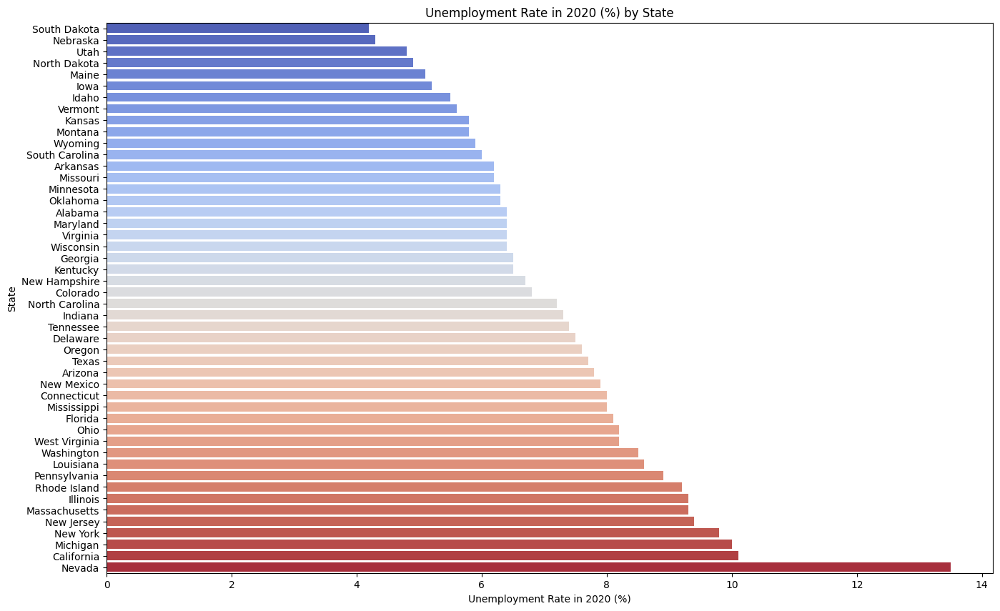

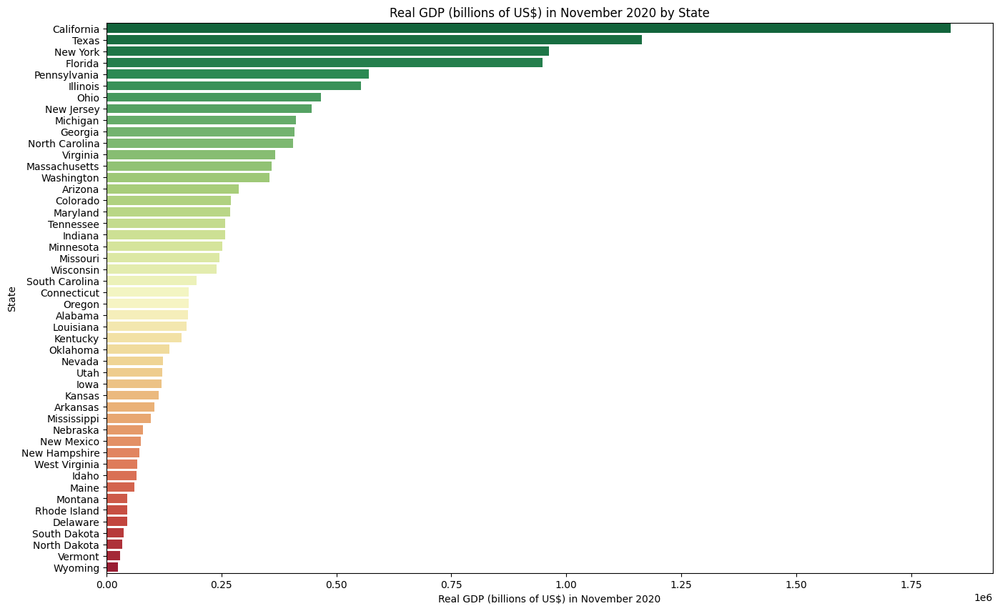

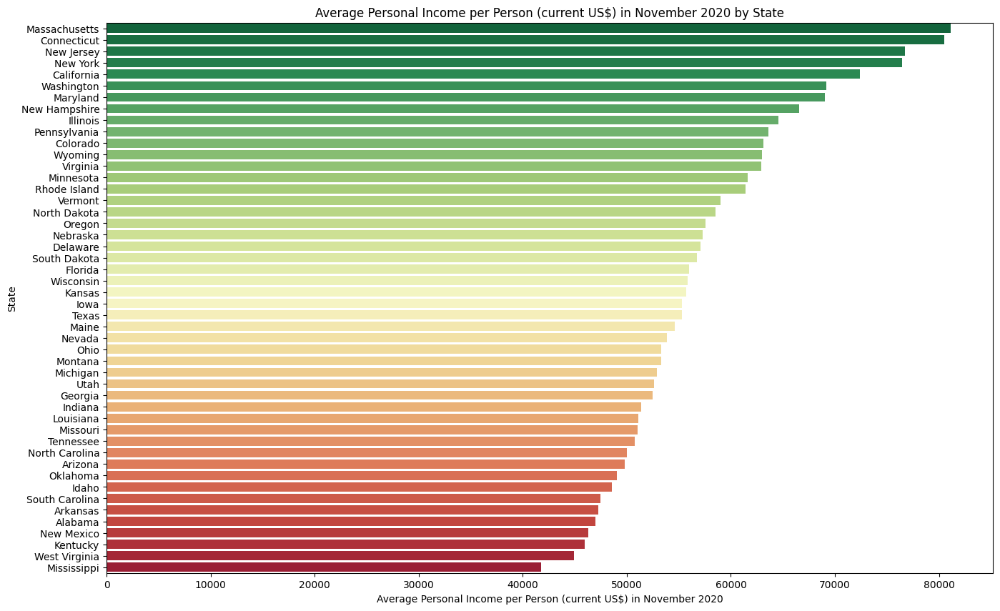

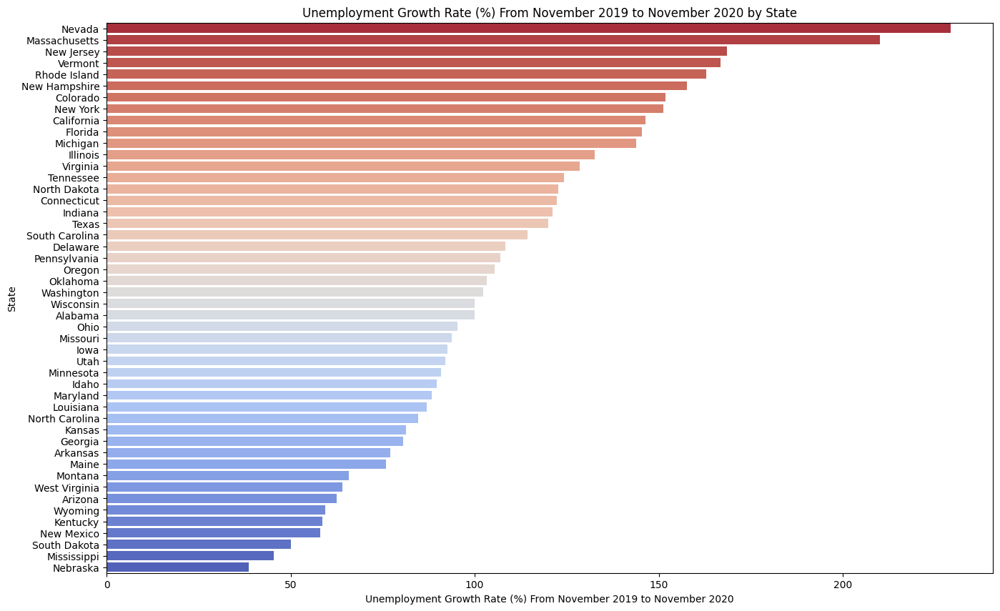

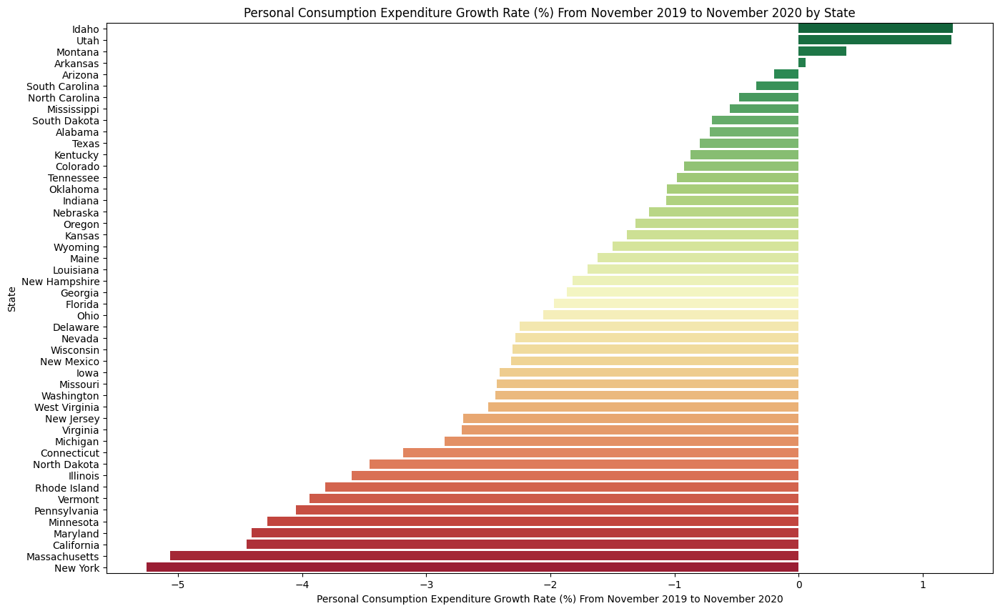

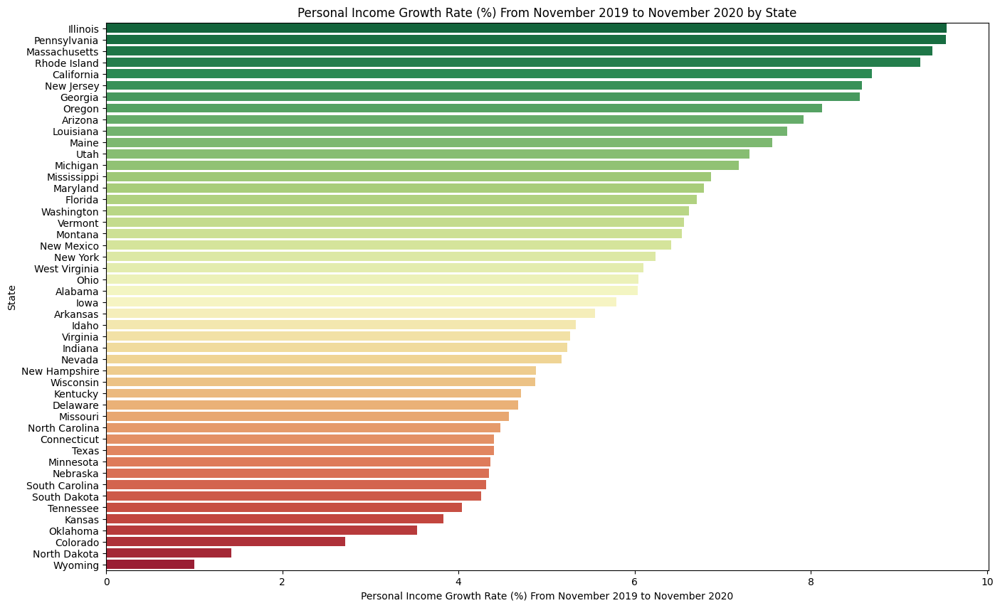

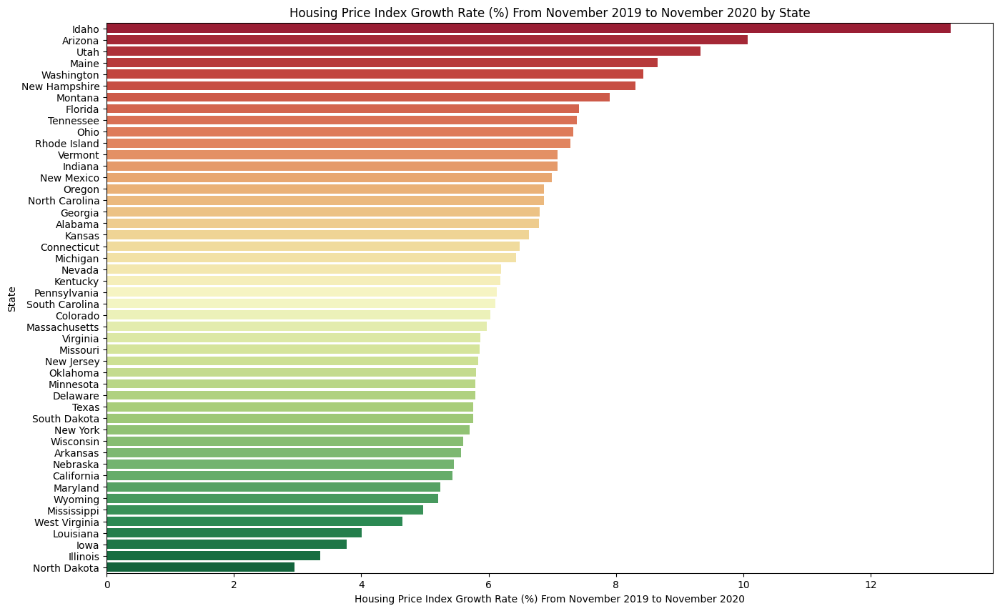

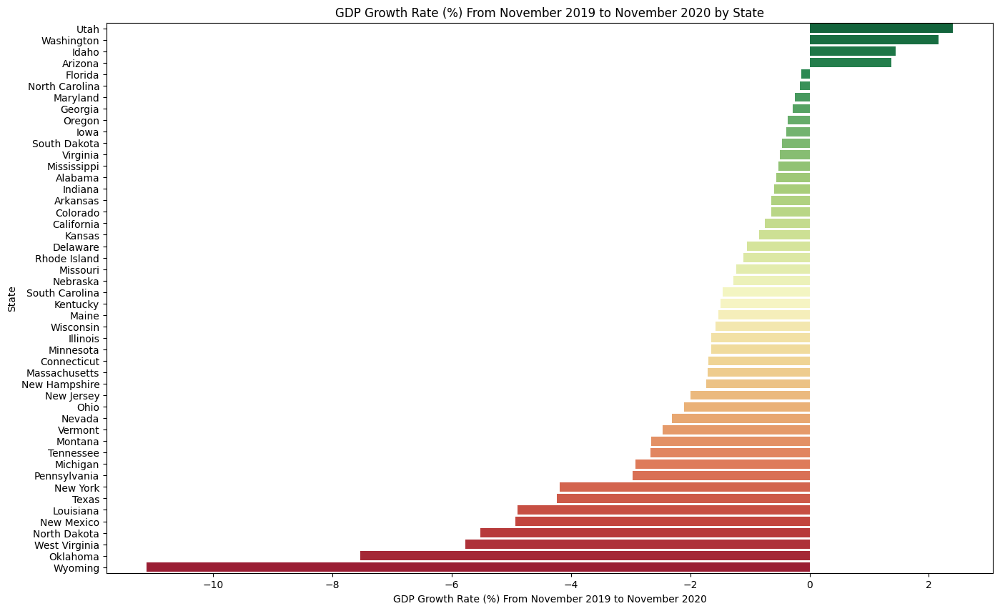

In [50]:
import matplotlib.pyplot as plt
import seaborn as sns
print("I have only included the most heavily weighted economic indicators by American voters for my plots.")

plt.figure(figsize=(16, 10))
sns.barplot(x='Unemployment Rate', y='State', data=merged_data_state, palette='coolwarm')

# Adding title and labels
plt.title('Unemployment Rate in 2020 (%) by State')
plt.xlabel('Unemployment Rate in 2020 (%)')
plt.ylabel('State')
plt.show()

merged_data_state['Unemployment Rank'] = merged_data_state['Unemployment Rate'].rank(ascending=True)

rank_df = merged_data_state[['State', 'Unemployment Rank']]


######
sorted_data = merged_data_state.sort_values(by='State-level Personal Consumption Expenditure', ascending=False)

plt.figure(figsize=(16, 10))
sns.barplot(x='State-level Personal Consumption Expenditure', y='State', data=sorted_data, palette='RdYlGn_r')

# Adding title and labels
plt.title('Real GDP (billions of US$) in November 2020 by State')
plt.xlabel('Real GDP (billions of US$) in November 2020')
plt.ylabel('State')
plt.show()

merged_data_state['Real GDP Rank'] = merged_data_state['State-level Personal Consumption Expenditure'].rank(ascending=True)

rank_df = pd.merge(merged_data_state[['State', 'Real GDP Rank']], rank_df, on='State', how='left')

####
sorted_data = merged_data_state.sort_values(by='Per capita personal income', ascending=False)

plt.figure(figsize=(16, 10))
sns.barplot(x='Per capita personal income', y='State', data=sorted_data, palette='RdYlGn_r')

# Adding title and labels
plt.title('Average Personal Income per Person (current US$) in November 2020 by State')
plt.xlabel('Average Personal Income per Person (current US$) in November 2020')
plt.ylabel('State')
plt.show()

merged_data_state['Personal Income Rank'] = merged_data_state['Per capita personal income'].rank(ascending=True)

rank_df = pd.merge(merged_data_state[['State', 'Personal Income Rank']], rank_df, on='State', how='left')


####

rank_columns = ['Housing Price Index Rank', 'Maximum Local Tax Rate Rank',
                'Combined Rate Rank', 'Avg. Local Tax Rank', 'State Tax Rate Rank',
                'Personal Income Rank', 'Real GDP Rank', 'Unemployment Rank', 
                'Personal Consumption Expenditure Rank']

# Invert ranks for variables where higher rank is worse (Housing, Tax Rates, Unemployment)
# For these, we subtract the rank from the maximum possible rank (e.g., number of states)
max_rank = len(rank_df)

# Invert ranks for the relevant columns
# Optionally, print the DataFrame for checking in the console
# Assuming rank_df_sorted is your DataFrame
# print(rank_df_sorted.to_string(index=False))


# Fix color palettes later

####
sorted_data = merged_data_state_growth.sort_values(by='unemployment_growth_rate', ascending=False)

plt.figure(figsize=(16, 10))
sns.barplot(x='unemployment_growth_rate', y='State', data=sorted_data, palette='coolwarm_r')

# Adding title and labels
plt.title('Unemployment Growth Rate (%) From November 2019 to November 2020 by State')
plt.xlabel('Unemployment Growth Rate (%) From November 2019 to November 2020')
plt.ylabel('State')
plt.show()

merged_data_state_growth['Unemployment Growth Rate Rank'] = merged_data_state_growth['unemployment_growth_rate'].rank(ascending=True)

rank_df = pd.merge(merged_data_state_growth[['State', 'Unemployment Growth Rate Rank']], rank_df, on='State', how='left')

####
sorted_data = merged_data_state_growth.sort_values(by='pce_growth_rate', ascending=False)

plt.figure(figsize=(16, 10))
sns.barplot(x='pce_growth_rate', y='State', data=sorted_data, palette='RdYlGn_r')

# Adding title and labels
plt.title('Personal Consumption Expenditure Growth Rate (%) From November 2019 to November 2020 by State')
plt.xlabel('Personal Consumption Expenditure Growth Rate (%) From November 2019 to November 2020')
plt.ylabel('State')
plt.show()

merged_data_state_growth['Personal Consumption Expenditure Growth Rate Rank'] = merged_data_state_growth['pce_growth_rate'].rank(ascending=True)

rank_df = pd.merge(merged_data_state_growth[['State', 'Personal Consumption Expenditure Growth Rate Rank']], rank_df, on='State', how='left')


####
sorted_data = merged_data_state_growth.sort_values(by='pid_growth_rate', ascending=False)

plt.figure(figsize=(16, 10))
sns.barplot(x='pid_growth_rate', y='State', data=sorted_data, palette='RdYlGn_r')

# Adding title and labels
plt.title('Personal Income Growth Rate (%) From November 2019 to November 2020 by State')
plt.xlabel('Personal Income Growth Rate (%) From November 2019 to November 2020')
plt.ylabel('State')
plt.show()

merged_data_state_growth['Personal Income Growth Rate Rank'] = merged_data_state_growth['pid_growth_rate'].rank(ascending=True)

rank_df = pd.merge(merged_data_state_growth[['State', 'Personal Income Growth Rate Rank']], rank_df, on='State', how='left')


####
sorted_data = merged_data_state_growth.sort_values(by='housing_cost_growth_rate', ascending=False)

plt.figure(figsize=(16, 10))
sns.barplot(x='housing_cost_growth_rate', y='State', data=sorted_data, palette='RdYlGn')

# Adding title and labels
plt.title('Housing Price Index Growth Rate (%) From November 2019 to November 2020 by State')
plt.xlabel('Housing Price Index Growth Rate (%) From November 2019 to November 2020')
plt.ylabel('State')

merged_data_state_growth['Housing Price Index Growth Rate Rank'] = merged_data_state_growth['housing_cost_growth_rate'].rank(ascending=True)

rank_df = pd.merge(merged_data_state_growth[['State', 'Housing Price Index Growth Rate Rank']], rank_df, on='State', how='left')

plt.show()
sorted_data = merged_data_state_growth.sort_values(by='GDP_Growth', ascending=False)

plt.figure(figsize=(16, 10))
sns.barplot(x='GDP_Growth', y='State', data=sorted_data, palette='RdYlGn_r')

# Adding title and labels
plt.title('GDP Growth Rate (%) From November 2019 to November 2020 by State')
plt.xlabel('GDP Growth Rate (%) From November 2019 to November 2020')
plt.ylabel('State')
plt.show()

merged_data_state_growth['GDP Growth Rate Rank'] = merged_data_state_growth['GDP_Growth'].rank(ascending=True)

rank_df = pd.merge(merged_data_state_growth[['State', 'GDP Growth Rate Rank']], rank_df, on='State', how='left')
import warnings
warnings.filterwarnings('ignore')


In [51]:
merged_final.rename(columns={
    'pce_growth_rate': 'State Personal Consumption Expenditure Growth (%)',
    'pid_growth_rate': 'State Personal Income Growth (%)',
    'Avg. Local Tax Rate Growth Rate': 'State Avg. Local Tax Rate Growth Rate',
    'Combined Rate Growth Rate': 'State Combined Rate Growth Rate',
    'Max Local Tax Rate Growth Rate': 'State Max Local Tax Rate Growth Rate',
    'inflation_growth_rate': 'Country Inflation Growth (%)',
    'unemployment_growth_rate': 'State Unemployment Growth Rate',
    'housing_cost_growth_rate': 'State Housing Index Growth Rate',
    'GDP_Growth': 'State GDP Growth Rate',
    '2020 Poverty Rate': 'State 2020 Poverty Rate',
    'Poverty Rate Growth (%)': 'State Poverty Rate Growth (%)',
    '2020 Income Inequality': 'State 2020 Income Inequality',
    'Income Inequality Growth (%)': 'State Income Inequality Growth (%)',
    'Unemployment Rate': 'State Unemployment Rate',
    'State-level Personal Consumption Expenditure': 'State Personal Consumption Expenditure',
    'Per capita personal income': 'State Per Capita Personal Income',
    'Avg. Local Tax Rate': 'State Avg. Local Tax Rate',
    'Combined Rate': 'State Combined Rate',
    'Max Local Tax Rate': 'State Max Local Tax Rate',
    'Country-level Inflation Rate': 'Country Inflation Rate',
    'State-level Housing Index': 'State Housing Index',
    'State-level Current-dollar GDP': 'State Current-dollar GDP',
    'GDP Growth Rate 2019 to 2020': 'Country GDP Growth Rate 2019 to 2020'
}, inplace=True)


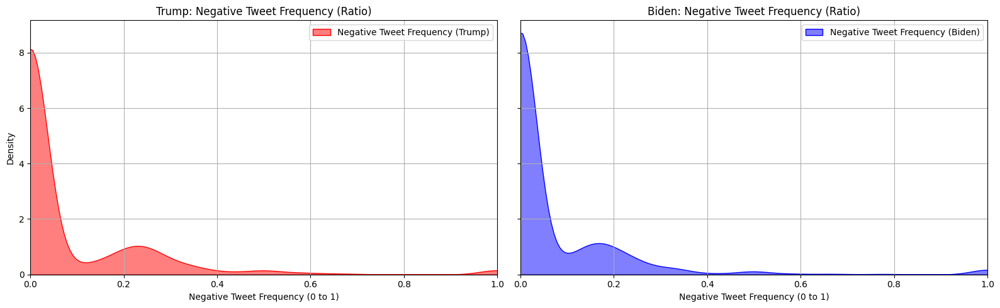

These distributions are similar due to selection bias permeating tweets for all counties.


In [52]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a figure with two subplots side by side
fig, axes = plt.subplots(1, 2, figsize=(16, 5), sharey=True)

# Distribution Plot for Trump
sns.kdeplot(
    merged_final["Negative Tweet Frequency Trump"],
    ax=axes[0],
    label='Negative Tweet Frequency (Trump)',
    fill=True,
    color='red',
    alpha=0.5
)
axes[0].set_title('Trump: Negative Tweet Frequency (Ratio)')
axes[0].set_xlabel('Negative Tweet Frequency (0 to 1)')
axes[0].set_ylabel('Density')
axes[0].legend()
axes[0].grid(True)
axes[0].set_xlim(0, 1)

# Distribution Plot for Biden
sns.kdeplot(
    merged_final["Negative Tweet Frequency Biden"],
    ax=axes[1],
    label='Negative Tweet Frequency (Biden)',
    fill=True,
    color='blue',
    alpha=0.5
)
axes[1].set_title('Biden: Negative Tweet Frequency (Ratio)')
axes[1].set_xlabel('Negative Tweet Frequency (0 to 1)')
axes[1].set_ylabel('')  # Leave y-label blank for cleaner look
axes[1].legend()
axes[1].grid(True)
axes[1].set_xlim(0, 1)

plt.tight_layout()
plt.show()

print("These distributions are similar due to selection bias permeating tweets for all counties.")


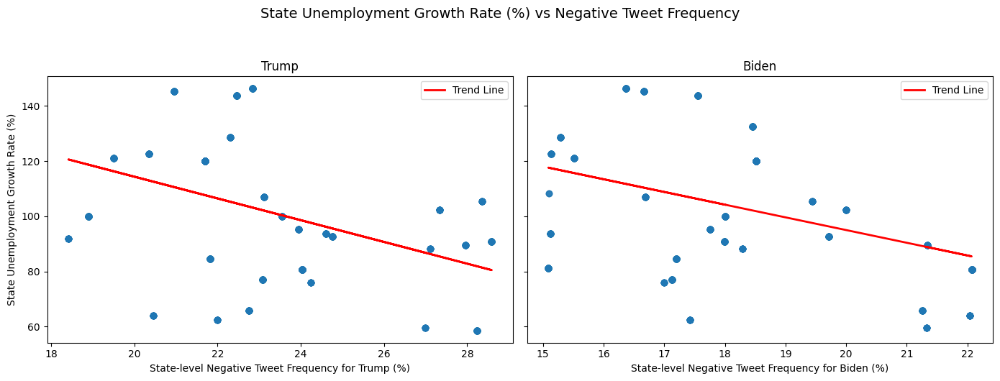

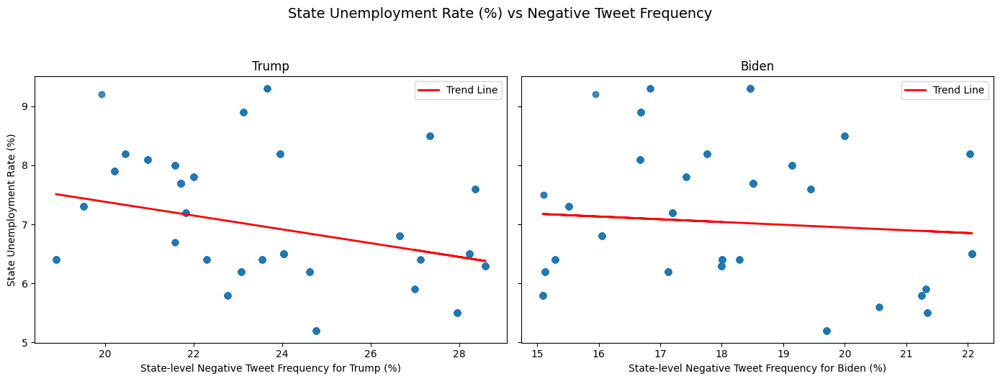

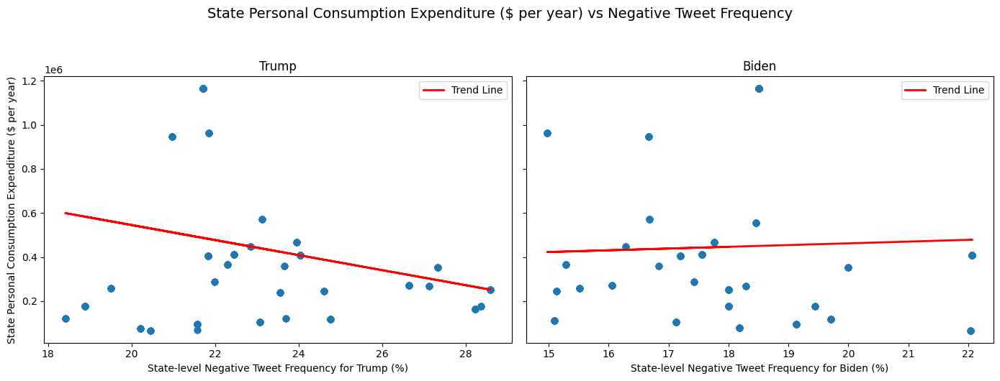

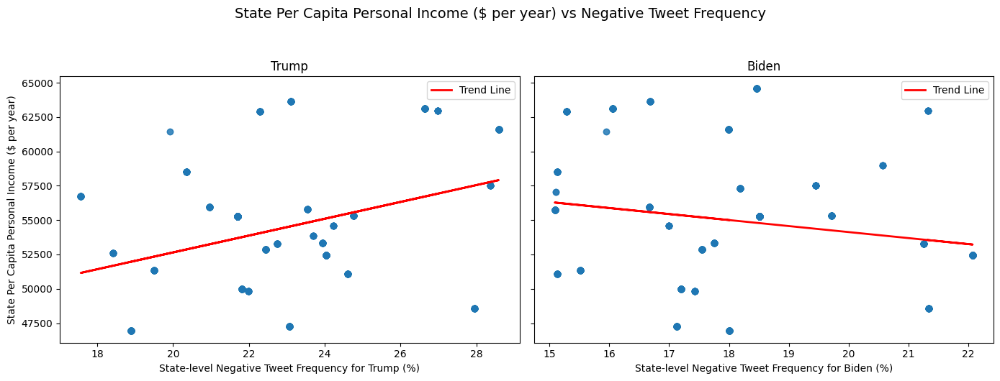

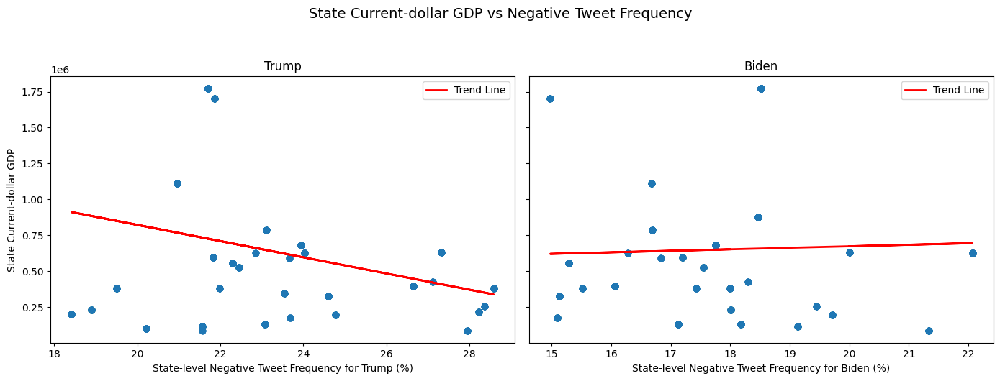

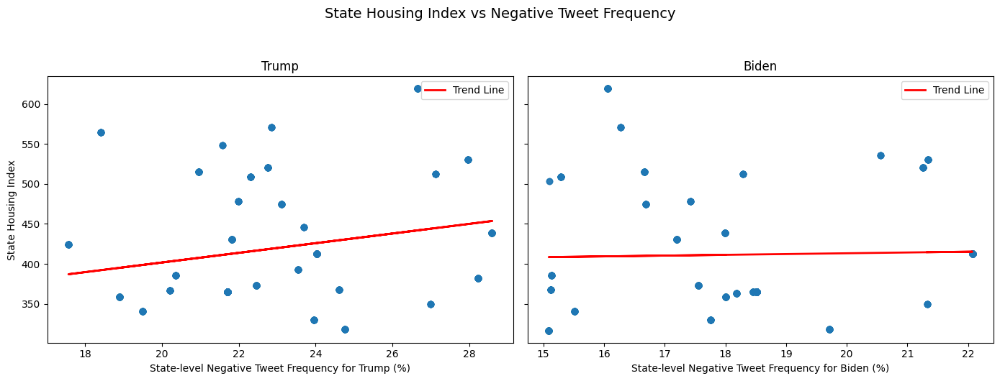

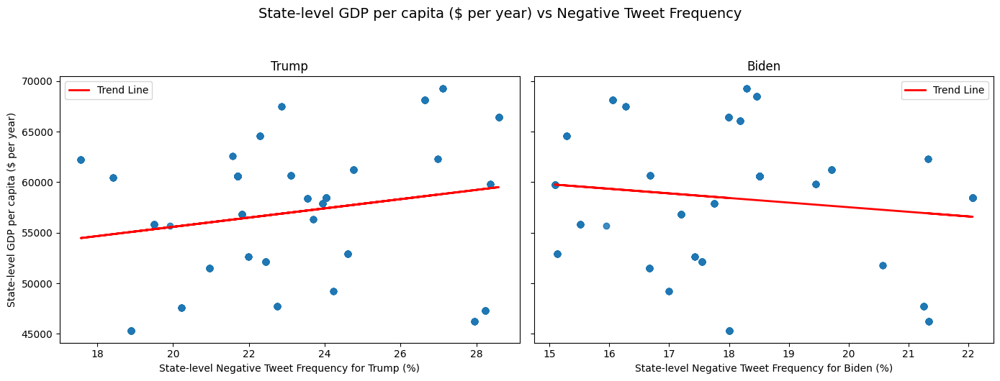

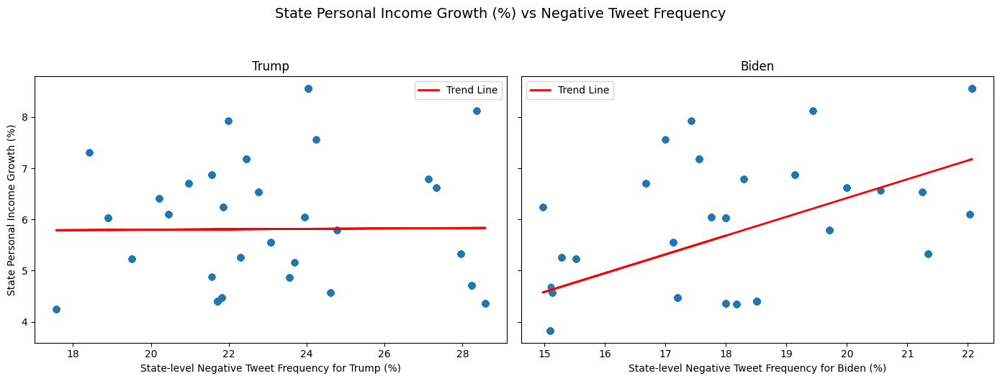

In [53]:
import numpy as np
import matplotlib.pyplot as plt

def add_trend_line(x, y, ax):
    mask = ~np.isnan(x) & ~np.isnan(y)
    x_clean = x[mask]
    y_clean = y[mask]
    m, b = np.polyfit(x_clean, y_clean, 1)  # Linear regression
    ax.plot(x_clean, m * x_clean + b, color='red', linewidth=2, label='Trend Line')
    ax.legend()

def remove_outliers_90_10(df, col_x, col_y):
    """
    Remove outliers for the scatter plot using the 90-10 percentile rule.
    """
    lower_bound_x = np.percentile(df[col_x], 10)
    upper_bound_x = np.percentile(df[col_x], 90)
    lower_bound_y = np.percentile(df[col_y], 10)
    upper_bound_y = np.percentile(df[col_y], 90)
    mask = (
        (df[col_x] >= lower_bound_x) & (df[col_x] <= upper_bound_x) &
        (df[col_y] >= lower_bound_y) & (df[col_y] <= upper_bound_y)
    )
    return df[mask]

# Scale tweet frequency percentages
factor = 100
merged_final['State-level Negative Tweet Frequency Trump'] *= factor
merged_final['State-level Negative Tweet Frequency Biden'] *= factor

# Rename columns for plotting clarity
merged_final.rename(columns={
    'State 2020 Income Inequality': 'State 2020 Income Inequality by Gini Index',
    'State Income Inequality Growth (%)': 'State Income Inequality Growth (%) by Gini Index',
    'State Unemployment Growth Rate': 'State Unemployment Growth Rate (%)',
    'State Unemployment Rate': 'State Unemployment Rate (%)',
    'State Personal Consumption Expenditure Growth': 'State Personal Consumption Expenditure Growth (%)',
    'State Personal Income Growth': 'State Personal Income Growth (%)',
    'State Tax Rate Growth Rate': 'State Tax Rate Growth Rate (%)',
    'State Avg. Local Tax Rate Growth Rate': 'State Avg. Local Tax Rate Growth Rate (%)',
    'State Combined Rate Growth Rate': 'State Combined Rate Growth Rate (%)',
    'State Max Local Tax Rate Growth Rate': 'State Max Local Tax Rate Growth Rate (%)',
    'State Housing Index Growth Rate': 'State Housing Index Growth Rate (%)',
    'State GDP Growth Rate': 'State GDP Growth Rate (%)',
    'State 2020 Poverty Rate': 'State 2020 Poverty Rate (%)',
    'State Poverty Rate Growth': 'State Poverty Rate Growth (%)',
    'State Tax Rate': 'State Tax Rate (%)',
    'State Avg. Local Tax Rate': 'State Avg. Local Tax Rate (%)',
    'State Combined Rate': 'State Combined Rate (%)',
    'State Max Local Tax Rate': 'State Max Local Tax Rate (%)',
    'State Personal Consumption Expenditure': 'State Personal Consumption Expenditure ($ per year)',
    'State Per Capita Personal Income': 'State Per Capita Personal Income ($ per year)',
    'State-level GDP per capita': 'State-level GDP per capita ($ per year)',
    'State-level Negative Tweet Frequency Trump': 'State-level Negative Tweet Frequency for Trump (%)',
    'State-level Negative Tweet Frequency Biden': 'State-level Negative Tweet Frequency for Biden (%)'
}, inplace=True)

# Variables to compare against tweet frequency
state_vars = [
    'State Unemployment Growth Rate (%)',
    'State Unemployment Rate (%)',
    'State Personal Consumption Expenditure ($ per year)',
    'State Per Capita Personal Income ($ per year)',
    'State Current-dollar GDP',
    'State Housing Index',
    'State-level GDP per capita ($ per year)',
    'State Personal Income Growth (%)'
]

# Plot side-by-side scatter plots for each variable
for state_var in state_vars:
    if state_var in merged_final.columns:
        fig, axes = plt.subplots(1, 2, figsize=(14, 5), sharey=True)
        fig.suptitle(f"{state_var} vs Negative Tweet Frequency", fontsize=14, y=1.05)

        for i, tweet_var in enumerate(['State-level Negative Tweet Frequency for Trump (%)', 'State-level Negative Tweet Frequency for Biden (%)']):
            if tweet_var in merged_final.columns:
                clean_data = remove_outliers_90_10(merged_final, tweet_var, state_var)
                ax = axes[i]
                ax.scatter(clean_data[tweet_var], clean_data[state_var], alpha=0.6)
                add_trend_line(clean_data[tweet_var], clean_data[state_var], ax)
                ax.set_xlabel(tweet_var)
                if i == 0:
                    ax.set_ylabel(state_var)
                ax.set_title(tweet_var.split("for ")[-1].replace(" (%)", ""))
            else:
                print(f"Skipping plot for {tweet_var} as it's not in the dataset.")

        plt.tight_layout()
        plt.show()
    else:
        print(f"Skipping plot for {state_var} as it's not in the dataset.")

# Revert column names and rescale tweet frequencies
merged_final.rename(columns={
    'State 2020 Income Inequality by Gini Index': 'State 2020 Income Inequality',
    'State Income Inequality Growth (%) by Gini Index': 'State Income Inequality Growth (%)',
    'State Unemployment Growth Rate (%)': 'State Unemployment Growth Rate',
    'State Unemployment Rate (%)': 'State Unemployment Rate',
    'State Personal Consumption Expenditure Growth (%)': 'State Personal Consumption Expenditure Growth',
    'State Personal Income Growth (%)': 'State Personal Income Growth',
    'State Tax Rate Growth Rate (%)': 'State Tax Rate Growth Rate',
    'State Avg. Local Tax Rate Growth Rate (%)': 'State Avg. Local Tax Rate Growth Rate',
    'State Combined Rate Growth Rate (%)': 'State Combined Rate Growth Rate',
    'State Max Local Tax Rate Growth Rate (%)': 'State Max Local Tax Rate Growth Rate',
    'State Housing Index Growth Rate (%)': 'State Housing Index Growth Rate',
    'State GDP Growth Rate (%)': 'State GDP Growth Rate',
    'State 2020 Poverty Rate (%)': 'State 2020 Poverty Rate',
    'State Poverty Rate Growth (%)': 'State Poverty Rate Growth',
    'State Tax Rate (%)': 'State Tax Rate',
    'State Avg. Local Tax Rate (%)': 'State Avg. Local Tax Rate',
    'State Combined Rate (%)': 'State Combined Rate',
    'State Max Local Tax Rate (%)': 'State Max Local Tax Rate',
    'State Personal Consumption Expenditure ($ per year)' :'State Personal Consumption Expenditure',
    'State Per Capita Personal Income ($ per year)': 'State Per Capita Personal Income',
    'State-level GDP per capita ($ per year)': 'State-level GDP per capita',
    'State-level Negative Tweet Frequency for Trump (%)': 'State-level Negative Tweet Frequency Trump',
    'State-level Negative Tweet Frequency for Biden (%)': 'State-level Negative Tweet Frequency Biden'
}, inplace=True)

merged_final['State-level Negative Tweet Frequency Trump'] /= factor
merged_final['State-level Negative Tweet Frequency Biden'] /= factor


At first, it may seem unintuitive to place negative tweet frequency as my $\textit{X}$ variable and the economic factors as my y variable. However, if the order is inverted, the plots become very messy and difficult to interpret. All dollar values are in 2020-USD, and all growth percentages reflect changes from November 2019 to November 2020. Additionally, I have excluded all scatterplots with insignificant relationships. These include: state tax rate growth rate, state avg. local tax rate growth rate, state combined rate growth rate, state max local tax rate growth rate, state GDP growth rate, state 2020 poverty rate, state poverty rate growth, state tax rate, state avg. local tax rate, state combined rate, state max local tax rate, state personal income growth, and state income inequality growth (%) by gini index. Notably, the relationship between these economic indicators and negative tweet frequency for Biden appears weaker relative to Trump. Lastly, please note that I have removed outliers for these plots as well.

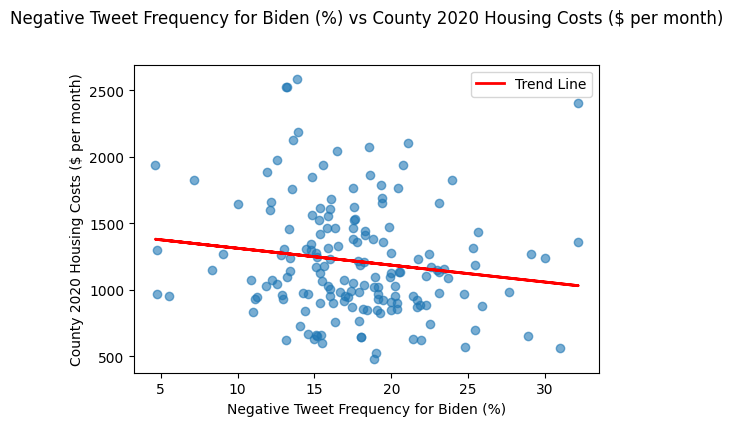

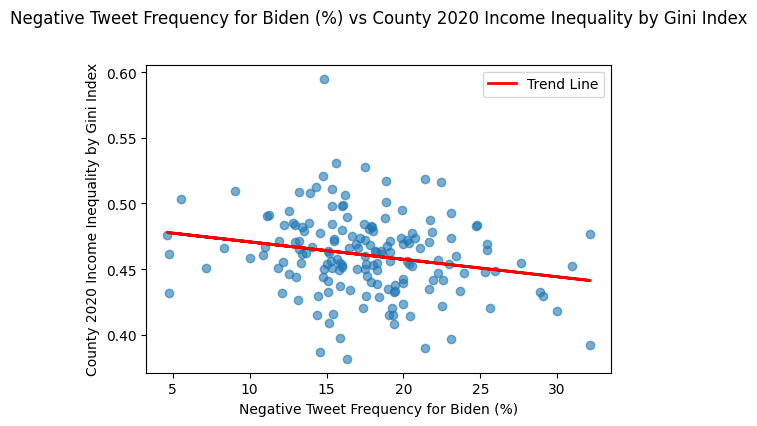

In [54]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
factor = 100  # You can change this factor to any number you like

merged_final['Negative Tweet Frequency Trump'] =  merged_final['Negative Tweet Frequency Trump'] * factor

merged_final['Negative Tweet Frequency Biden'] =  merged_final['Negative Tweet Frequency Biden'] * factor


# Filter dataset: Omit counties with fewer than 30 total tweets for Trump and Biden
filtered_data = merged_final[
    (merged_final['Total Tweet Count Trump'] >= 30) &
    (merged_final['Total Tweet Count Biden'] >= 30)
]

# Function to add trend lines
def add_trend_line(x, y, ax):
    mask = ~np.isnan(x) & ~np.isnan(y)
    x_clean = x[mask]
    y_clean = y[mask]
    m, b = np.polyfit(x_clean, y_clean, 1)  # Linear regression
    ax.plot(x_clean, m * x_clean + b, color='red', linewidth=2, label='Trend Line')
    ax.legend()

filtered_data.rename(columns={
    'County 2020 Housing Costs': 'County 2020 Housing Costs ($ per month)',
    'County 2020 Income': 'County 2020 Personal Income per Capita ($ per year)',
    'County 2020 Gini Index': 'County 2020 Income Inequality by Gini Index',
    'County 2020 Poverty Rate': 'County 2020 Poverty Rate (%)',
    'County 2020 Unemployment Rate': 'County 2020 Unemployment Rate (%)',
    'Negative Tweet Frequency Trump': 'Negative Tweet Frequency for Trump (%)',
    'Negative Tweet Frequency Biden': 'Negative Tweet Frequency for Biden (%)'
}, inplace=True)
# List of county variables for plotting
county_vars = [
    'County 2020 Housing Costs ($ per month)',
    'County 2020 Income Inequality by Gini Index'
]
# Generate scatter plots with trend lines for each tweet variable
for tweet_var in ['Negative Tweet Frequency for Biden (%)']:
    for county_var in county_vars:
        if tweet_var in filtered_data.columns and county_var in filtered_data.columns:
            plt.figure(figsize=(6, 4))
            plt.scatter(filtered_data[tweet_var], filtered_data[county_var], alpha=0.6)
            plt.title(f"{tweet_var} vs {county_var}")

            # Adjusted title with higher position
            plt.title(f"{tweet_var} vs {county_var}", pad=30)  # Increased `pad` value for more spacing

            plt.xlabel(tweet_var)
            plt.ylabel(county_var)
            add_trend_line(filtered_data[tweet_var], filtered_data[county_var], plt.gca())
            plt.show()
        else:
            print(f"Skipping plot for {county_var} as it's not in the dataset.")

filtered_data.rename(columns={
    'County 2020 Housing Costs ($ per month)': 'County 2020 Housing Costs',
    'County 2020 Personal Income per Capita ($ per year)': 'County 2020 Income',
    'County 2020 Income Inequality by Gini Index': 'County 2020 Gini Index',
    'County 2020 Poverty Rate (%)': 'County 2020 Poverty Rate',
    'County 2020 Unemployment Rate (%)': 'County 2020 Unemployment Rate',
    'Negative Tweet Frequency for Trump (%)': 'Negative Tweet Frequency Trump',
    'Negative Tweet Frequency for Biden (%)': 'Negative Tweet Frequency Biden'

}, inplace=True)

merged_final['Negative Tweet Frequency Trump'] =  merged_final['Negative Tweet Frequency Trump'] / factor

merged_final['Negative Tweet Frequency Biden'] =  merged_final['Negative Tweet Frequency Biden'] / factor



This set of scatterplots examines the relationship between negative tweet frequency and county-level economic indicators. All dollar values are in 2020-USD, and all growth percentages reflect changes from November 2019 to November 2020. All other state and county-level variables showed insignificant relationships with negative tweet frequency for Biden and Trump, so I omitted them from the scatterplots to save space. Interestingly, negative tweet frequency for Trump did not exhibit any significant relationships with county-level economic indicators.

### Figure Interpretation
To begin, our distribution of negative tweet frequencies for Trump and Biden is heavily
skewed to the left due to many counties not having any tweets; this indicates selection bias permeating tweets counts for all counties, which may stem from low population and/or social media usage. We anticipate that the more severe the economic decline in terms of growth, the stronger the negative sentiment, reflecting american tweeters' retrospective nature. Key economic indicators such as the unemployment rate and its growth reflect economic distress, which often negatively affects sentiment toward incumbents, especially when tweeters evaluate leadership retrospectively and sociotropically. Similarly, GDP and its growth rate serve as critical measures of overall economic health, with significant declines likely eroding public confidence in leadership. The housing price index and its growth provide insight into perceived wealth and economic stability, indirectly shaping tweeter sentiment through economic confidence.

Personal consumption expenditure and income highlight economic well-being and purchasing power, with reductions signaling economic hardship that can sway tweeter preferences. Observed patterns reveal that states experiencing high unemployment or GDP declines tend to exhibit heightened overall economic distress, potentially amplifying regional dissatisfaction with leadership. Overall, the best-performing states are Idaho, Texas, and Massachusetts, reflecting robust consumer spending, and high personal income; we expect these states to have the lowest frequency of negative tweets towards the incumbent. Conversely, the worst-performing states are Nevada, Wyoming, and Mississippi, which face high unemployment, and weaker income levels, potentially driving negative public sentiment toward leadership in these regions; we expect the opposite effect in terms of negative tweet frequency.

Finally, my scatterplots show that, overall, American tweeters are more responsive to state-level economic conditions than county-level economic conditions. In addition, most tweeters do not seem to have preference for growth rates (retrospective) over current economic conditions. In addition, many of our scatter plots with significant relationships completely deviated from economic voting theory. For example, the growth rate of personal income per capita is positively correlated with negative tweet frequency for Trump. In addition, it seems like Trump is a more polarizing figure relative to Biden as the state-level relationships between economic variables and negative tweet frequency are stronger for Trump than Biden. Albeit rare, some line plots were consistent with economic voting theory. For example, even though state-level income growth has little association with negative tweets toward Trump, tweet negativity increases as income growth rises for Biden—strongly supporting economic voting theory. Crucially, these scatterplots suggest that most important state-level economic indicators are unemployment rate growth, unemployment rate, housing index, personal consumption expenditure, per capita personal income and its growth, and current-dollar GDP and its per capita equivalent by the strength of their correlation. Conversely, the most flagrant county-level economic indicators are housing costs per month and income inequality by Gini index.



# 2. Project Two

## 2.1 THE MESSAGE!
Poor economic conditions, largely captured by unemployment rate for the average American tweeter, lead to more negative sentiment toward the president (Trump) and positive sentiment toward the challenger (Biden) on Twitter, as economic voting theory would predict. NEeds more interpretation apparently


All growth percentages are from November 2019 to November 2020
All points are replaced by their state abbreviations


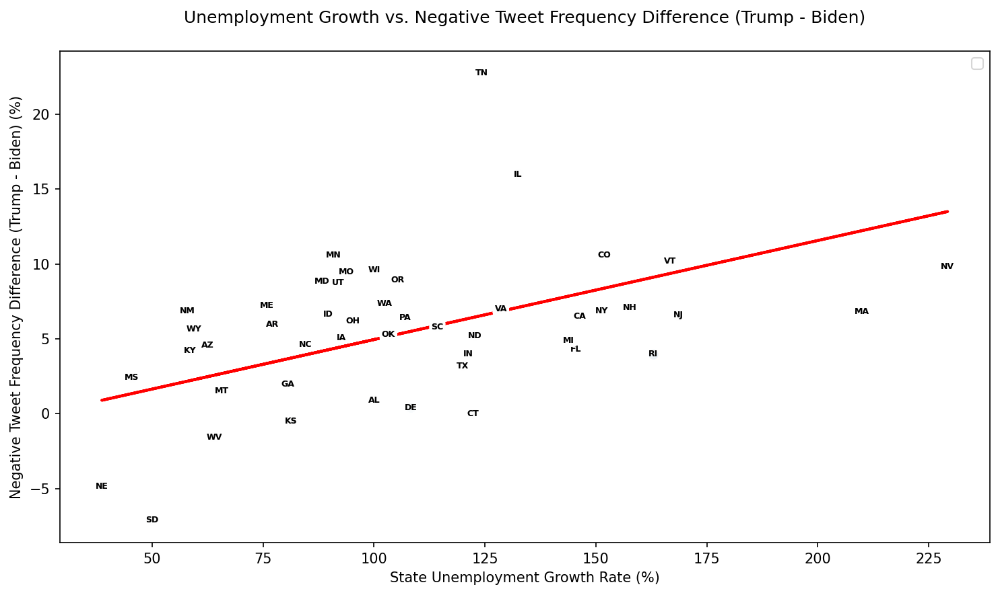

In [55]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams

# Optional: Increase DPI for better clarity
rcParams['figure.dpi'] = 150

print("All growth percentages are from November 2019 to November 2020")
print("All points are replaced by their state abbreviations")

# Map state names to abbreviations
state_name_to_abbrev = {
    'Alabama': 'AL', 'Alaska': 'AK', 'Arizona': 'AZ', 'Arkansas': 'AR', 'California': 'CA',
    'Colorado': 'CO', 'Connecticut': 'CT', 'Delaware': 'DE', 'Florida': 'FL', 'Georgia': 'GA',
    'Hawaii': 'HI', 'Idaho': 'ID', 'Illinois': 'IL', 'Indiana': 'IN', 'Iowa': 'IA',
    'Kansas': 'KS', 'Kentucky': 'KY', 'Louisiana': 'LA', 'Maine': 'ME', 'Maryland': 'MD',
    'Massachusetts': 'MA', 'Michigan': 'MI', 'Minnesota': 'MN', 'Mississippi': 'MS',
    'Missouri': 'MO', 'Montana': 'MT', 'Nebraska': 'NE', 'Nevada': 'NV', 'New Hampshire': 'NH',
    'New Jersey': 'NJ', 'New Mexico': 'NM', 'New York': 'NY', 'North Carolina': 'NC',
    'North Dakota': 'ND', 'Ohio': 'OH', 'Oklahoma': 'OK', 'Oregon': 'OR', 'Pennsylvania': 'PA',
    'Rhode Island': 'RI', 'South Carolina': 'SC', 'South Dakota': 'SD', 'Tennessee': 'TN',
    'Texas': 'TX', 'Utah': 'UT', 'Vermont': 'VT', 'Virginia': 'VA', 'Washington': 'WA',
    'West Virginia': 'WV', 'Wisconsin': 'WI', 'Wyoming': 'WY'
}

# Add abbreviation column
merged_final['State Abbr'] = merged_final['State'].map(state_name_to_abbrev)

def add_trend_line(y, x, ax): 
    mask = ~np.isnan(x) & ~np.isnan(y)
    x_clean = x[mask]
    y_clean = y[mask]
    m, b = np.polyfit(y_clean, x_clean, 1)
    ax.plot(y_clean, m * y_clean + b, color='red', linewidth=2)
    ax.legend()

# Rename columns for clarity
merged_final.rename(columns={
    'State Unemployment Growth Rate': 'State Unemployment Growth Rate (%)',
    'State-level Negative Tweet Frequency Trump': 'State-level Negative Tweet Frequency for Trump (%)',
    'State-level Negative Tweet Frequency Biden': 'State-level Negative Tweet Frequency for Biden (%)'
}, inplace=True)

# Compute tweet frequency difference
factor = 100
merged_final['Negative Tweet Frequency Difference'] = (
    merged_final['State-level Negative Tweet Frequency for Trump (%)'] -
    merged_final['State-level Negative Tweet Frequency for Biden (%)']
) * factor

# Plot
plt.figure(figsize=(10, 6))

plt.scatter(merged_final['State Unemployment Growth Rate (%)'],
            merged_final['Negative Tweet Frequency Difference'],
            alpha=0.6)

# Add state abbreviation labels
for i, row in merged_final.iterrows():
    x = row['State Unemployment Growth Rate (%)']
    y = row['Negative Tweet Frequency Difference']
    label = row['State Abbr']
    if pd.notna(label):
        plt.text(x, y, label, fontsize=6, weight='bold', ha='center', va='center',
                 bbox=dict(facecolor='white', edgecolor='none', alpha=0.7, boxstyle='round,pad=0.2'))

# Titles and labels
plt.title("Unemployment Growth vs. Negative Tweet Frequency Difference (Trump - Biden)", pad=20)
plt.xlabel("State Unemployment Growth Rate (%)")
plt.ylabel("Negative Tweet Frequency Difference (Trump - Biden) (%)")

# Trend line
add_trend_line(merged_final['State Unemployment Growth Rate (%)'],
               merged_final['Negative Tweet Frequency Difference'],
               plt.gca())

plt.tight_layout()
plt.show()

# Revert column names
merged_final.rename(columns={
    'State Unemployment Growth Rate (%)': 'State Unemployment Growth Rate',
    'State-level Negative Tweet Frequency for Trump (%)': 'State-level Negative Tweet Frequency Trump',
    'State-level Negative Tweet Frequency for Biden (%)': 'State-level Negative Tweet Frequency Biden'
}, inplace=True)


## 2.2 Maps and Interpretations

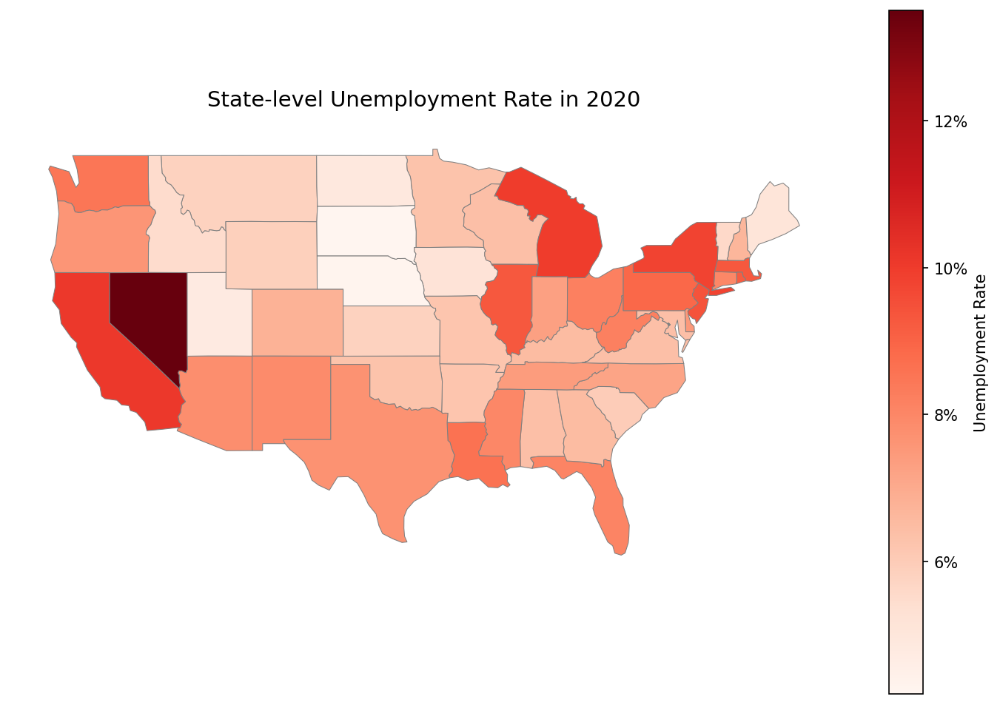

"create_static_map(map_data, 'unemployment_growth_rate', 'State-level Unemployment Growth Rate from 2019 to 2020 (%)', 'Reds', 'Unemployment Growth Rate (%)', '%')\ncreate_static_map(map_data, 'State-level Housing Index', \n                   'Housing Price Index in 2020 by State', 'Reds', \n                   'Housing Index', ' ')\ncreate_static_map(map_data, 'State-level Personal Consumption Expenditure', \n                   'Personal Consumption Expenditure in 2020 (Billions of US$) by State', 'Greens', \n                   'Personal Consumption', ' Billion $')\ncreate_static_map(map_data, 'Per capita personal income', \n                   'Average Income per Person (US$ per year) in 2020 by State', 'Greens', \n                   'Per Capita Income', '$')\ncreate_static_map(map_data, 'State-level Current-dollar GDP', \n                   'Real GDP (Billions of US$) in 2020 by State', 'Greens', \n                   'GDP', ' Billion $')\n"

In [56]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from cartopy.io.shapereader import natural_earth
merged_state = merged_data_state_growth.merge(
    merged_data_state,
    on='State',          # Key column for merging
    how='inner'          # Choose the merge type (more on this below)
)

# Exclude Alaska and Hawaii
us_map = gpd.read_file(natural_earth(resolution='110m', category='cultural', name='admin_1_states_provinces'))
us_map = us_map[us_map['admin'] == 'United States of America']
us_map = us_map[~us_map['name'].isin(['Alaska', 'Hawaii'])]

# Standardize state names
us_map['State'] = us_map['name']

# Merge the dataset
map_data = us_map.merge(merged_state, on='State', how='left')

# Enhanced mapping function with units in the legend
def create_static_map(data, column, title, cmap='viridis', legend_title=None, legend_unit=None):
    fig, ax = plt.subplots(1, 1, figsize=(12, 8))

    # Data scaling and improved color mapping
    vmin = data[column].min()
    vmax = data[column].max()

    # Plot the data without auto-legend
    plot = data.plot(column=column, 
                     ax=ax, 
                     cmap=cmap, 
                     vmin=vmin, 
                     vmax=vmax, 
                     edgecolor='grey',
                     linewidth=0.5,
                     legend=False,  # Disable automatic legend
                     missing_kwds={
                         "color": "grey", 
                         "edgecolor": "grey",
                         "hatch": "///",
                         "label": "Missing data"
                     })

    # Custom colorbar with units directly on tick labels
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
    cbar = fig.colorbar(sm, ax=ax)
    cbar.set_label(legend_title if legend_title else '')
    cbar.ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"{x:.0f}{legend_unit}"))

    # Clearer title and visual spacing
    ax.set_title(title, fontsize=14, pad=15)
    ax.axis('off')
    plt.show()

# Example map creation
create_static_map(map_data, 'Unemployment Rate', 'State-level Unemployment Rate in 2020', 'Reds', 'Unemployment Rate', '%')
'''create_static_map(map_data, 'unemployment_growth_rate', 'State-level Unemployment Growth Rate from 2019 to 2020 (%)', 'Reds', 'Unemployment Growth Rate (%)', '%')
create_static_map(map_data, 'State-level Housing Index', 
                   'Housing Price Index in 2020 by State', 'Reds', 
                   'Housing Index', ' ')
create_static_map(map_data, 'State-level Personal Consumption Expenditure', 
                   'Personal Consumption Expenditure in 2020 (Billions of US$) by State', 'Greens', 
                   'Personal Consumption', ' Billion $')
create_static_map(map_data, 'Per capita personal income', 
                   'Average Income per Person (US$ per year) in 2020 by State', 'Greens', 
                   'Per Capita Income', '$')
create_static_map(map_data, 'State-level Current-dollar GDP', 
                   'Real GDP (Billions of US$) in 2020 by State', 'Greens', 
                   'GDP', ' Billion $')
'''#################### NEEEEEED TO IMPROVE MY LEGEND AND OMIT ALASKA AND HAWAII ####################

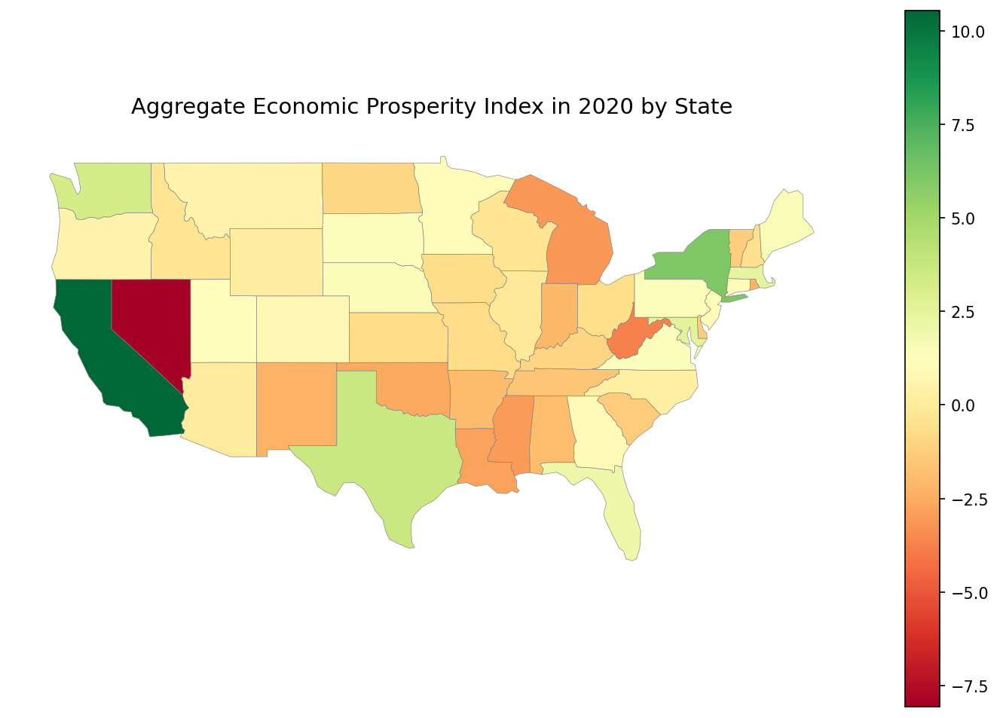

In [57]:
from scipy.stats import zscore  # For Standardization
# Standardize function with direction adjustment
def standardize_and_adjust(data, column, direction='positive'):
    z_score = zscore(data[column].fillna(data[column].mean()))  # Standardization
    return z_score if direction == 'positive' else -z_score  # Invert negative indicators

# List of indicators with direction for aggregation
indicator_config = {
    'Unemployment Rate': 'negative',
    'unemployment_growth_rate': 'negative',
    'State-level Housing Index': 'positive',
    'State-level Personal Consumption Expenditure': 'positive',
    'Per capita personal income': 'positive',
    'State-level Current-dollar GDP': 'positive'
}

# Standardize and adjust data
for column, direction in indicator_config.items():
    map_data[column + '_std'] = standardize_and_adjust(map_data, column, direction)

# Calculate the Economic Prosperity Index
map_data['Economic Prosperity Index'] = map_data[[col + '_std' for col in indicator_config]].sum(axis=1)

# Plot the Aggregate Map
def create_prosperity_map(data, column, title, cmap='RdYlGn'):  # Red to Green for prosperity
    fig, ax = plt.subplots(1, 1, figsize=(12, 8))
    
    vmin, vmax = data[column].min(), data[column].max()

    data.plot(column=column, 
              ax=ax, 
              legend=True, 
              cmap=cmap, 
              vmin=vmin, 
              vmax=vmax, 
              edgecolor='grey', 
              linewidth=0.3,
              missing_kwds={
                  "color": "grey", 
                  "edgecolor": "grey",
                  "hatch": "///",
                  "label": "Missing data"
              })

    ax.set_title(title, fontsize=14, pad=15)
    ax.axis('off')
    plt.show()

# Create the aggregate map
create_prosperity_map(map_data, 
                      'Economic Prosperity Index', 
                      'Aggregate Economic Prosperity Index in 2020 by State')


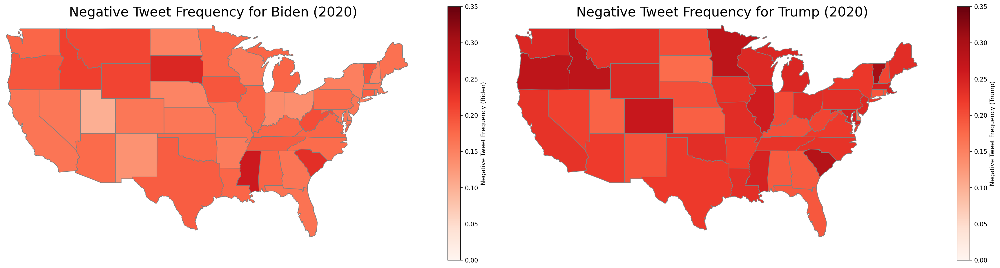

In [58]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import warnings
warnings.filterwarnings('ignore')

# Load data
biden_data = pd.read_csv(r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Code\state_negative_tweet_frequency_biden.csv")
trump_data = pd.read_csv(r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Code\state_negative_tweet_frequency_trump.csv")

# Clean column names
biden_data.columns = biden_data.columns.str.strip()
trump_data.columns = trump_data.columns.str.strip()

# Ensure numeric data
biden_data['Negative Tweet Frequency Biden'] = pd.to_numeric(biden_data['Negative Tweet Frequency Biden'], errors='coerce')
biden_data['Total Tweet Count Biden'] = pd.to_numeric(biden_data['Total Tweet Count Biden'], errors='coerce')
trump_data['Negative Tweet Frequency Trump'] = pd.to_numeric(trump_data['Negative Tweet Frequency Trump'], errors='coerce')
trump_data['Total Tweet Count Trump'] = pd.to_numeric(trump_data['Total Tweet Count Trump'], errors='coerce')

# Calculate negative tweets
biden_data['Negative Tweets'] = biden_data['Negative Tweet Frequency Biden'] * biden_data['Total Tweet Count Biden']
trump_data['Negative Tweets'] = trump_data['Negative Tweet Frequency Trump'] * trump_data['Total Tweet Count Trump']

# Aggregate data to state-level using weighted average
biden_state_data = biden_data.groupby('state').agg({
    'Negative Tweets': 'sum',
    'Total Tweet Count Biden': 'sum'
}).reset_index()

trump_state_data = trump_data.groupby('state').agg({
    'Negative Tweets': 'sum',
    'Total Tweet Count Trump': 'sum'
}).reset_index()

# Calculate state-level negative tweet frequency
biden_state_data['Negative Tweet Frequency Biden'] = biden_state_data['Negative Tweets'] / biden_state_data['Total Tweet Count Biden']
trump_state_data['Negative Tweet Frequency Trump'] = trump_state_data['Negative Tweets'] / trump_state_data['Total Tweet Count Trump']

# Load GeoDataFrame with US state boundaries
us_states = gpd.read_file("https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json")

# Remove Alaska and Hawaii
us_states = us_states[~us_states['name'].isin(['Alaska', 'Hawaii'])]

# Merge with tweet data
us_states_biden = us_states.merge(biden_state_data, left_on='name', right_on='state')
us_states_trump = us_states.merge(trump_state_data, left_on='name', right_on='state')

# Create side-by-side maps
fig, axes = plt.subplots(1, 2, figsize=(24, 12))

# Biden Map
biden_plot = us_states_biden.plot(
    column='Negative Tweet Frequency Biden',
    cmap='Reds',
    legend=True,
    vmin=0, vmax=0.35,
    legend_kwds={'label': "Negative Tweet Frequency (Biden)", 'shrink': 0.5},
    edgecolor='grey',
    ax=axes[0]
)
axes[0].set_title("Negative Tweet Frequency for Biden (2020)", fontsize=22)
axes[0].set_xlim([-125, -65])
axes[0].set_ylim([24, 50])
axes[0].axis('off')

# Resize Biden legend ticks
biden_cbar = biden_plot.get_figure().get_axes()[-1]
biden_cbar.tick_params(labelsize=10)

# Trump Map
trump_plot = us_states_trump.plot(
    column='Negative Tweet Frequency Trump',
    cmap='Reds',
    legend=True,
    vmin=0, vmax=0.35,
    legend_kwds={'label': "Negative Tweet Frequency (Trump)", 'shrink': 0.5},
    edgecolor='grey',
    ax=axes[1]
)
axes[1].set_title("Negative Tweet Frequency for Trump (2020)", fontsize=22)
axes[1].set_xlim([-125, -65])
axes[1].set_ylim([24, 50])
axes[1].axis('off')

# Resize Trump legend ticks
trump_cbar = trump_plot.get_figure().get_axes()[-1]
trump_cbar.tick_params(labelsize=10)

plt.tight_layout()
plt.show()


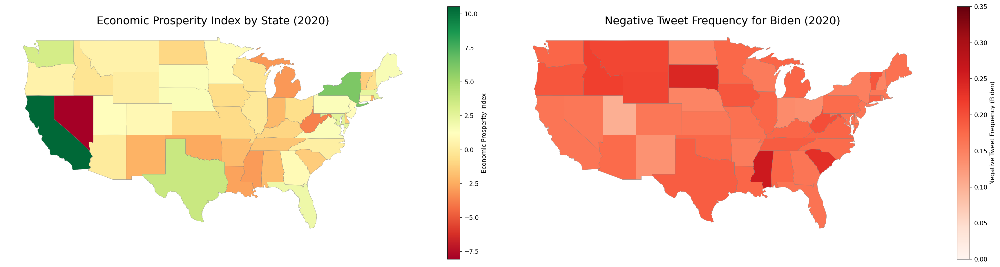

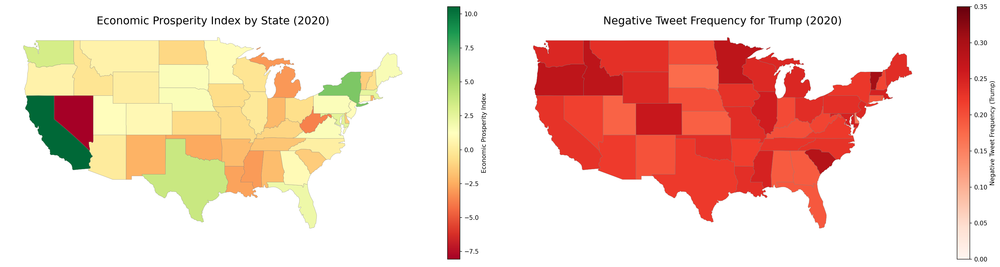

In [59]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import zscore
import warnings
warnings.filterwarnings('ignore')

# --- Standardize Function ---
def standardize_and_adjust(data, column, direction='positive'):
    z = zscore(data[column].fillna(data[column].mean()))
    return z if direction == 'positive' else -z

# --- Economic Indicator Config ---
indicator_config = {
    'Unemployment Rate': 'negative',
    'unemployment_growth_rate': 'negative',
    'State-level Housing Index': 'positive',
    'State-level Personal Consumption Expenditure': 'positive',
    'Per capita personal income': 'positive',
    'State-level Current-dollar GDP': 'positive'
}

# --- Standardize & Create Index ---
for column, direction in indicator_config.items():
    map_data[column + '_std'] = standardize_and_adjust(map_data, column, direction)
map_data['Economic Prosperity Index'] = map_data[[col + '_std' for col in indicator_config]].sum(axis=1)

# --- Load Tweet Data ---
biden_data = pd.read_csv(r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Code\state_negative_tweet_frequency_biden.csv")
trump_data = pd.read_csv(r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Code\state_negative_tweet_frequency_trump.csv")

biden_data.columns = biden_data.columns.str.strip()
trump_data.columns = trump_data.columns.str.strip()

biden_data['Negative Tweet Frequency Biden'] = pd.to_numeric(biden_data['Negative Tweet Frequency Biden'], errors='coerce')
biden_data['Total Tweet Count Biden'] = pd.to_numeric(biden_data['Total Tweet Count Biden'], errors='coerce')
trump_data['Negative Tweet Frequency Trump'] = pd.to_numeric(trump_data['Negative Tweet Frequency Trump'], errors='coerce')
trump_data['Total Tweet Count Trump'] = pd.to_numeric(trump_data['Total Tweet Count Trump'], errors='coerce')

# --- Compute Weighted Negative Tweet Frequency ---
biden_data['Negative Tweets'] = biden_data['Negative Tweet Frequency Biden'] * biden_data['Total Tweet Count Biden']
trump_data['Negative Tweets'] = trump_data['Negative Tweet Frequency Trump'] * trump_data['Total Tweet Count Trump']

biden_state_data = biden_data.groupby('state').agg({
    'Negative Tweets': 'sum',
    'Total Tweet Count Biden': 'sum'
}).reset_index()
biden_state_data['Negative Tweet Frequency Biden'] = biden_state_data['Negative Tweets'] / biden_state_data['Total Tweet Count Biden']

trump_state_data = trump_data.groupby('state').agg({
    'Negative Tweets': 'sum',
    'Total Tweet Count Trump': 'sum'
}).reset_index()
trump_state_data['Negative Tweet Frequency Trump'] = trump_state_data['Negative Tweets'] / trump_state_data['Total Tweet Count Trump']

# --- Load US GeoData ---
us_states = gpd.read_file("https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json")
us_states = us_states[~us_states['name'].isin(['Alaska', 'Hawaii'])]

# --- Merge Data ---
econ_map = us_states.merge(map_data[['name', 'Economic Prosperity Index']], on='name', how='left')
biden_map = us_states.merge(biden_state_data, left_on='name', right_on='state', how='left')
trump_map = us_states.merge(trump_state_data, left_on='name', right_on='state', how='left')

# =====================
# 📊 FIGURE 1: Economic Index vs. Biden Negativity
# =====================
fig, axes = plt.subplots(1, 2, figsize=(24, 10))

# Economic Index Map
econ_map.plot(
    column='Economic Prosperity Index',
    cmap='RdYlGn',
    legend=True,
    ax=axes[0],
    edgecolor='grey',
    linewidth=0.3,
    legend_kwds={'label': "Economic Prosperity Index", 'shrink': 0.6}
)
axes[0].set_title("Economic Prosperity Index by State (2020)", fontsize=18)
axes[0].axis('off')

# Biden Negativity Map
biden_map.plot(
    column='Negative Tweet Frequency Biden',
    cmap='Reds',
    legend=True,
    ax=axes[1],
    edgecolor='grey',
    linewidth=0.3,
    vmin=0, vmax=0.35,
    legend_kwds={'label': "Negative Tweet Frequency (Biden)", 'shrink': 0.6}
)
axes[1].set_title("Negative Tweet Frequency for Biden (2020)", fontsize=18)
axes[1].axis('off')

plt.tight_layout()
plt.show()

# =====================
# 📊 FIGURE 2: Economic Index vs. Trump Negativity
# =====================
fig, axes = plt.subplots(1, 2, figsize=(24, 10))

# Economic Index Map
econ_map.plot(
    column='Economic Prosperity Index',
    cmap='RdYlGn',
    legend=True,
    ax=axes[0],
    edgecolor='grey',
    linewidth=0.3,
    legend_kwds={'label': "Economic Prosperity Index", 'shrink': 0.6}
)
axes[0].set_title("Economic Prosperity Index by State (2020)", fontsize=18)
axes[0].axis('off')

# Trump Negativity Map
trump_map.plot(
    column='Negative Tweet Frequency Trump',
    cmap='Reds',
    legend=True,
    ax=axes[1],
    edgecolor='grey',
    linewidth=0.3,
    vmin=0, vmax=0.35,
    legend_kwds={'label': "Negative Tweet Frequency (Trump)", 'shrink': 0.6}
)
axes[1].set_title("Negative Tweet Frequency for Trump (2020)", fontsize=18)
axes[1].axis('off')

plt.tight_layout()
plt.show()


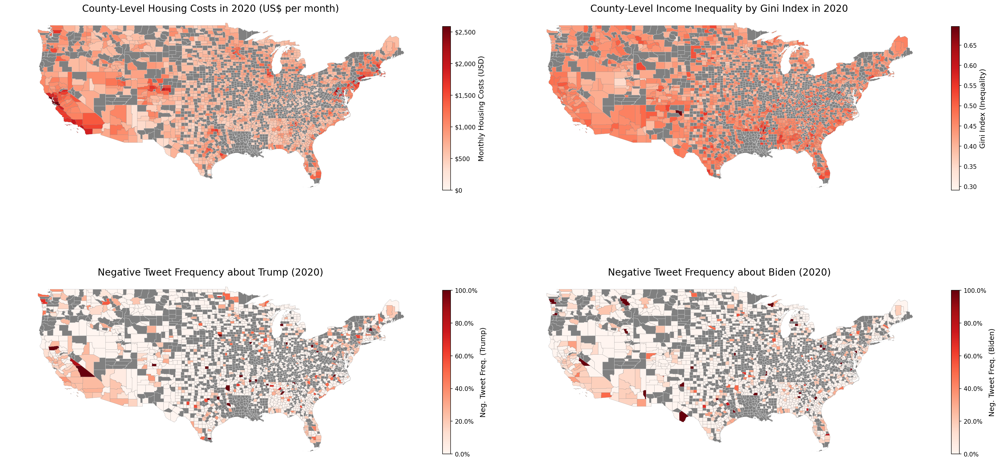

In [60]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from matplotlib.ticker import MaxNLocator
from us import states
import warnings
warnings.filterwarnings('ignore')

# -----------------------------
# Load US county shapefile
# -----------------------------
us_county_map = gpd.read_file(
    r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Code\cb_2020_us_county_5m.shp"
)
us_county_map = us_county_map[~us_county_map['STATEFP'].isin(['02', '15', '72'])]

# -----------------------------
# Standardize names
# -----------------------------
merged_final['County Lower'] = merged_final['County'].str.strip().str.lower()
merged_final['State Lower'] = merged_final['State'].str.strip().str.lower()
us_county_map['County Lower'] = us_county_map['NAME'].str.strip().str.lower()
us_county_map['State Lower'] = us_county_map['STUSPS'].str.strip().str.lower()

# Map state names to abbreviations
state_abbrev_map = {state.name.lower(): state.abbr.lower() for state in states.STATES}
merged_final['State Lower'] = merged_final['State'].str.lower().map(state_abbrev_map)

# -----------------------------
# Merge data
# -----------------------------
county_tweet_map_data = us_county_map.merge(
    merged_final, on=['County Lower', 'State Lower'], how='left'
)

# -----------------------------
# Plot and save Trump map separately
# -----------------------------
def save_single_map(gdf, column, title, cmap, filename, unit='%'):
    fig, ax = plt.subplots(1, 1, figsize=(12, 8))

    vmin, vmax = gdf[column].min(), gdf[column].max()

    gdf.plot(
        column=column,
        ax=ax,
        cmap=cmap,
        vmin=vmin,
        vmax=vmax,
        edgecolor='grey',
        linewidth=0.2,
        missing_kwds={"color": "grey", "edgecolor": "white"}
    )

    ax.set_title(title, fontsize=16, pad=12)
    ax.set_xlim(-130, -65)
    ax.set_ylim(23, 50)
    ax.axis('off')

    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
    cbar = fig.colorbar(sm, ax=ax, shrink=0.6)
    cbar.set_label(title)
    
    if unit == '%':
        cbar.ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"{x:.1%}"))

    plt.tight_layout()
    plt.savefig(filename, dpi=300)
    plt.close(fig)

# Save Trump and Biden maps individually
save_single_map(
    gdf=county_tweet_map_data,
    column='Negative Tweet Frequency Trump',
    title='Negative Tweet Frequency about Trump (2020)',
    cmap='Reds',
    filename='negative_tweet_trump.png',
    unit='%'
)

save_single_map(
    gdf=county_tweet_map_data,
    column='Negative Tweet Frequency Biden',
    title='Negative Tweet Frequency about Biden (2020)',
    cmap='Reds',
    filename='negative_tweet_biden.png',
    unit='%'
)

# -----------------------------
# Create and show 2x2 map subplot (optional)
# -----------------------------
map_info = [
    ('County 2020 Housing Costs', 'County-Level Housing Costs in 2020 (US$ per month)', 'Reds'),
    ('County 2020 Gini Index', 'County-Level Income Inequality by Gini Index in 2020', 'Reds'),
    ('Negative Tweet Frequency Trump', 'Negative Tweet Frequency about Trump (2020)', 'Reds'),
    ('Negative Tweet Frequency Biden', 'Negative Tweet Frequency about Biden (2020)', 'Reds')
]

unit_mapping = {
    'Negative Tweet Frequency Trump': '%',
    'Negative Tweet Frequency Biden': '%',
    'County 2020 Gini Index': '',
    'County 2020 Housing Costs': 'US$'
}

legend_label_mapping = {
    'County 2020 Housing Costs': 'Monthly Housing Costs (USD)',
    'County 2020 Gini Index': 'Gini Index (Inequality)',
    'Negative Tweet Frequency Trump': 'Neg. Tweet Freq. (Trump)',
    'Negative Tweet Frequency Biden': 'Neg. Tweet Freq. (Biden)'
}

fig, axes = plt.subplots(2, 2, figsize=(24, 14))
axes = axes.flatten()

for ax, (column, title, cmap) in zip(axes, map_info):
    data = county_tweet_map_data
    vmin, vmax = data[column].min(), data[column].max()

    data.plot(
        column=column,
        ax=ax,
        legend=False,
        cmap=cmap,
        vmin=vmin,
        vmax=vmax,
        edgecolor='grey',
        linewidth=0.2,
        missing_kwds={"color": "grey", "edgecolor": "white"}
    )

    ax.set_title(title, fontsize=16, pad=12)
    ax.set_xlim(-130, -65)
    ax.set_ylim(23, 50)
    ax.axis('off')

    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
    cbar = fig.colorbar(sm, ax=ax, shrink=0.5)
    cbar.set_label(legend_label_mapping.get(column, column), fontsize=12)

    unit = unit_mapping.get(column, '')
    if unit == '%':
        cbar.ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"{x:.1%}"))
    elif unit == 'US$':
        cbar.ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"${x:,.0f}"))
    else:
        cbar.ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"{x:.2f}"))

plt.tight_layout()
plt.show()


## 2.3 Maps Interpretation

I created geomaps to visualize the relationship between negative tweet frequency and key county and state-level economic indicators identified in our scatterplot analysis. I omitted Alaska and Hawaii due to missing data points. To maintain a concise analysis, I focused on the most prominent state-level indicator: the unemployment rate. Additionally, we identified housing costs and income inequality (measured by the Gini index) as the most important county-level indicators from previous scatterplots. Mapping key state and county-level data helps assess whether people place more weight on key state-level economic indicators compared to key county-level factors when tweeting.

To gain a more comprehensive understanding of key state-level economic conditions, I developed an aggregate economic index that equally weights previously identified key state-level variables: unemployment rate, unemployment growth rate, housing index, state-level personal consumption expenditure, per capita personal income, and state-level current-dollar GDP. This index enables us to pinpoint regions that are either prosperous or economically disadvantaged. By comparing this index map with negative tweet frequency data, I can further explore how various economic factors at the state level align with political sentiment.

The state-level unemployment rate map shows large differences across states. The state-level economic index map also revealed considerable variation in economic indicators across states. Interestingly, the states with the worst economies, such as Nevada, heavily relied on tourism, which were hit hard by COVID-19 shutdowns. One notable observation is that negative tweet frequencies targeting Trump and Biden do not show a strong correlation with the aggregate prosperity index or the unemployment rate. This notion contradicts economic voting theory as we would expect states with worst economic indices or unemployment rates to have higher/lower negative tweet frequencies for Trump/Biden. This complexity underscores that negative sentiment is driven by extraneous stressors not related to politics, such as political propaganda.

Our dataset contains some outliers. For example, Texas—an economically prosperous state—showed elevated negative tweet frequencies for Trump, while Florida, a more economically disadvantaged state, displayed less negative sentiment for Trump than expected. This contradicts traditional economic voting theory.

At the county level, the analysis revealed a weaker correlation between negative tweet frequency and important county-level economic indicators. This suggests that people tend to weigh state-level economic conditions more heavily than county-level economic indicators when forming their opinions. Additionally, many counties were either black or white on the map, indicating missing values or low total tweet counts. This highlights potential selection bias in our dataset, substantiating the need for more robust statistical methods, such as a Heckman selection model, to address these issues and improve the accuracy of our findings.

## 2.3 Regressions

In [61]:
########### TIME FOR REGRESSION ANALYSIS ###########################
## We need to map each state's colour too
merged_final.to_csv('merged_final_with_tweet_data.csv', index=False)

In [62]:
# Renaming columns to match updated names
merged_final.rename(columns={
    'County 2020 Housing Costs': 'County 2020 Housing Costs ($ per month)',
    'County 2020 Income': 'County 2020 Income per Capita ($ per year)',
    'County 2020 Gini Index': 'County 2020 Income Inequality by Gini Index',
    'County 2020 Poverty Rate': 'County 2020 Poverty Rate (%)',
    'County 2020 Unemployment Rate': 'County 2020 Unemployment Rate (%)',
    'State Unemployment Growth Rate': 'State Unemployment Growth Rate (%)',
    'State Tax Rate Growth Rate': 'State Tax Rate Growth Rate (%)',
    'State Avg. Local Tax Rate Growth Rate': 'State Avg. Local Tax Rate Growth Rate (%)',
    'State Combined Rate Growth Rate': 'State Combined Rate Growth Rate (%)',
    'State Max Local Tax Rate Growth Rate': 'State Max Local Tax Rate Growth Rate (%)',
    'State Housing Index Growth Rate': 'State Housing Index Growth Rate (%)',
    'State GDP Growth Rate': 'State GDP Growth Rate (%)',
    'State 2020 Poverty Rate': 'State 2020 Poverty Rate (%)',
    'State 2020 Income Inequality': 'State 2020 Income Inequality by Gini Index',
    'State Unemployment Rate': 'State Unemployment Rate (%)',
    'State Personal Consumption Expenditure': 'State Personal Consumption Expenditure (Billion $)',
    'State Per Capita Personal Income': 'State Per Capita Personal Income ($ per year)',
    'State Tax Rate': 'State Tax Rate (%)',
    'State Avg. Local Tax Rate': 'State Avg. Local Tax Rate (%)',
    'State Combined Rate': 'State Combined Rate (%)',
    'State Max Local Tax Rate': 'State Max Local Tax Rate (%)',
    'State Personal Consumption Expenditure Growth': 'State Personal Consumption Expenditure Growth (%)',
    'State Personal Income Growth': 'State Personal Income Growth (%)',
    'State Poverty Rate Growth': 'State Poverty Rate Growth (%)'
}, inplace=True)

# Growth rate variables
X_county_growth = merged_final[[
    'County Housing Cost Growth (%)', 'County GDP Growth (%)', 'County Income Growth (%)',
    'County Income Equality Growth (%)', 'County Poverty Rate Growth (%)',
    'County Unemployment Rate Growth (%)']].astype(float)

X_state_growth = merged_final[[
    'State Unemployment Growth Rate (%)', 'State Personal Consumption Expenditure Growth (%)',
    'State Personal Income Growth (%)', 'State Tax Rate Growth Rate (%)',
    'State Avg. Local Tax Rate Growth Rate (%)', 'State Combined Rate Growth Rate (%)',
    'State Max Local Tax Rate Growth Rate (%)', 'State Housing Index Growth Rate (%)',
    'State GDP Growth Rate (%)', 'State Poverty Rate Growth (%)',
    'State Income Inequality Growth (%)']].astype(float)

# Current value variables
X_county_current = merged_final[[
    'County 2020 Housing Costs ($ per month)', 'County 2020 Income per Capita ($ per year)',
    'County 2020 Income Inequality by Gini Index', 'County 2020 Poverty Rate (%)',
    'County 2020 Unemployment Rate (%)', 'County 2020 GDP (Current Dollars)',
    'County 2020 GDP per capita']].astype(float)

X_state_current = merged_final[[
    'State 2020 Poverty Rate (%)', 'State 2020 Income Inequality by Gini Index',
    'State Unemployment Rate (%)', 'State Personal Consumption Expenditure (Billion $)',
    'State Per Capita Personal Income ($ per year)', 'State Tax Rate (%)',
    'State Avg. Local Tax Rate (%)', 'State Combined Rate (%)',
    'State Max Local Tax Rate (%)', 'State Housing Index', 'State Current-dollar GDP']].astype(float)

# Country-level growth variables
X_country_growth = merged_final[[
    'Country Inflation Growth (%)', 'Country Real Wage Growth 2020 to 2019',
    'Country Inflation Growth Rate 2019 to 2020', 'Country GDP Growth Rate 2019 to 2020',
    'Country Federal Deficit Growth Rate (%)', 'Country Unemployment Growth Rate']].astype(float)


In [63]:
# Ensure numeric data types
numeric_cols = merged_final.select_dtypes(include=['float64', 'int64']).columns
merged_final[numeric_cols] = merged_final[numeric_cols].apply(pd.to_numeric, errors='coerce')

# Arcsine Square Root Transformation
merged_final['Negative Tweet Frequency Trump'] /= merged_final['Negative Tweet Frequency Trump'].max()
merged_final['Y_trump'] = np.arcsin(np.sqrt(merged_final['Negative Tweet Frequency Trump']))

# Clean missing data for all predictors
def clean_data(X, Y):
    # Align X and Y indices before cleaning
    common_index = X.index.intersection(Y.index)
    X, Y = X.loc[common_index], Y.loc[common_index]

    # Clean both X and Y for NaN or Infinite values
    X = X.replace([np.inf, -np.inf], np.nan)
    Y = Y.replace([np.inf, -np.inf], np.nan)

    # Drop rows with NaN values
    X.dropna(inplace=True)
    Y = Y.loc[X.index]  # Align Y with cleaned X

    return X, Y


Before running our regressions, I want to make sure that our mutliple linear regression assumptions are met:

$\textbf{Assumption 1: The Conditional Distribution of \( u_i \) Given \( X_{1i}, X_{2i}, \ldots, X_{ki} \) Has a Mean of Zero} \newline \mathbb{E}[u_i \mid X_{1i}, X_{2i}, \ldots, X_{ki}] = 0 \newline$

$\textbf{Assumption 2: Independence of Observations} \newline (X_{1i}, X_{2i}, \ldots, X_{ki}, Y_i) \text{ are i.i.d. for } i = 1, 2, \ldots, n \newline$

$\textbf{Assumption 3: Large Outliers Are Unlikely}
\newline
\mathbb{P}(|Y_i| > M) \rightarrow 0 \quad \text{as} \quad M \rightarrow \infty \newline$

$\textbf{Assumption 4: No Perfect Multicollinearity}
\newline
\text{There are no perfect linear relationships among the independent variables.}
\newline
$
$\textbf{Preference: No Imperfect Multicollinearity}
\newline
\text{Implies that that two or more of the regressors are highly correlated in the sense that there is a linear function of the regressors that is highly correlated with another regressor.}
$

In [64]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.stats.stattools import durbin_watson
from statsmodels.stats.diagnostic import het_breuschpagan
import matplotlib.pyplot as plt

# Ensure numeric data types
numeric_cols = merged_final.select_dtypes(include=['float64', 'int64']).columns
merged_final[numeric_cols] = merged_final[numeric_cols].apply(pd.to_numeric, errors='coerce')

# Arcsine Square Root Transformation
merged_final['Negative Tweet Frequency Trump'] /= merged_final['Negative Tweet Frequency Trump'].max()
merged_final['Y_trump'] = np.arcsin(np.sqrt(merged_final['Negative Tweet Frequency Trump']))

merged_final['Negative Tweet Frequency Biden'] /= merged_final['Negative Tweet Frequency Biden'].max()
merged_final['Y_biden'] = np.arcsin(np.sqrt(merged_final['Negative Tweet Frequency Biden']))

# Outlier Removal Function
def remove_outliers(data):
    for column in data.columns:
        mean, std = data[column].mean(), data[column].std()
        data = data[(data[column] >= mean - 4 * std) & (data[column] <= mean + 4 * std)]
    return data

# Clean missing data for all predictors
def clean_data(X, Y):
    common_index = X.index.intersection(Y.index)
    X, Y = X.loc[common_index], Y.loc[common_index]
    X = X.replace([np.inf, -np.inf], np.nan)
    Y = Y.replace([np.inf, -np.inf], np.nan)
    X.dropna(inplace=True)
    Y = Y.loc[X.index]  # Align Y with cleaned X
    return X, Y

# Assumption Tests
def run_assumption_tests(X, Y, name, politician):
    X = remove_outliers(X)  # Remove outliers before testing
    X, Y = clean_data(X, Y)
    X = sm.add_constant(X)
    model = sm.OLS(Y, X).fit()

    #print(f"\n=== Assumption Tests for {name} ({politician}) ===")

    # Mean of Residuals Test (Assumption #1)
    #print(f"Mean of Residuals: {model.resid.mean():.5f}")

    # Durbin-Watson Test (Independence) (Assumption #2)
    #print(f"Durbin-Watson Statistic: {durbin_watson(model.resid):.3f}")

    # Multicollinearity Test (Perfect Multicollinearity)
    vif_data = pd.DataFrame({
        'Variable': X.columns,
        'VIF': [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    })
    #print("\nVIF Values:\n", vif_data)

# Predictor Combinations
X_combinations = {
    'X_county_growth': remove_outliers(X_county_growth),
    'X_state_growth': remove_outliers(X_state_growth),
    'X_county_growth + X_state_growth': remove_outliers(pd.concat([X_county_growth, X_state_growth], axis=1)),
    'X_county_current': remove_outliers(X_county_current),
    'X_state_current': remove_outliers(X_state_current),
    'X_county_current + X_state_current': remove_outliers(pd.concat([X_county_current, X_state_current], axis=1)),
    'All Predictors': remove_outliers(pd.concat([X_county_growth, X_state_growth, X_county_current, X_state_current], axis=1))
}


# Run Tests
Y_trump = merged_final['Y_trump']
Y_biden = merged_final['Y_biden']

for name, X in X_combinations.items():
    run_assumption_tests(X, Y_trump, name, 'Trump')
    run_assumption_tests(X, Y_biden, name, 'Biden')

From these tests, all sets of X variables satisfy assumption 1 and 2 by mean of residuals test and Durbin-Watson test, respectively. Assumption 3 is satisfied as I omitted variables that are outside of the -4 to 4 standard deviations range. Technically, assumption 4 is satisfied; however, I do not want imperfect multicollinearity across my regressors: if the regressors are imperfectly multicollinear, then the coefficients on at least one individual regressor will be imprecisely estimated. We notice that state tax rate growth rate (%) and state max local tax rate growth rate (%) have almost perfect multi-collinearity. In addition, state average local tax rate growth rate (%) and state combined growth rate (%) have moderate multicollinearity. Therefore, I will omit  state max local tax rate growth rate (%), state tax rate (%), state avg. local tax rate (%), and state combined rate (%).

After omitting these variables,  state personal consumption expenditure is highly correlated with State Current-dollar GDP, so I will omit state current-dollar GDP from my analyses.

In [65]:
# Growth rate variables
X_county_growth = merged_final[[
    'County Housing Cost Growth (%)', 'County GDP Growth (%)', 'County Income Growth (%)',
    'County Income Equality Growth (%)', 'County Poverty Rate Growth (%)',
    'County Unemployment Rate Growth (%)']].astype(float)

X_state_growth = merged_final[[
    'State Unemployment Growth Rate (%)', 'State Personal Consumption Expenditure Growth (%)',
    'State Personal Income Growth (%)', 'State Housing Index Growth Rate (%)',
    'State GDP Growth Rate (%)', 'State Poverty Rate Growth (%)',
    'State Income Inequality Growth (%)']].astype(float)

# Current value variables
X_county_current = merged_final[[
    'County 2020 Housing Costs ($ per month)', 'County 2020 Income per Capita ($ per year)',
    'County 2020 Income Inequality by Gini Index', 'County 2020 Poverty Rate (%)',
    'County 2020 Unemployment Rate (%)', 'County 2020 GDP (Current Dollars)',
    'County 2020 GDP per capita']].astype(float)

X_state_current = merged_final[[
    'State 2020 Poverty Rate (%)', 'State 2020 Income Inequality by Gini Index',
    'State Unemployment Rate (%)', 'State Personal Consumption Expenditure (Billion $)',
    'State Per Capita Personal Income ($ per year)', 'State Tax Rate (%)', 'State Housing Index']].astype(float)

# Country-level growth variables
X_country_growth = merged_final[[
    'Country Inflation Growth (%)', 'Country Real Wage Growth 2020 to 2019',
    'Country Inflation Growth Rate 2019 to 2020', 'Country GDP Growth Rate 2019 to 2020',
    'Country Federal Deficit Growth Rate (%)', 'Country Unemployment Growth Rate']].astype(float)


In [66]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.stats.stattools import durbin_watson
from statsmodels.stats.diagnostic import het_breuschpagan
import matplotlib.pyplot as plt

# Ensure numeric data types
numeric_cols = merged_final.select_dtypes(include=['float64', 'int64']).columns
merged_final[numeric_cols] = merged_final[numeric_cols].apply(pd.to_numeric, errors='coerce')

# Arcsine Square Root Transformation
merged_final['Negative Tweet Frequency Trump'] /= merged_final['Negative Tweet Frequency Trump'].max()
merged_final['Y_trump'] = np.arcsin(np.sqrt(merged_final['Negative Tweet Frequency Trump']))

merged_final['Negative Tweet Frequency Biden'] /= merged_final['Negative Tweet Frequency Biden'].max()
merged_final['Y_biden'] = np.arcsin(np.sqrt(merged_final['Negative Tweet Frequency Biden']))


# Outlier Removal Function
def remove_outliers(data):
    for column in data.columns:
        mean, std = data[column].mean(), data[column].std()
        data = data[(data[column] >= mean - 2.5 * std) & (data[column] <= mean + 2.5 * std)]
    return data

# Clean missing data for all predictors
def clean_data(X, Y):
    common_index = X.index.intersection(Y.index)
    X, Y = X.loc[common_index], Y.loc[common_index]
    X = X.replace([np.inf, -np.inf], np.nan)
    Y = Y.replace([np.inf, -np.inf], np.nan)
    X.dropna(inplace=True)
    Y = Y.loc[X.index]  # Align Y with cleaned X
    return X, Y

# Assumption Tests
def run_assumption_tests(X, Y, name, politician):
    X = remove_outliers(X)  # Remove outliers before testing
    X, Y = clean_data(X, Y)
    X = sm.add_constant(X)
    model = sm.OLS(Y, X).fit()

    #print(f"\n=== Assumption Tests for {name} ({politician}) ===")

    # Mean of Residuals Test
    #print(f"Mean of Residuals: {model.resid.mean():.5f}")

    # Durbin-Watson Test (Independence)
    #print(f"Durbin-Watson Statistic: {durbin_watson(model.resid):.3f}")

    # Multicollinearity Test (Perfect Multicollinearity)
    vif_data = pd.DataFrame({
        'Variable': X.columns,
        'VIF': [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    })
    #print("\nVIF Values:\n", vif_data)

# Predictor Combinations
X_combinations = {
    'X_county_growth': remove_outliers(X_county_growth),
    'X_state_growth': remove_outliers(X_state_growth),
    'X_county_growth + X_state_growth': remove_outliers(pd.concat([X_county_growth, X_state_growth], axis=1)),
    'X_county_current': remove_outliers(X_county_current),
    'X_state_current': remove_outliers(X_state_current),
    'X_county_current + X_state_current': remove_outliers(pd.concat([X_county_current, X_state_current], axis=1)),
    'All Predictors': remove_outliers(pd.concat([X_county_growth, X_state_growth, X_county_current, X_state_current], axis=1))
}

# Run Tests
Y_trump = merged_final['Y_trump']
Y_biden = merged_final['Y_biden'] 
for name, X in X_combinations.items():
    #print("Trump Assumption Test")
    run_assumption_tests(X, Y_trump, name, 'Trump')
    #print("Biden Assumption Test")
    run_assumption_tests(X, Y_biden, name, 'Biden')

After omitting these variables, we still have collinearity issues for the "all predictors" set of Xs. To remediate this issue, I will run a correlation matrix to identify which variables are highly correlated with each other.

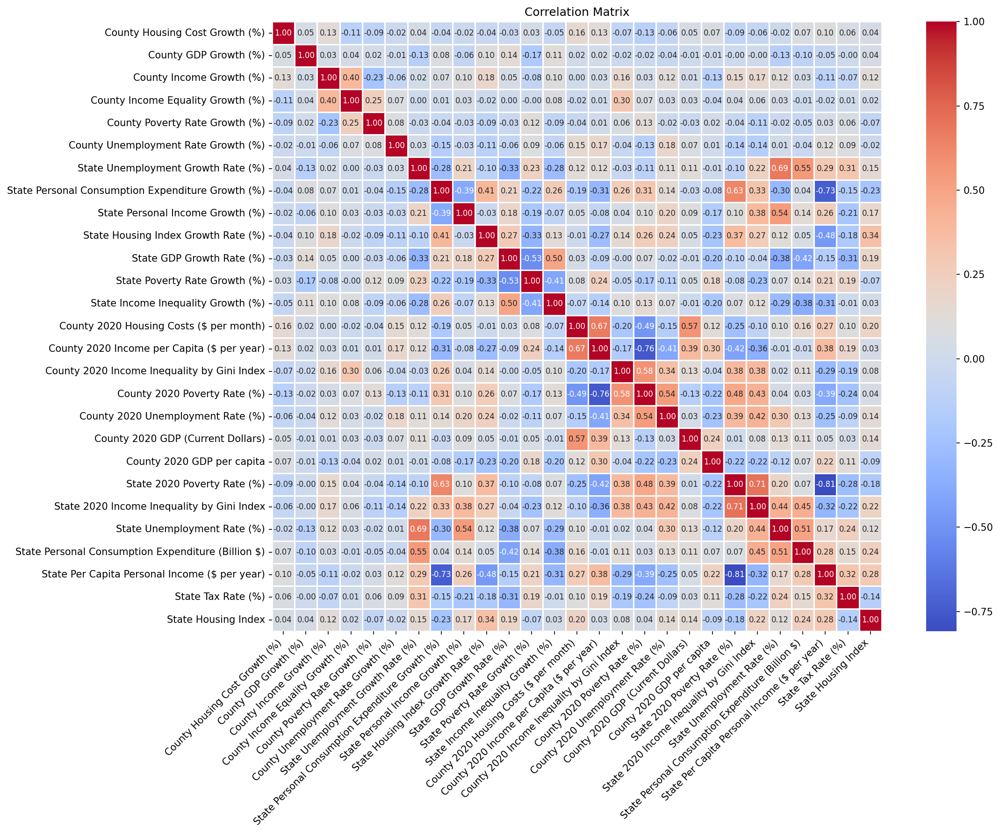

,Variable 1,Variable 2,Correlation
0,County 2020 Income per Capita ($ per year),County 2020 Housing Costs ($ per month),0.674799
1,County 2020 Poverty Rate (%),County 2020 Income per Capita ($ per year),-0.758648
2,State 2020 Income Inequality by Gini Index,State 2020 Poverty Rate (%),0.706962
3,State Unemployment Rate (%),State Unemployment Growth Rate (%),0.685552
4,State Per Capita Personal Income ($ per year),State Personal Consumption Expenditure Growth (%),-0.733265
5,State Per Capita Personal Income ($ per year),State 2020 Poverty Rate (%),-0.808682


In [67]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def identify_highly_correlated_vars(corr_matrix, threshold=0.67):
    correlated_vars = []
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold:
                correlated_vars.append({
                    'Variable 1': corr_matrix.columns[i],
                    'Variable 2': corr_matrix.columns[j],
                    'Correlation': corr_matrix.iloc[i, j]
                })
    return pd.DataFrame(correlated_vars)

# Filter for numeric columns only
numeric_data = merged_final.select_dtypes(include=['float64', 'int64'])

# Improved Correlation Matrix Visualization
plt.figure(figsize=(16, 12))  # Larger size for better spacing
correlation_matrix = remove_outliers(pd.concat([X_county_growth, X_state_growth, X_county_current, X_state_current], axis=1)).corr()

# Heatmap with enhanced formatting
sns.heatmap(correlation_matrix, 
            annot=True, 
            fmt=".2f",  # Limits decimal places for clarity
            cmap='coolwarm', 
            cbar=True, 
            square=True,
            linewidths=0.5,
            annot_kws={"size": 8})  # Smaller text for annotations

plt.title('Correlation Matrix')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# Identify highly correlated variables
df_highly_corr = identify_highly_correlated_vars(correlation_matrix, threshold=0.67)
df_highly_corr

Therefore, for the full model regression, I will omit "County 2020 Income per Capita ($ per year)", "State 2020 Poverty Rate (%)", and "State Personal Consumption Expenditure Growth (%)" so I don't have imperfect multicollinearity across my variables.

In [68]:
# Now let's remove outliers directly from the merged_final dataframe and remove variables that cause multicollinearity issues

def remove_outliers(df, columns, threshold=4):
    for col in columns:
        mean, std = df[col].mean(), df[col].std()
        df = df[(df[col] >= mean - threshold * std) & (df[col] <= mean + threshold * std)]
    return df

X_county_growth = merged_final[[
    'County Housing Cost Growth (%)', 'County GDP Growth (%)', 'County Income Growth (%)',
    'County Income Equality Growth (%)', 'County Poverty Rate Growth (%)',
    'County Unemployment Rate Growth (%)']].astype(float)

X_state_growth = merged_final[[
    'State Unemployment Growth Rate (%)', 'State Personal Consumption Expenditure Growth (%)',
    'State Personal Income Growth (%)', 'State Housing Index Growth Rate (%)',
    'State GDP Growth Rate (%)', 'State Poverty Rate Growth (%)',
    'State Income Inequality Growth (%)']].astype(float)

# Current value variables
X_county_current = merged_final[[
    'County 2020 Housing Costs ($ per month)', 'County 2020 Income per Capita ($ per year)',
    'County 2020 Income Inequality by Gini Index', 'County 2020 Poverty Rate (%)',
    'County 2020 Unemployment Rate (%)', 'County 2020 GDP (Current Dollars)',
    'County 2020 GDP per capita']].astype(float)

X_state_current = merged_final[[
    'State 2020 Poverty Rate (%)', 'State 2020 Income Inequality by Gini Index',
    'State Unemployment Rate (%)', 'State Personal Consumption Expenditure (Billion $)',
    'State Per Capita Personal Income ($ per year)', 'State Tax Rate (%)', 'State Housing Index']].astype(float)

X_full = merged_final[[
    'County Housing Cost Growth (%)', 'County GDP Growth (%)', 'County Income Growth (%)',
    'County Income Equality Growth (%)', 'County Poverty Rate Growth (%)',
    'County Unemployment Rate Growth (%)', 'County 2020 Housing Costs ($ per month)', 'County 2020 Income per Capita ($ per year)',
    'County 2020 Income Inequality by Gini Index', 'County 2020 Poverty Rate (%)',
    'County 2020 Unemployment Rate (%)', 'County 2020 GDP (Current Dollars)',
    'County 2020 GDP per capita', 'State Unemployment Growth Rate (%)', 'State Personal Consumption Expenditure Growth (%)',
    'State Personal Income Growth (%)', 'State Housing Index Growth Rate (%)',
    'State GDP Growth Rate (%)', 'State Poverty Rate Growth (%)',
    'State Income Inequality Growth (%)', 'State 2020 Poverty Rate (%)', 'State 2020 Income Inequality by Gini Index',
    'State Unemployment Rate (%)', 'State Personal Consumption Expenditure (Billion $)',
    'State Per Capita Personal Income ($ per year)', 'State Tax Rate (%)', 'State Housing Index']].astype(float)

merged_final = remove_outliers(merged_final, 
    list(X_county_growth.columns) + 
    list(X_state_growth.columns) + 
    list(X_county_current.columns) + 
    list(X_state_current.columns)
)


In [69]:
# Add a county variable to the merged_final dataset for selection bias
# Estimate!!Percent!!Total households!!TYPE OF INTERNET SUBSCRIPTIONS!!With an Internet subscription:
# File paths for the datasets
file_2020_internet = r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\New Data\2SLS\ACSST5Y2020.S2801-Data.csv"

# Load the datasets
df_2020_internet = pd.read_csv(file_2020_internet, encoding='utf-8')

# Extract relevant columns: "NAME" (county/state) and "S1902_C03_019E" (income data)
df_2020_internet_filtered = df_2020_internet[["NAME", "S2801_C02_012E"]].copy()

# Rename columns for clarity
df_2020_internet_filtered = df_2020_internet_filtered.rename(columns={"S2801_C02_012E": "County 2020 Internet Access Percentage"})

# Extract County and State from the NAME column
df_2020_internet_filtered["County"] = df_2020_internet_filtered["NAME"].str.replace(r" County, .*", "", regex=True)

df_2020_internet_filtered["State"] = df_2020_internet_filtered["NAME"].str.split(", ").str[1]

# Drop original NAME column
df_2020_internet_filtered = df_2020_internet_filtered.drop(columns=["NAME"])

# Convert income values to numeric (ignoring errors)
df_2020_internet_filtered["County 2020 Internet Access Percentage"] = pd.to_numeric(df_2020_internet_filtered["County 2020 Internet Access Percentage"], errors="coerce")

# df_2020_internet_filtered
merged_final = pd.merge(merged_final, df_2020_internet_filtered, on=['State', 'County'], how='left')

X_selection = merged_final[[
    'County Population 2020',      # Example predictor for presence of tweets
    'County 2020 Internet Access Percentage',         # Internet access is critical for tweet presence
]].astype(float)

# Clean X_selection data
X_selection = X_selection.replace([np.inf, -np.inf], np.nan).dropna()

# Align dependent variable ('Tweet_Presence') with cleaned X_selection
merged_final = merged_final.loc[X_selection.index]

merged_final.fillna(0, inplace=True)

X_outcome = pd.concat([X_county_growth, X_state_growth], axis=1)

# Align datasets to ensure matching rows
common_index = merged_final.index.intersection(X_outcome.index)
X_outcome = X_outcome.loc[common_index]
merged_final = merged_final.loc[common_index]





In [70]:
import pandas as pd
import statsmodels.api as sm
from linearmodels.panel import PanelOLS, RandomEffects
from linearmodels.iv import IV2SLS
from stargazer.stargazer import Stargazer
import warnings
warnings.filterwarnings('ignore')

# Step 1: Create a Binary Indicator for Tweet Presence
merged_final['Tweet_Presence'] = np.where(merged_final['Negative Tweet Frequency Trump'].notna(), 1, 0)

# Step 2: Selection Equation Variables (predicting tweet presence)
X_selection = merged_final[[
    'County Population 2020', 
    'County 2020 Internet Access Percentage'
]].astype(float)

# Clean X_selection data
X_selection = X_selection.replace([np.inf, -np.inf], np.nan).dropna()

# Align dependent variable ('Tweet_Presence') with cleaned X_selection
merged_final = merged_final.loc[X_selection.index]

# Step 3: Outcome Equation Variables (predicting tweet intensity)
X_outcome = pd.concat([X_county_growth, X_state_growth], axis=1)

############ X VARIABLES HERE ###########

# Step 4: Add constant terms to both equations
X_selection = sm.add_constant(X_selection)
X_outcome = sm.add_constant(X_outcome)

# Clean growth data
X_county_growth = X_county_growth.replace([np.inf, -np.inf], np.nan).fillna(0)
X_state_growth = X_state_growth.replace([np.inf, -np.inf], np.nan).fillna(0)


############ X VARIABLES HERE ###########
X_outcome = pd.concat([X_county_growth, X_state_growth], axis=1)
X_outcome = X_outcome.replace([np.inf, -np.inf], np.nan).fillna(0)

# Align datasets to ensure matching rows
common_index = merged_final.index.intersection(X_outcome.index)
X_outcome = X_outcome.loc[common_index]
merged_final = merged_final.loc[common_index]

# Step 5: Clean Missing Data
merged_final['Y_trump'] = np.where(merged_final['Negative Tweet Frequency Trump'].notna(),
                                   merged_final['Y_trump'], np.nan)

# Step 6: Fit the Heckman Selection Model using IV2SLS (2-stage least squares)
# First Stage: Selection Equation (Probit model for tweet presence)
probit_model = sm.Probit(merged_final['Tweet_Presence'], X_selection).fit()
merged_final['IMR'] = probit_model.predict()

# Second Stage: Outcome Equation with IMR as a correction term
X_outcome['IMR'] = merged_final['IMR']
heckman_model = sm.OLS(merged_final['Y_trump'], X_outcome).fit()

# Step 8: Stargazer Output for Easy Visualization
stargazer = Stargazer([heckman_model])
with open("heckman_results.html", "w", encoding='utf-8') as f:
    f.write(stargazer.render_html())


         Current function value: 0.000000
         Iterations: 35


In [71]:
import pandas as pd
import statsmodels.api as sm
from linearmodels.panel import PanelOLS, RandomEffects
from linearmodels.iv import IV2SLS
from stargazer.stargazer import Stargazer
import warnings
warnings.filterwarnings('ignore')

# Step 1: Create a Binary Indicator for Tweet Presence
merged_final['Tweet_Presence'] = np.where(merged_final['Negative Tweet Frequency Trump'].notna(), 1, 0)

# Step 2: Selection Equation Variables (predicting tweet presence)
X_selection = merged_final[[
    'County Population 2020', 
    'County 2020 Internet Access Percentage'
]].astype(float)

# Clean X_selection data
X_selection = X_selection.replace([np.inf, -np.inf], np.nan).dropna()

# Align dependent variable ('Tweet_Presence') with cleaned X_selection
merged_final = merged_final.loc[X_selection.index]

# Step 3: Outcome Equation Variables (predicting tweet intensity)
X_outcome = pd.concat([X_county_growth, X_state_growth], axis=1)

############ X VARIABLES HERE ###########

# Step 4: Add constant terms to both equations
X_selection = sm.add_constant(X_selection)
X_outcome = sm.add_constant(X_outcome)

# Clean growth data
X_county_growth = X_county_growth.replace([np.inf, -np.inf], np.nan).fillna(0)
X_state_growth = X_state_growth.replace([np.inf, -np.inf], np.nan).fillna(0)


############ X VARIABLES HERE ###########
X_outcome = pd.concat([X_county_growth, X_state_growth], axis=1)
X_outcome = X_outcome.replace([np.inf, -np.inf], np.nan).fillna(0)

# Align datasets to ensure matching rows
common_index = merged_final.index.intersection(X_outcome.index)
X_outcome = X_outcome.loc[common_index]
merged_final = merged_final.loc[common_index]

# Step 5: Clean Missing Data
merged_final['Y_trump'] = np.where(merged_final['Negative Tweet Frequency Trump'].notna(),
                                   merged_final['Y_trump'], np.nan)

# Step 6: Fit the Heckman Selection Model using IV2SLS (2-stage least squares)
# First Stage: Selection Equation (Probit model for tweet presence)
probit_model = sm.Probit(merged_final['Tweet_Presence'], X_selection).fit()
merged_final['IMR'] = probit_model.predict()

# Second Stage: Outcome Equation with IMR as a correction term
X_outcome['IMR'] = merged_final['IMR']
heckman_model = sm.OLS(merged_final['Y_trump'], X_outcome).fit()

# Step 8: Stargazer Output for Easy Visualization
stargazer = Stargazer([heckman_model])
with open("heckman_results.html", "w", encoding='utf-8') as f:
    f.write(stargazer.render_html())



         Current function value: 0.000000
         Iterations: 35


In [72]:
y_true = merged_final.loc[X_outcome.index, 'Y_biden']
y_pred = heckman_model.predict(X_outcome)

# Compute MSE
mse = np.mean((y_true - y_pred)**2)
print(f"Mean Squared Error (MSE) of the Heckman second-stage model: {mse:.4f}")

Mean Squared Error (MSE) of the Heckman second-stage model: 0.0753


In [73]:
import numpy as np
import statsmodels.api as sm
import pandas as pd
from stargazer.stargazer import Stargazer
from tqdm import tqdm
from IPython.display import HTML

# Ensure numeric data types
numeric_cols = merged_final.select_dtypes(include=['float64', 'int64']).columns
merged_final[numeric_cols] = merged_final[numeric_cols].apply(pd.to_numeric, errors='coerce')

# Arcsine Square Root Transformation
merged_final['Negative Tweet Frequency Trump'] /= merged_final['Negative Tweet Frequency Trump'].max()
merged_final['Y_trump'] = np.arcsin(np.sqrt(merged_final['Negative Tweet Frequency Trump']))

# Clean missing data for all predictors
def clean_data(X, Y):
    common_index = X.index.intersection(Y.index)
    X, Y = X.loc[common_index], Y.loc[common_index]

    X = X.replace([np.inf, -np.inf], np.nan)
    Y = Y.replace([np.inf, -np.inf], np.nan)

    X.dropna(inplace=True)
    Y = Y.loc[X.index]

    return X, Y

def remove_coefs_from_model(model, drop_cols):
    # Drop from params, bse, tvalues, pvalues
    model.params = model.params.drop(labels=drop_cols, errors='ignore')
    model.bse = model.bse.drop(labels=drop_cols, errors='ignore')
    model.tvalues = model.tvalues.drop(labels=drop_cols, errors='ignore')
    model.pvalues = model.pvalues.drop(labels=drop_cols, errors='ignore')

    # Store filtered conf_int as a fixed attribute instead of lambda
    conf_df = model.conf_int().drop(index=drop_cols, errors='ignore')
    model._conf_int_filtered = conf_df

    # Monkey patch Stargazer to use this fixed conf_int if it exists
    original_conf_int = model.conf_int
    def patched_conf_int():
        return getattr(model, '_conf_int_filtered', original_conf_int())
    model.conf_int = patched_conf_int

    return model

# Regression Function with optional fixed effects
def run_regression(X, Y, fixed_effects=None, drop_columns_from_output=None):
    if fixed_effects is not None:
        X = pd.concat([X, fixed_effects], axis=1)
    X, Y = clean_data(X, Y)

    if X.shape[0] <= X.shape[1]:
        print(f"⚠️ Warning: Too many predictors ({X.shape[1]}) for sample size ({X.shape[0]}). Skipping this model.")
        return None

    X = sm.add_constant(X)
    model = sm.OLS(Y, X).fit()

    if np.isnan(model.params).any():
        print("⚠️ Warning: NaN detected in model coefficients — review data for issues.")

    if drop_columns_from_output is not None:
        model = remove_coefs_from_model(model, drop_columns_from_output)

    return model

# Fixed Effects
D_county = pd.get_dummies(merged_final['County'], drop_first=True).astype(float)
D_state = pd.get_dummies(merged_final['State'], drop_first=True).astype(float)
state_dummy_cols = D_state.columns.tolist()

# X Variable Definitions
X_growth = [X_county_growth, X_state_growth]
X_current = [X_county_current, X_state_current]

# Regression Models
models = []

# Growth Rates
model1 = run_regression(pd.concat([X_county_growth, X_state_growth], axis=1), merged_final['Y_trump'], D_state, drop_columns_from_output=state_dummy_cols)

# Current Values
model2 = run_regression(pd.concat([X_county_current, X_state_current], axis=1), merged_final['Y_trump'], D_state, drop_columns_from_output=state_dummy_cols)

# Combined Growth and Current
model3 = run_regression(pd.concat([X_full], axis=1), merged_final['Y_trump'], D_state, drop_columns_from_output=state_dummy_cols)


# Covariate ordering
desired_order3 = list(X_county_growth.columns) + list(X_county_current.columns) + list(X_state_growth.columns) + list(X_state_current.columns) + list(['IMR'])


stargazer = Stargazer([model1, model2, model3, heckman_model])
stargazer.covariate_order(desired_order3)
with open("heckman_results_trump.html", "w", encoding='utf-8') as f:
    f.write(stargazer.render_html())



$$\begin{align*}
\text{Model 1: } & Y_{\text{Trump/Biden},i} = \beta_0 + \sum_{i=1}^6 \beta_i X_{\text{County Growth}, i} + \sum_{j=1}^{7} \beta_j X_{\text{State Growth}, j} + \sum_{k=1}^m \gamma_k D_{\text{State}, k} + \epsilon \\
\\
\text{Model 2: } & Y_{\text{Trump/Biden},i} = \beta_0 + \sum_{i=1}^7 \beta_i X_{\text{County Current}, i} + \sum_{j=1}^{7} \beta_j X_{\text{State Current}, j} + \sum_{k=1}^m \gamma_k D_{\text{State}, k} + \epsilon \\
\\
\text{Model 3: } & Y_{\text{Trump/Biden},i} = \beta_0 + \sum_{i=1}^{24} \beta_i X_{\text{Full Model}, i} + \epsilon \\
\\
\text{Model 4: } & Y_{\text{Trump/Biden},i} = \beta_0 + \sum_{k=1}^{6} \beta_k X_{\text{County Growth}, k} + \sum_{l=1}^{7} \beta_l X_{\text{State Growth}, l} + \lambda \cdot \text{IMR}_i + \epsilon_i
\end{align*}$$

However, our fourth model addresses potential sample selection bias using a two-stage approach: a probit selection equation followed by an outcome equation with the Inverse Mills Ratio (IMR). The probit selection equation, being the probability of observing a tweet, is modeled by a latent variable:
$\begin{equation}
\text{TweetPresence}_i^* = Z_i^\top \gamma + \nu_i
\end{equation}$
with observation rule:
$\text{TweetPresence}_i =
\begin{cases}
1 & \text{if } \text{TweetPresence}_i^* > 0 \\
0 & \text{otherwise}
\end{cases}$
where $Z_i$ is a vector of selection variables ('County Population 2020', 'County 2020 Internet Access Percentage'), $\gamma$ the associated coefficients, and $\nu_i \sim \mathcal{N}(0,1)$. In addition, the IMR is calculated as:
$\begin{equation}
\text{IMR}_i = \frac{\phi(Z_i^\top \gamma)}{\Phi(Z_i^\top \gamma)}
\end{equation}$
where $\phi(\cdot)$ and $\Phi(\cdot)$ are the standard normal PDF and CDF, respectively.

**where**
$\newline$

$$
\text{County Growth} = \{ 
\text{County Housing Cost Growth (\%)},\ 
\text{County GDP Growth (\%)},\ 
\text{County Income Growth (\%)},\ 
\text{County Income Equality Growth (\%)} \\ 
\text{County Poverty Rate Growth (\%)},\ 
\text{County Unemployment Rate Growth (\%)} 
\}
$$

$$
\text{State Growth} = \{ 
\text{State Unemployment Growth Rate},\ 
\text{State Personal Consumption Expenditure Growth (\%)},\ 
\text{State Personal Income Growth (\%)},\ 
\text{State Housing Index Growth Rate} \\ 
\text{State GDP Growth Rate},\ 
\text{State Poverty Rate Growth (\%)},\ 
\text{State Income Inequality Growth (\%)} 
\}
$$

$$
\text{County Current} = \{ 
\text{County 2020 Housing Costs},\ 
\text{County 2020 Income},\ 
\text{County 2020 Gini Index},\ 
\text{County 2020 Poverty Rate} \\ 
\text{County 2020 Unemployment Rate},\ 
\text{County 2020 GDP (Current Dollars)},\ 
\text{County 2020 GDP per capita} 
\}
$$

$$
\text{State Current} = \{ 
\text{State 2020 Poverty Rate},\ 
\text{State 2020 Income Inequality},\ 
\text{State Unemployment Rate},\ 
\text{State Personal Consumption Expenditure} \\ 
\text{State Per Capita Personal Income},\ 
\text{State Tax Rate},\ 
\text{State Housing Index} 
\}
$$

$$
X_{\text{full model}} = \left\{ 
\text{County Growth} \cup \text{County Current} \cup \text{State Growth} \cup \text{State Current} 
\right\} \setminus \left\{ 
\text{County 2020 Income per Capita (\$/year)},\\
\text{State 2020 Poverty Rate (\%)},\ 
\text{State Personal Consumption Expenditure Growth (\%)} 
\right\}
$$


In [74]:
display(HTML(stargazer.render_html()))

In [75]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
from linearmodels.panel import PanelOLS, RandomEffects
from linearmodels.iv import IV2SLS
from stargazer.stargazer import Stargazer
import warnings
warnings.filterwarnings('ignore')

# Step 1: Create a Binary Indicator for Tweet Presence
merged_final['Tweet_Presence'] = np.where(merged_final['Negative Tweet Frequency Biden'].notna(), 1, 0)

# Step 2: Selection Equation Variables (predicting tweet presence)
X_selection = merged_final[[
    'County Population 2020', 
    'County 2020 Internet Access Percentage'
]].astype(float)

# Clean X_selection data
X_selection = X_selection.replace([np.inf, -np.inf], np.nan).dropna()

# Align dependent variable ('Tweet_Presence') with cleaned X_selection
merged_final = merged_final.loc[X_selection.index]

# Step 3: Outcome Equation Variables (predicting tweet intensity)
X_outcome = pd.concat([X_county_growth, X_state_growth], axis=1)

############ X VARIABLES HERE ###########

# Step 4: Add constant terms to both equations
X_selection = sm.add_constant(X_selection)
X_outcome = sm.add_constant(X_outcome)

# Clean growth data
X_county_growth = X_county_growth.replace([np.inf, -np.inf], np.nan).fillna(0)
X_state_growth = X_state_growth.replace([np.inf, -np.inf], np.nan).fillna(0)


############ X VARIABLES HERE ###########
X_outcome = pd.concat([X_county_growth, X_state_growth], axis=1)
X_outcome = X_outcome.replace([np.inf, -np.inf], np.nan).fillna(0)

# Align datasets to ensure matching rows
common_index = merged_final.index.intersection(X_outcome.index)
X_outcome = X_outcome.loc[common_index]
merged_final = merged_final.loc[common_index]

# Step 5: Clean Missing Data
merged_final['Y_biden'] = np.where(merged_final['Negative Tweet Frequency Biden'].notna(),
                                   merged_final['Y_biden'], np.nan)

# Step 6: Fit the Heckman Selection Model using IV2SLS (2-stage least squares)
# First Stage: Selection Equation (Probit model for tweet presence)
probit_model = sm.Probit(merged_final['Tweet_Presence'], X_selection).fit()
merged_final['IMR'] = probit_model.predict()

# Second Stage: Outcome Equation with IMR as a correction term
X_outcome['IMR'] = merged_final['IMR']
heckman_model = sm.OLS(merged_final['Y_biden'], X_outcome).fit()

# Step 8: Stargazer Output for Easy Visualization
stargazer = Stargazer([heckman_model])
with open("heckman_results.html", "w", encoding='utf-8') as f:
    f.write(stargazer.render_html())



         Current function value: 0.000000
         Iterations: 35


In [76]:
y_true = merged_final.loc[X_outcome.index, 'Y_biden']
y_pred = heckman_model.predict(X_outcome)

# Compute MSE
mse = np.mean((y_true - y_pred)**2)
print(f"Mean Squared Error (MSE) of the Heckman second-stage model: {mse:.4f}")


Mean Squared Error (MSE) of the Heckman second-stage model: 0.0724


In [77]:
import numpy as np
import statsmodels.api as sm
import pandas as pd
from stargazer.stargazer import Stargazer
from tqdm import tqdm
from IPython.display import HTML

# Ensure numeric data types
numeric_cols = merged_final.select_dtypes(include=['float64', 'int64']).columns
merged_final[numeric_cols] = merged_final[numeric_cols].apply(pd.to_numeric, errors='coerce')

# Arcsine Square Root Transformation
merged_final['Negative Tweet Frequency Biden'] /= merged_final['Negative Tweet Frequency Biden'].max()
merged_final['Y_biden'] = np.arcsin(np.sqrt(merged_final['Negative Tweet Frequency Biden']))

# Clean missing data for all predictors
def clean_data(X, Y):
    common_index = X.index.intersection(Y.index)
    X, Y = X.loc[common_index], Y.loc[common_index]

    X = X.replace([np.inf, -np.inf], np.nan)
    Y = Y.replace([np.inf, -np.inf], np.nan)

    X.dropna(inplace=True)
    Y = Y.loc[X.index]

    return X, Y

def remove_coefs_from_model(model, drop_cols):
    # Drop from params, bse, tvalues, pvalues
    model.params = model.params.drop(labels=drop_cols, errors='ignore')
    model.bse = model.bse.drop(labels=drop_cols, errors='ignore')
    model.tvalues = model.tvalues.drop(labels=drop_cols, errors='ignore')
    model.pvalues = model.pvalues.drop(labels=drop_cols, errors='ignore')

    # Store filtered conf_int as a fixed attribute instead of lambda
    conf_df = model.conf_int().drop(index=drop_cols, errors='ignore')
    model._conf_int_filtered = conf_df

    # Monkey patch Stargazer to use this fixed conf_int if it exists
    original_conf_int = model.conf_int
    def patched_conf_int():
        return getattr(model, '_conf_int_filtered', original_conf_int())
    model.conf_int = patched_conf_int

    return model

# Regression Function with optional fixed effects
def run_regression(X, Y, fixed_effects=None, drop_columns_from_output=None):
    if fixed_effects is not None:
        X = pd.concat([X, fixed_effects], axis=1)
    X, Y = clean_data(X, Y)

    if X.shape[0] <= X.shape[1]:
        print(f"⚠️ Warning: Too many predictors ({X.shape[1]}) for sample size ({X.shape[0]}). Skipping this model.")
        return None

    X = sm.add_constant(X)
    model = sm.OLS(Y, X).fit()

    if np.isnan(model.params).any():
        print("⚠️ Warning: NaN detected in model coefficients — review data for issues.")

    if drop_columns_from_output is not None:
        model = remove_coefs_from_model(model, drop_columns_from_output)

    return model

# Fixed Effects
D_county = pd.get_dummies(merged_final['County'], drop_first=True).astype(float)
D_state = pd.get_dummies(merged_final['State'], drop_first=True).astype(float)
state_dummy_cols = D_state.columns.tolist()

# X Variable Definitions
X_growth = [X_county_growth, X_state_growth]
X_current = [X_county_current, X_state_current]

# Regression Models
models = []

# Growth Rates
model1 = run_regression(pd.concat([X_county_growth, X_state_growth], axis=1), merged_final['Y_biden'], D_state, drop_columns_from_output=state_dummy_cols)

# Current Values
model2 = run_regression(pd.concat([X_county_current, X_state_current], axis=1), merged_final['Y_biden'], D_state, drop_columns_from_output=state_dummy_cols)

# Combined Growth and Current
model3 = run_regression(pd.concat([X_full], axis=1), merged_final['Y_biden'], D_state, drop_columns_from_output=state_dummy_cols)


# Covariate ordering
desired_order3 = list(X_county_growth.columns) + list(X_county_current.columns) + list(X_state_growth.columns) + list(X_state_current.columns) + list(['IMR'])


stargazer = Stargazer([model1, model2, model3, heckman_model])
stargazer.covariate_order(desired_order3)
with open("heckman_results_biden.html", "w", encoding='utf-8') as f:
    f.write(stargazer.render_html())

In [78]:
display(HTML(stargazer.render_html()))

## Regression Interpretation
The aforementioned scatterplots suggest a linear relationship between economic variables and negative tweet frequencies for Trump and Biden. Knowing that political behaviour tend to follow retrospective and sociotropic inputs, we included current and growth economic variables at the state and county levels. In a similar vein, I combined growth and current economic variables to examine how past economic trends and present conditions collectively influence tweeting behavior. Additionally, state fixed effects were included to control for state-level extraneous variables, such as political climate, that could impact the frequency of negative tweets for specific regions. Finally, the arcsine transformation was applied to adjust the skewed distribution of the dependent variable. All models account for state-fixed effects.

### Analysis of Model 1
Our regression suggests that county-level economic growth variables have minimal influence on the frequency of negative tweets toward Trump; however, the county unemployment growth rate was significant (coefficient = 0.001). This notion suggests that localized, small-scale economic shifts have limited relevance for public sentiment on Twitter. For Trump, the state-level growth variables revealed two statistically significant predictors: the state unemployment growth rate (coefficient = 0.001) and personal income growth (coefficient = 0.022). While the unemployment growth effect is modest—a 1\% increase in unemployment growth is associated with only a 0.1\% increase in negative Trump tweets—the effect of income growth is more pronounced: a 1\% increase in state-level personal income growth corresponds to a 2.2\% rise in negative sentiment toward Trump. This pattern suggests that people who tweet about Trump care more about income growth levels than to unemployment fluctuations; however, the latter coefficient is counterintuitive as, according to economic voting theory, one would expect lower negative tweet frequency for an increase in income growth. Notably, in the Biden model, none of the state-level growth variables were statistically significant. This asymmetry in county and state-level statistical significance across Trump and Biden models implies that people may perceive Trump as more directly responsible for economic conditions, leading them to attribute economic outcomes more heavily to him than to Biden. The greater number of economically and statistically significant state-level predictors, compared to county-level predictors, reinforces the notion that broader, state-level economic trends exert a stronger influence on tweet sentiment—particularly anti-Trump sentiment—than more localized, county-level changes.


### Analysis of Model 2
In our Trump regression, 2020 county GDP (coefficient = -0.000) was statistically significant yet economically insignificant. This oddity is attributable to scaling issues—for example, GDP is measured in millions of dollars, so a one-unit change represents a substantial economic shift, yet the model interprets it as a minor numerical change, resulting in a near-zero coefficient. Interestingly, this finding do aligns well with traditional economic voting theory. Higher GDP—typically a sign of stronger economic conditions—is associated here with lower negative sentiment toward the incumbent. Interestingly, income inequality (Gini index) (coefficient = -0.549) was economically significant but not statistically significant due to high standard errors (see = 0.295). Interestingly, none of our Trump current state-level regressors were significant, signifying that perhaps smaller economic shifts are felt more swiftly than larger ones. Regarding Biden, none of the regressions had statistically significant regressors, meaning that voters strongly associated economic performance with Trump's government; therefore, they tend to, on average, blame him for suboptimal performance. However, they do not praise Biden when Trump's administration does not perform well, a contradiction to economic voting theory.

### Analysis of Model 3
When performing our full regressions for Trump, county unemployment growth rate was statistically significant (coefficient = 0.001), signaling that tweeters care a lot about unemployment growth rate when tweeting on a smaller scale. Albeit economically insignificant, this result coincides with economic voting theory. For Biden, state per capita personal income (coefficient = -0.000) and state-level housing index (coefficient = 0.001) were statistically significant; however, according to economic voting theory, increasing housing costs should decrease negative tweet frequency for Biden.

### Analysis of Model 4
We used a Heckman selection model to address potential bias in county-level negative tweet frequencies, recognizing that some counties—particularly those with smaller populations or limited internet access—may be underrepresented on Twitter. To account for this effect, we modeled the selection process using county-level population and internet access, while the outcome equation included county and state-level economic growth variables. We chose this set of variables as it yielded the highest adjusted R² across all combinations of regressors. In the Trump model, the Inverse Mills Ratio (coefficient = 0.139) was statistically significant, confirming selection bias, while county and state-level unemployment rates (coefficient = 0.001) also reached significance, supporting economic voting theory. Additionally, state fixed effects for places like Georgia, New Hampshire, and Tennessee suggest that local political or cultural factors may influence negative sentiment beyond economics. In contrast, none of the coefficients in the Biden model—including the IMR—were statistically significant, implying that economic or structural economic factors play a smaller role in shaping public sentiment toward Biden, possibly due to differences in perceived economic accountability between the two presidential competitors. 

My preferred specification is Model 4, as it accounts for selection bias, has the highest adjusted R² value, and aligns best with theoretical expectations — indicating that tweet patterns are shaped by retrospective and sociotropic evaluations. Moreover, it suggests that poorer economic conditions lead to more negative tweets about Trump and less negative tweets about Biden, in line with economic voting theory. Of importance, county-level unemployment growth rate has been a statistically significant regressor for Trump across all regressions.



# 3. Final Project

## 3.1 Potential Data to Scrape

To begin, libraries are an amazing probe for economic well-being as they enhance surrounding property values and stimulate commercial development (V. X. Wang, 2024) and are linked to improved educational outcomes (Gilpin et al., 2021). In addition, the number of libraries differ from traditional economic indicators, such as GDP, as it reflects access to public, free infrastructure, especially for learning, instead of monetary transactions. Moreover, libraries behave more like an input — a signal of investment in human capital and community resilience — instead of solely being an output (i.e. GDP). I webscraped the names and locations of libraries by state from https://publiclibraries.com, specifically using URLs formatted as https://publiclibraries.com/state/{state_name_here}. To get historically accurate records, I will scrape the list of libraries for each state in 2020 from https://web.archive.org/web/20250000000000*/https://publiclibraries.com/state/{state_name_here}. Once scraped, I can merge the number of libraries per county or state, use them as an additional regressor for my machine learning models, and explore how library density relates to negative tweet frequency about political figures.


## 3.2 Potential Challenges
A challenge in using this data is obtaining historically accurate 2020 records, which I addressed by retrieving archived versions from https://web.archive.org, ensuring temporal consistency with my main dataset. In addition, please note that this data is very hard to copy and paste directly into an excel sheet due to column mispecifications on Windows and the number of links (52 links); hence, warranting the usage of webscraping.

## 3.3 Scraping Data from a Website
I expect a higher number of libraries to correlate with lower/higher negative tweet frequency targeted at Trump/Biden in accordance with economic voting theory. Preliminary visualizations, such as correlations, suggest that regions with more libraries often exhibit lower unemployment and higher prosperity. This allows me to test whether investment in public goods like libraries correlates with reduced political dissatisfaction, helping refine the broader question of how economic and infrastructural factors shape online political sentiment.

In [79]:
import requests
from bs4 import BeautifulSoup
import pandas as pd
import re
import time
import random
from requests.exceptions import RequestException

# Your crosswalk path
crosswalk_path = r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Data\zip-to-county.csv"
crosswalk = pd.read_csv(crosswalk_path, dtype=str)
crosswalk['ZIP'] = crosswalk['ZIP'].str.zfill(5)

# Session with User-Agent
session = requests.Session()
session.headers.update({
    "User-Agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/120.0.0.0 Safari/537.36"
})

# Safe request with retries
def safe_request(url, retries=3):
    for i in range(retries):
        try:
            response = session.get(url, timeout=15)
            response.raise_for_status()
            return response
        except RequestException as e:
            wait = 5 * (i + 1)
            print(f"  ⚠️ Retry {i+1} for {url} failed: {e}. Waiting {wait}s...")
            time.sleep(wait)
    print(f"  ❌ Giving up on {url}")
    return None

# List of archive URLs (snapshot from Oct 31, 2020)
archived_state_urls = [
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/alabama/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/alaska/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/arizona/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/arkansas/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/california/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/colorado/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/connecticut/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/delaware/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/florida/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/georgia/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/hawaii/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/idaho/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/illinois/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/indiana/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/iowa/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/kansas/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/kentucky/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/louisiana/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/maine/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/maryland/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/massachusetts/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/michigan/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/minnesota/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/mississippi/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/missouri/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/montana/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/nebraska/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/nevada/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/new-hampshire/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/new-jersey/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/new-mexico/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/new-york/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/north-carolina/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/north-dakota/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/ohio/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/oklahoma/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/oregon/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/pennsylvania/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/rhode-island/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/south-carolina/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/south-dakota/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/tennessee/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/texas/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/utah/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/vermont/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/virginia/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/washington/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/west-virginia/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/wisconsin/",
    "https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/wyoming/"
]

all_libraries = []

for state_url in archived_state_urls:
    print(f"Scraping {state_url}")
    response = safe_request(state_url)
    if response is None:
        continue

    soup = BeautifulSoup(response.text, 'html.parser')
    rows = soup.select("#libraries tr")[1:]  # skip header row

    for row in rows:
        cells = row.find_all('td')
        if len(cells) >= 4:
            city = cells[0].text.strip()
            library_name = cells[1].text.strip()
            zip_code = cells[3].text.strip()

            if re.match(r'^\d{5}$', zip_code):  # 5-digit ZIP
                all_libraries.append({
                    'Library': library_name,
                    'City': city,
                    'ZIP': zip_code,
                    'Source_URL': state_url
                })

    time.sleep(random.uniform(8, 12))  # polite delay between requests

# Convert to DataFrame
libraries_df = pd.DataFrame(all_libraries)
libraries_df['ZIP'] = libraries_df['ZIP'].str.zfill(5)

# Merge with ZIP-to-county data
merged = libraries_df.merge(crosswalk, on="ZIP", how="left")

# Count libraries per county
county_counts = merged.groupby(['COUNTYNAME', 'STATE']).size().reset_index(name='Library_Count')

# Save output
libraries_df.to_csv("all_libraries_detailed.csv", index=False)
county_counts.to_csv("library_counts_by_county.csv", index=False)


Scraping https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/alabama/
Scraping https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/alaska/
Scraping https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/arizona/
Scraping https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/arkansas/
Scraping https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/california/
Scraping https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/colorado/
Scraping https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/connecticut/
Scraping https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/delaware/
Scraping https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/florida/
Scraping https://web.archive.org/web/20201031012347/https://publiclibraries.com/state/georgia/
Scraping https://web.archive.org/web/2020

In [80]:
county_counts = pd.read_csv(r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Code\library_counts_by_county.csv")

county_counts = county_counts.rename(columns={"COUNTYNAME": "County"})

# Remove " County" suffix (if it exists)
county_counts["County"] = county_counts["County"].str.replace(r"\s+County$", "", regex=True)
try:
    merged_final = pd.merge(merged_final, county_counts, on=["County"], how="inner")
except:
    print("error")

## 3.4 Visualizing the Scraped Dataset

In [81]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from matplotlib.ticker import MaxNLocator
from us import states
import re

# -----------------------------
# Step 1: Load library data
# -----------------------------
df = pd.read_csv(r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Code\library_counts_by_county.csv")
df = df.rename(columns={"COUNTYNAME": "County"})
df["County"] = df["County"].str.replace(r"\s+County$", "", regex=True)
df["County"] = df["County"].str.strip().str.lower()
df["STATE"] = df["STATE"].map({state.abbr: state.name for state in states.STATES})
df["STATE"] = df["STATE"].str.strip().str.lower()

# -----------------------------
# Step 2: Load and prep US county shapefile
# -----------------------------
us_county_map = gpd.read_file(r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Code\cb_2020_us_county_5m.shp")
us_county_map = us_county_map[~us_county_map['STATEFP'].isin(['02', '15', '72'])]  # Remove AK, HI, PR

us_county_map['County Lower'] = (
    us_county_map['NAME']
    .str.strip()
    .str.lower()
    .str.replace(r'\s+(county|parish|borough|census area)$', '', regex=True)
)
us_county_map['STATE'] = us_county_map['STATE_NAME'].str.strip().str.lower()

# -----------------------------
# Step 3: Merge shapefile with library counts
# -----------------------------
merged_map = us_county_map.merge(
    df,
    left_on=['County Lower', 'STATE'],
    right_on=['County', 'STATE'],
    how='left'
)

# -----------------------------
# Step 4: Plot and save function
# -----------------------------
def plot_and_save_library_count_map(data, column='Library_Count', title='Number of Libraries per County',
                                    cmap='Blues', filename='library_count_map.png'):
    fig, ax = plt.subplots(1, 1, figsize=(12, 8))

    vmin = 0
    vmax = 25

    data.plot(column=column,
              ax=ax,
              legend=False,
              cmap=cmap,
              vmin=vmin,
              vmax=vmax,
              edgecolor='black',
              linewidth=0.2,
              missing_kwds={
                  "color": "grey",
                  "edgecolor": "grey",
                  "hatch": None,
                  "label": "Missing data"
              })

    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
    cbar = fig.colorbar(sm, ax=ax)
    cbar.set_label("Number of Libraries")
    cbar.ax.yaxis.set_major_locator(MaxNLocator(nbins=4))
    cbar.ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"{int(x)}"))

    ax.set_xlim(-130, -65)
    ax.set_ylim(23, 50)
    ax.set_title(title, fontsize=14, pad=15)
    ax.axis('off')

    plt.savefig(filename, dpi=300)
    plt.close()

# -----------------------------
# Step 5: Run and save map
# -----------------------------
plot_and_save_library_count_map(merged_map)


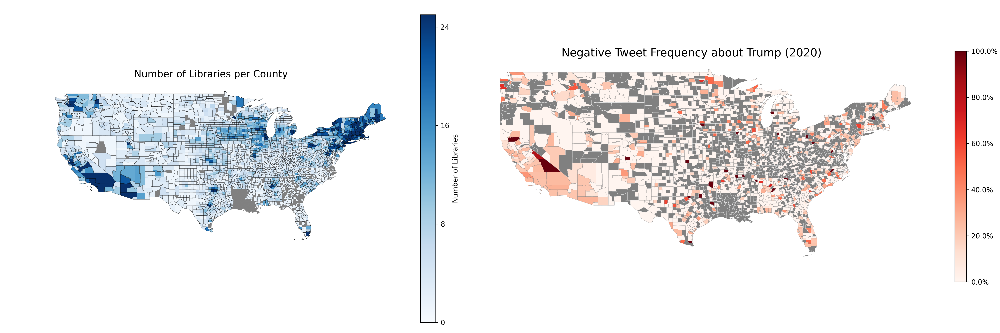

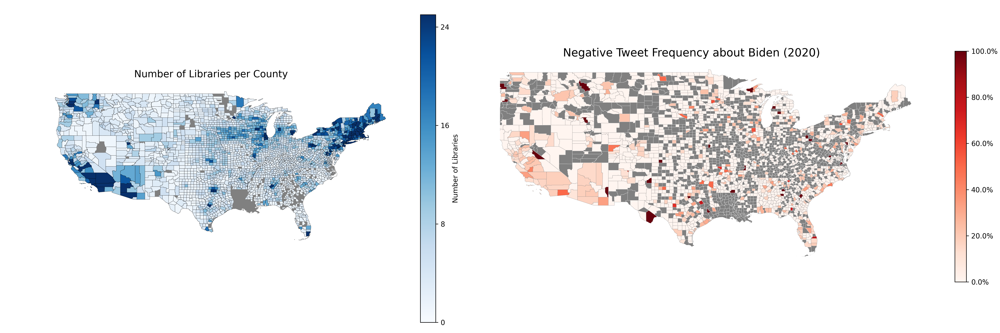

In [82]:

from PIL import Image
from IPython.display import display

# Load images
lib_img = Image.open("library_count_map.png")
trump_img = Image.open("negative_tweet_trump.png")
biden_img = Image.open("negative_tweet_biden.png")

# -----------------------------
# Function to crop (zoom into center)
# -----------------------------
def crop_center(img, zoom_factor=1.2):
    """Crop image to zoom into center region."""
    width, height = img.size
    new_width = int(width / zoom_factor)
    new_height = int(height / zoom_factor)
    left = (width - new_width) // 2
    top = (height - new_height) // 2
    right = left + new_width
    bottom = top + new_height
    return img.crop((left, top, right, bottom))

# Zoom/crop each image
lib_crop = crop_center(lib_img, zoom_factor=1.2)
trump_crop = crop_center(trump_img, zoom_factor=1.2)
biden_crop = crop_center(biden_img, zoom_factor=1.2)

# -----------------------------
# Combine side-by-side
# -----------------------------
def combine_images_side_by_side(img1, img2):
    width = img1.width + img2.width
    height = max(img1.height, img2.height)
    combined = Image.new("RGB", (width, height), color=(255, 255, 255))
    combined.paste(img1, (0, 0))
    combined.paste(img2, (img1.width, 0))
    return combined

# Create and display combined zoomed maps
combined_trump_zoom = combine_images_side_by_side(lib_crop, trump_crop)
combined_biden_zoom = combine_images_side_by_side(lib_crop, biden_crop)

display(combined_trump_zoom)
display(combined_biden_zoom)


The spatial distribution of public libraries across U.S. counties is notably uneven. Library density is concentrated in urbanized and economically well-resourced areas, particularly along the coasts and in the Northeast, whereas rural regions—especially in the South and parts of the Midwest—show markedly sparser library coverage. This likely reflects broader disparities in funding, infrastructure, population density, and educational investment. Interestingly, the relationship between library count and negative tweet frequency toward Trump appears to follow a parabolic pattern: counties with either very few or a high number of libraries tend to express less negativity, while those with a moderate number of libraries exhibit heightened criticism. This U-shaped relationship may stem from the fact that library availability often correlates with education levels, and higher education is linked to increased political awareness and engagement. Counties with few libraries might lack the digital access or educational exposure that facilitates online political expression, while counties with abundant libraries—often more urban and ideologically diverse—may exhibit more moderated or polarized sentiment. Overall, this relationship runs counter to economic voting theory. In contrast, the association between library presence and negative tweets about Biden is less pronounced. Although some high-library counties do show increased negativity, the overall pattern is less coherent, potentially reflecting differences in the demographic composition or ideological breadth of Biden critics, as well as the generally lower volume or intensity of anti-Biden sentiment on Twitter during the same period.


In [83]:
import pandas as pd

# Load your data
df = pd.read_csv(r"C:\Users\miste\OneDrive - University of Toronto\Life Sciences\ECO225\Code\library_counts_by_county.csv")

# Define mapping from state abbreviations to full names
import us
state_abbrev_to_name = {state.abbr: state.name for state in us.states.STATES}

# Remove 'County', 'Parish', 'Census Area' suffixes
df['County'] = df['COUNTYNAME'].str.replace(r' County| Parish| Census Area', '', regex=True)

# Replace STATE abbreviations with full names
df['State'] = df['STATE'].map(state_abbrev_to_name)

# Rename Library_Count column
df.rename(columns={'Library_Count': 'County-level Library Count'}, inplace=True)

# Calculate state-level total library count and assign to new column
state_totals = df.groupby('State')['County-level Library Count'].sum().to_dict()
df['State-level Library Count'] = df['State'].map(state_totals)

# Keep only the relevant columns
df = df[['County', 'State', 'County-level Library Count', 'State-level Library Count']]

merged_final = pd.merge(merged_final, df, on=["County", "State"], how="inner")


In [84]:
# For summary statistics section of my paper
merged_final['County-level Library Count'].describe()

count    2472.000000
mean        6.500809
std         7.679328
min         1.000000
25%         2.000000
50%         4.000000
75%         8.000000
max        91.000000
Name: County-level Library Count, dtype: float64

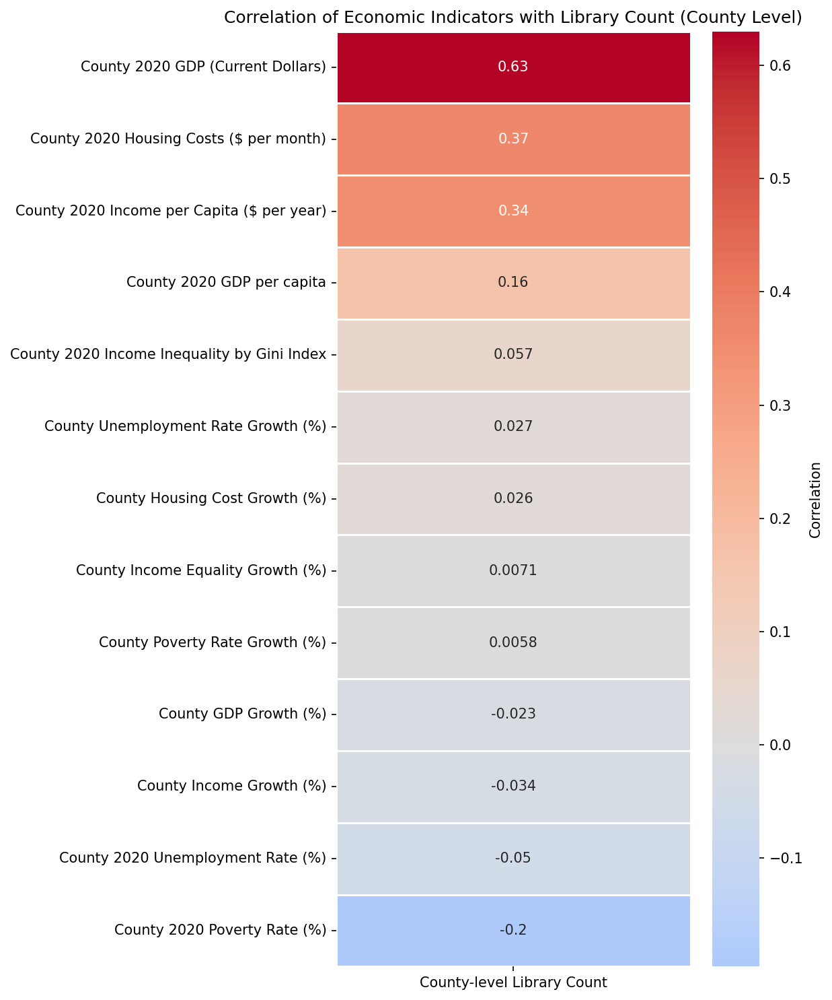

In [85]:
# Compute correlation matrix
econ_cols = [
    'County Housing Cost Growth (%)', 'County GDP Growth (%)', 'County Income Growth (%)',
    'County Income Equality Growth (%)', 'County Poverty Rate Growth (%)',
    'County Unemployment Rate Growth (%)', 'County 2020 Housing Costs ($ per month)',
    'County 2020 Income per Capita ($ per year)', 'County 2020 Income Inequality by Gini Index',
    'County 2020 Poverty Rate (%)', 'County 2020 Unemployment Rate (%)',
    'County 2020 GDP (Current Dollars)', 'County 2020 GDP per capita'
]

corr_data = merged_final[['County-level Library Count'] + econ_cols].corr()

# Extract correlations of economic indicators with library count
corr_with_libraries = corr_data['County-level Library Count'].drop('County-level Library Count')

# Sort indicators by strength of correlation
sorted_corr = corr_with_libraries.sort_values(ascending=False)

# Plot the heatmap
plt.figure(figsize=(8, 10))
sns.heatmap(
    sorted_corr.to_frame(),  # convert Series to DataFrame for heatmap
    annot=True,
    cmap='coolwarm',
    center=0,
    linewidths=0.5,
    cbar_kws={'label': 'Correlation'}
)
plt.title("Correlation of Economic Indicators with Library Count (County Level)")
plt.tight_layout()
plt.show()


Wealthier and more developed counties tend to have more libraries. The strongest links are with total GDP, housing costs, and income per capita. The counties with higher poverty and unemployment tend to have fewer libraries. In addition, growth metrics (e.g., income growth, GDP growth) don’t correlate much with current library numbers—suggesting static wealth levels matter more than recent economic changes. Finally, geographic disparities (as seen in the map) align with these findings—more affluent, urban counties invest more in libraries. However, just because libraries are positively correlated with economic prosperity factors does not imply that an increase in libraries results in lower criticism for the presidential incumbent as seen in our previous plots. Therefore, the link between number of libraries and online criticism does not seem to follow economic voting theory sadly. 


## 3.5 Regression Tree
$\textbf{Regression trees}$ are decision tree models used for predicting continuous outcomes. They work by recursively partitioning the predictor space into a set of disjoint regions that minimize prediction error for negative tweet frequency towards Trump and Biden, being y. The process begins with a region  $\textit{R}$ containing all observations in the predictor space $\mathbf{X}$= {X_full} or $\mathbf{X}$= {County Growth $\cup$ State Growth}. At each node, the algorithm selects a feature $j$ and a split point $s$ to divide the current region into two subregions:

$
R_1(j,s) = \{ x \mid x_j \leq s \}, \quad R_2(j,s) = \{ x \mid x_j > s \}
$

The optimal split is determined by minimizing the total sum of squared errors (SSE), or equivalently, the mean squared error (MSE) across the resulting child nodes:

$/*
\min_{j,s} \left[  \sum_{i: x_{i,j} \leq s, x_i \in R_1}
    (y_i - \hat{y}_{R_1})^2 +  \sum_{i: x_{i,j} > s, x_i \in R_2}
    (y_i - \hat{y}_{R_2})^2 \right]
$

This splitting process continues recursively, growing the tree until a stopping condition is met—such as reaching a maximum depth or a minimum number of observations per leaf. To prevent overfitting, regression trees may be pruned using cost-complexity pruning, which adds a penalty proportional to the number of terminal nodes:

$
\min_{\text{tree} \subset T} \sum_{i=1}^n (\hat{f}(x_i) - y_i)^2 + \alpha \cdot |\text{terminal nodes in tree}|
$

In simpler terms, in a regression tree, the algorithm aims to split the data into smaller and more homogeneous groups using my economic factors, such as county GDP, unemployment, housing costs, income inequality, or library In short, imagine a multi-dimensional space defined by the economic variables — such as unemployment, housing costs, and income inequality. The regression tree algorithm divides this space into distinct regions, where each region contains counties with similar economic characteristics. Within each region, the model assigns a predicted value for negative tweet frequency — typically the average frequency for that region. The goal is to create these regions in a way that minimizes the difference between the predicted and actual negative tweet frequencies. Each time the algorithm considers a split (e.g., “Is GDP less than $100,000?”), it chooses the variable and cutoff point that result in the biggest reduction in prediction error, measured using Mean Squared Error (MSE). This splitting continues recursively, creating a decision tree where each terminal node contains a subset of observations that are similar in terms of both predictors and outcomes. The ultimate goal is to build a tree that captures the most meaningful patterns in the data—like how economic distress or population size influences political sentiment—while avoiding unnecessary complexity that could lead to overfitting.

In addition, regularization parameters help control model complexity and prevent overfitting. For regression trees, key parameters include max_depth (which limits how deep the tree can grow), min_samples_split and min_samples_leaf (which require a minimum number of observations to form splits or terminal nodes), and ccp_alpha, which prunes branches that do not meaningfully reduce error. Adjusting these values balances the trade-off between capturing true underlying patterns in our data and avoiding noise. Overall, tuning these parameters is crucial: insufficient regularization leads to overfitting (capturing unnecessary noise, increasing MSE), while overly aggressive regularization may result in underfitting and loss of valuable signal in your predictors.


--- Decision Tree Performance ---
Trump Tree Model:
MSE: 0.0676

Biden Tree Model:
MSE: 0.0875


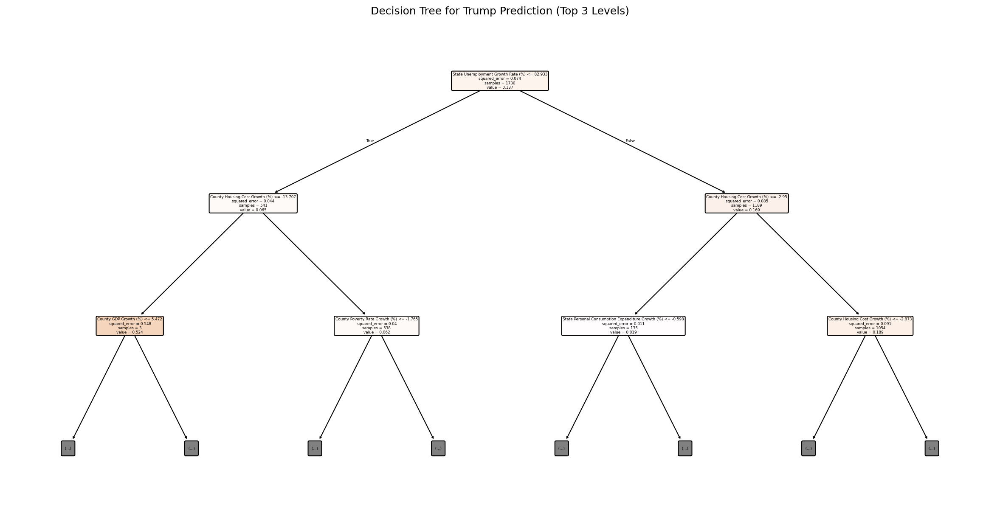

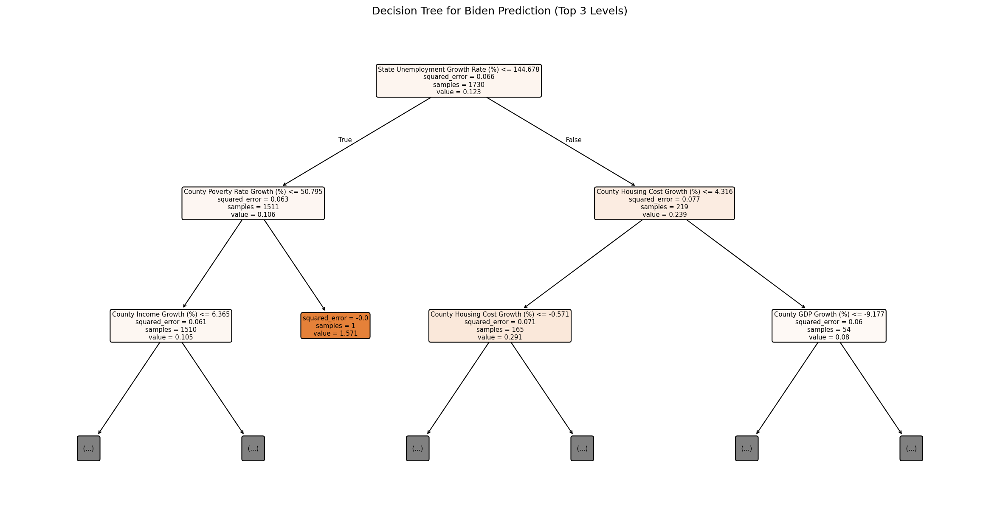

In [86]:
############# REGRESSION WITH VARIABLES FROM PREFERRED MODEL #############
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import numpy as np
from sklearn.tree import DecisionTreeRegressor, plot_tree

feature_columns = [
    'County Housing Cost Growth (%)', 
    'County GDP Growth (%)', 'County Income Growth (%)',
     'County Income Equality Growth (%)',
     'County Poverty Rate Growth (%)', 
    'County Unemployment Rate Growth (%)', 'State Unemployment Growth Rate (%)',
    'State Personal Consumption Expenditure Growth (%)', 'State Personal Income Growth (%)',
    'State Tax Rate Growth Rate (%)', 'State Avg. Local Tax Rate Growth Rate (%)',
    'State Combined Rate Growth Rate (%)', 'State Max Local Tax Rate Growth Rate (%)',
    'Country Inflation Growth (%)', 'State Housing Index Growth Rate (%)', 'State GDP Growth Rate (%)',
    'State Poverty Rate Growth (%)', 
    'State Income Inequality Growth (%)', 
]

X = merged_final[feature_columns]
Y_trump = merged_final['Y_trump'] 
Y_biden = merged_final['Y_biden']

# Handle missing values
X.fillna(X.median(), inplace=True)

# Split data into training and testing sets
X_train, X_test, y_trump_train, y_trump_test = train_test_split(X, Y_trump, test_size=0.3, random_state=42)
_, _, y_biden_train, y_biden_test = train_test_split(X, Y_biden, test_size=0.3, random_state=42)

# Initialize Decision Tree models
tree_trump = DecisionTreeRegressor(random_state=42)
tree_biden = DecisionTreeRegressor(random_state=42)

# Fit the models
tree_trump.fit(X_train, y_trump_train)
tree_biden.fit(X_train, y_biden_train)

# Predictions
y_trump_tree_pred = tree_trump.predict(X_test)
y_biden_tree_pred = tree_biden.predict(X_test)

# Evaluate model performance
print("\n--- Decision Tree Performance ---")
print("Trump Tree Model:")
print(f"MSE: {mean_squared_error(y_trump_test, y_trump_tree_pred):.4f}")

print("\nBiden Tree Model:")
print(f"MSE: {mean_squared_error(y_biden_test, y_biden_tree_pred):.4f}")
plt.figure(figsize=(20, 10))
plot_tree(tree_trump, feature_names=X.columns, filled=True, rounded=True, max_depth=2)
plt.title("Decision Tree for Trump Prediction (Top 3 Levels)")
plt.show()

plt.figure(figsize=(20, 10))
plot_tree(tree_biden, feature_names=X.columns, filled=True, rounded=True, max_depth=2)
plt.title("Decision Tree for Biden Prediction (Top 3 Levels)")
plt.show()



--- Decision Tree Performance ---
Trump Tree Model:
MSE: 0.0611

Biden Tree Model:
MSE: 0.0601


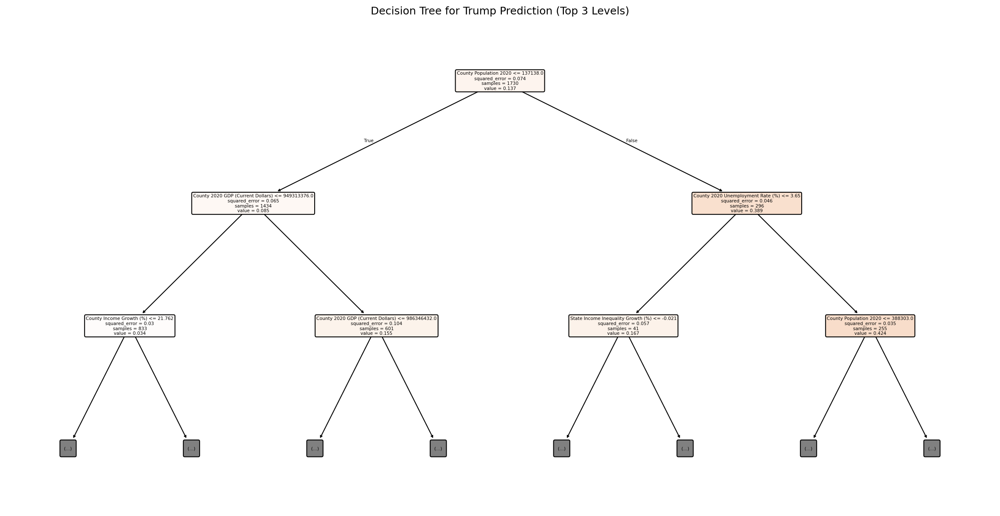

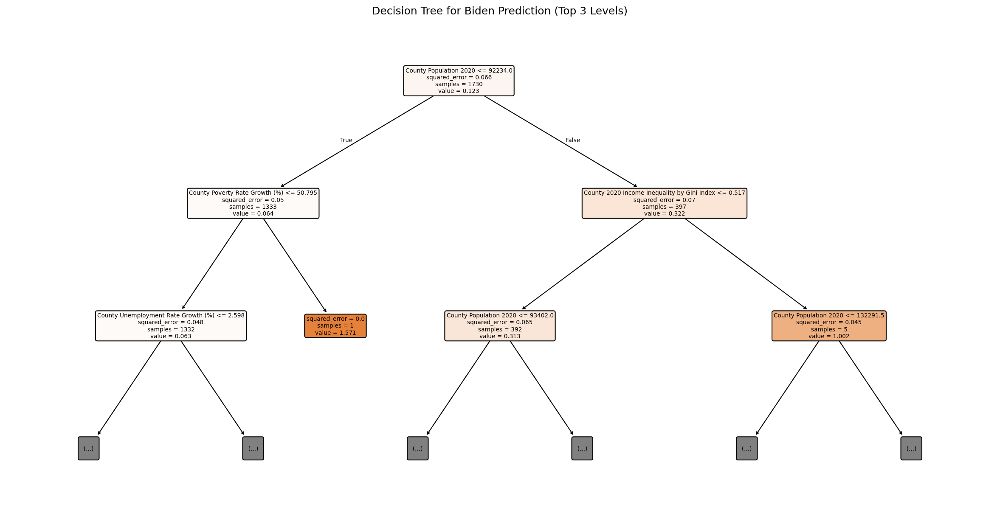

In [87]:
########### REGRESSION WITH ALL VARIABLES ###########
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import numpy as np
from sklearn.tree import DecisionTreeRegressor, plot_tree

feature_columns = [
    'County 2020 Housing Costs ($ per month)', 'County Housing Cost Growth (%)', 'County-level Library Count', 'State-level Library Count',
    'County GDP Growth (%)', 'County 2020 Income per Capita ($ per year)', 'County Income Growth (%)',
    'County 2020 Income Inequality by Gini Index', 'County Income Equality Growth (%)',
    'County 2020 Poverty Rate (%)', 'County Poverty Rate Growth (%)', 'County 2020 Unemployment Rate (%)',
    'County Unemployment Rate Growth (%)', 'State Unemployment Growth Rate (%)',
    'State Personal Consumption Expenditure Growth (%)', 'State Personal Income Growth (%)',
    'State Tax Rate Growth Rate (%)', 'State Avg. Local Tax Rate Growth Rate (%)',
    'State Combined Rate Growth Rate (%)', 'State Max Local Tax Rate Growth Rate (%)',
    'Country Inflation Growth (%)', 'State Housing Index Growth Rate (%)', 'State GDP Growth Rate (%)',
    'State 2020 Poverty Rate (%)', 'State Poverty Rate Growth (%)', 'State 2020 Income Inequality by Gini Index',
    'State Income Inequality Growth (%)', 'State Unemployment Rate (%)',
    'State Personal Consumption Expenditure (Billion $)', 'State Per Capita Personal Income ($ per year)',
    'State Tax Rate (%)', 'State Avg. Local Tax Rate (%)', 'State Combined Rate (%)',
    'State Max Local Tax Rate (%)', 'Country Inflation Rate', 'State Housing Index', 'State Current-dollar GDP',
    'Country Real Wage Growth 2020 to 2019', 'Country Unemployment Growth Rate',
    'Country Inflation Growth Rate 2019 to 2020', 'Country GDP Growth Rate 2019 to 2020',
    'Country Federal Deficit Growth Rate (%)',
    'County 2020 GDP (Current Dollars)', 'County 2020 GDP per capita', 'State-level GDP per capita', 'County Population 2020'
]

X = merged_final[feature_columns]
Y_trump = merged_final['Y_trump'] 
Y_biden = merged_final['Y_biden']

# Handle missing values
X.fillna(X.median(), inplace=True)

# Split data into training and testing sets
X_train, X_test, y_trump_train, y_trump_test = train_test_split(X, Y_trump, test_size=0.3, random_state=42)
_, _, y_biden_train, y_biden_test = train_test_split(X, Y_biden, test_size=0.3, random_state=42)

# Initialize Decision Tree models
tree_trump = DecisionTreeRegressor(random_state=42)
tree_biden = DecisionTreeRegressor(random_state=42)

# Fit the models
tree_trump.fit(X_train, y_trump_train)
tree_biden.fit(X_train, y_biden_train)

# Predictions
y_trump_tree_pred = tree_trump.predict(X_test)
y_biden_tree_pred = tree_biden.predict(X_test)

# Evaluate model performance
print("\n--- Decision Tree Performance ---")
print("Trump Tree Model:")
print(f"MSE: {mean_squared_error(y_trump_test, y_trump_tree_pred):.4f}")

print("\nBiden Tree Model:")
print(f"MSE: {mean_squared_error(y_biden_test, y_biden_tree_pred):.4f}")
plt.figure(figsize=(20, 10))
plot_tree(tree_trump, feature_names=X.columns, filled=True, rounded=True, max_depth=2)
plt.title("Decision Tree for Trump Prediction (Top 3 Levels)")
plt.show()

plt.figure(figsize=(20, 10))
plot_tree(tree_biden, feature_names=X.columns, filled=True, rounded=True, max_depth=2)
plt.title("Decision Tree for Biden Prediction (Top 3 Levels)")
plt.show()




Before proceeding with the analysis, I would like to note that I chose not to standardize my outcome variable by the 2020 county population. This decision was intentional to preserve the full set of predictors and maximize the model's predictive power: in predictive modeling, it's generally discouraged to discard or transform predictors in ways that may reduce their informational content. Additionally, maintaining consistency in how the outcome is defined across models facilitates a more meaningful comparison between my OLS regression and machine learning approaches. 

Across both trees, the splits and as they are operating under different predictor spaces ($\mathbf{X}$= {X_full} or $\mathbf{X}$= {County Growth $\cup$ State Growth}). In terms of MSE, it seems like incorporating more predictors into our model enhances predictive power. Moreover, my second regression tree yields the lowest MSE, warranting its interpretation over the former. For both candidates, county population size in 2020 emerged as the most important predictor in the regression trees, suggesting heavy selection bias across counties when tweeting due to differing population densities. Afterwards, the similarities ceases across both trees.

For our second model, in the case of Trump, counties with lower income growth and relatively high GDP also display elevated criticism; the latter is counterintuitive relative to economic voting theory. These findings suggest that economic frustration is not limited to struggling counties, but also present in economically productive areas—possibly.

In contrast, the Biden decision tree reveals that counties experiencing recent increases in poverty or income inequality are more likely to express dissatisfaction with Biden contrary to economic voting theory. This may reflect disillusionment with the Biden administration’s ability to alleviate economic hardship, especially in communities where poverty has recently worsened.



## 3.6 Random Forests
$\textbf{Random forests}$ extend regression trees by reducing their high variance and improving prediction stability. A random forest builds an ensemble of regression trees using $\textit{bootstrap aggregation}$ (bagging), where each tree is trained on a different bootstrap sample of the data. The final prediction is obtained by averaging the predictions from all trees.

However, bagging alone can result in highly correlated trees, especially when certain predictors (e.g., unemployment) dominate early splits across trees. To decorrelate the trees and increase model diversity, random forests introduce $\textbf{random feature selection}$ at each split: rather than considering all $p$ predictors, each split considers a random subset of size $m$, where $m \ll p$. The split is then chosen from among these $m$ features:

$
\text{For each split: randomly select } m \text{ features from } p, \text{ then find the best split on the } m \text{ features.}
$

This key innovation helps trees explore different partitions of the data, making the ensemble more robust and less prone to overfitting. Random forests also introduces additional regularization through n_estimators (the number of trees) and max_features (the number of features randomly considered at each split). Smaller values for max_features increase diversity across trees, improving generalization.

Random forests are particularly well-suited for this application due to their ability to capture non-linear relationships and interactions among predictors. For example, the model can implicitly account for how the effect of housing costs on political sentiment may depend on concurrent changes in unemployment or income inequality. Feature subsampling further encourages the exploration of diverse socioeconomic dimensions, rather than letting dominant predictors monopolize every split.

Moreover, random forests' ability to handle high-dimensional, geographically structured data makes them a powerful tool for uncovering the economic roots of political sentiment in large-scale behavioral data.

Trump Model Performance:
MSE: 0.0331

Biden Model Performance:
MSE: 0.0348


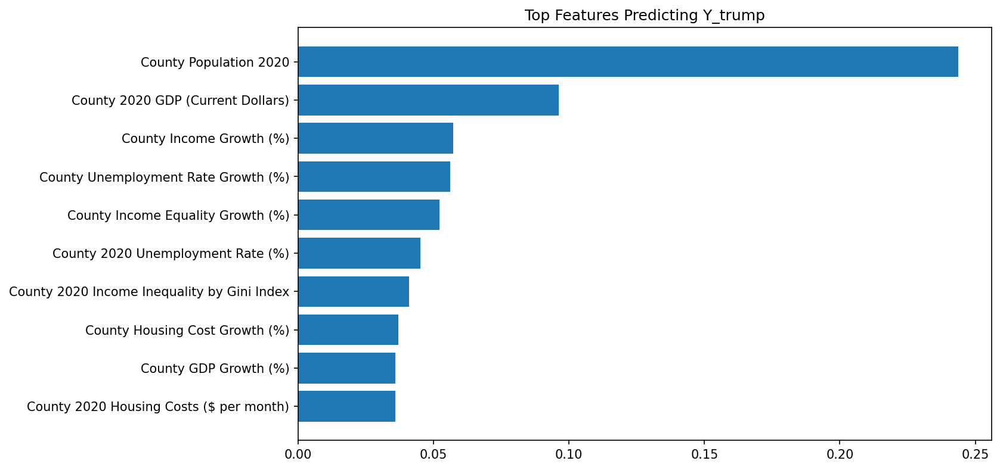

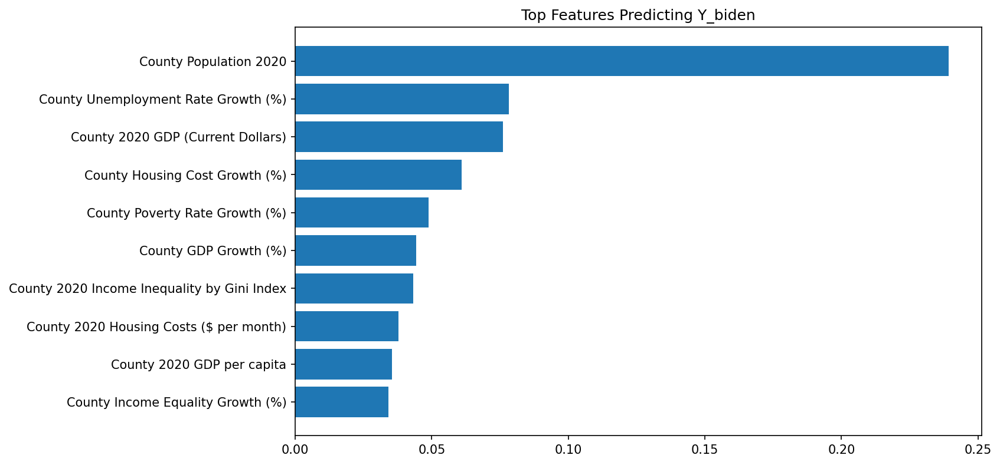

In [88]:

# DO YOU SEE ANY PROBELMS WITH THIS WELL OUR Y IS DEPENDENT ON COUNTY-LEVEL SO COUNTY_LEVLE WILL MATTER MORE INHERENTLY
# Load the dataset

# Specify the independent variables (X) and dependent variables (Y)

# cChange the Y variable not Y / county_population

# Initialize Random Forest models
rf_trump = RandomForestRegressor(n_estimators=100, random_state=42)
rf_biden = RandomForestRegressor(n_estimators=100, random_state=42)

# Fit the models
rf_trump.fit(X_train, y_trump_train)
rf_biden.fit(X_train, y_biden_train)

# Predictions
y_trump_pred = rf_trump.predict(X_test)
y_biden_pred = rf_biden.predict(X_test)

# Evaluate model performance
print("Trump Model Performance:")
print(f"MSE: {mean_squared_error(y_trump_test, y_trump_pred):.4f}\n")

print("Biden Model Performance:")
print(f"MSE: {mean_squared_error(y_biden_test, y_biden_pred):.4f}")

# Extracting Feature Importance
def extract_top_features(model, feature_names, top_n=10):
    importances = model.feature_importances_
    indices = np.argsort(importances)[-top_n:]
    
    top_features = [(feature_names[i], importances[i]) for i in indices]
    return sorted(top_features, key=lambda x: x[1], reverse=True)

top_trump_features = extract_top_features(rf_trump, X.columns)
top_biden_features = extract_top_features(rf_biden, X.columns)

# Plotting Feature Importance
def plot_feature_importance(model, feature_names, title):
    importances = model.feature_importances_
    indices = np.argsort(importances)[-10:]  # Top 10 features
    plt.figure(figsize=(10, 6))
    plt.barh(range(len(indices)), importances[indices], align='center')
    plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
    plt.title(title)
    plt.show()

plot_feature_importance(rf_trump, X.columns, "Top Features Predicting Y_trump")
plot_feature_importance(rf_biden, X.columns, "Top Features Predicting Y_biden")


For Trump, county-level predictors like population size, county GDP, and income growth growth dominate, while for Biden, variables,such as population size, county 2020 GDP, and county unemployment rate growth seem to be the most important. Again, the omnipresence of population size as a predictor signals selection bias across counties. Overall, tweeters seem to be economically retrospective when making negative tweets. In addition, tweeters seem to be more concerned about smaller county-level economic changes relative to larger state-level ones, countner to our linear regressions. Crucially, I cannot assert that this model supports economic voting theory as it does not make any claims regarding directionality.


## 3.6 OLS vs. ML

The random forest model produced the lowest mean squared error (MSE_Trump = 0.0331, MSE_Biden = 0.0338) among all models, supporting its use for interpretation. However, unlike the linear regression models, the machine learning model includes population rates as predictors. Across all models, unemployment rate growth consistently emerged as one of the most important predictors of negative sentiment toward Trump. Interestingly, according to random forests, Twitter users appear to respond more strongly to county-level economic conditions than to state-level trends, which runs counter to initial expectations from our scatterplots and geographical mappings. In addition, Tweeters seem to care more about growth factors than current conditions, reflecting their retrospectiveness. However, our random forests cannot posit any claims regarding directionality and economic attribution, warranting an interpolation from our other methods. From our linear regressions and scatter-plots, we notice that economic voting theory is supported when it comes to the presidential incumbent for the most part; however, this relationship does not hold for the presidential challenger. In addition, the negative tweet frequencies are more strongly tied to the presidential incumbent than the presidential challenger.

## 3.7 Conclusion and Future Work
This study tested economic voting theory in the context of social media by examining how county- and state-level economic conditions influenced negative tweet frequencies toward Trump and Biden during the 2020 U.S. presidential election. Consistent with theoretical expectations, worse economic conditions—particularly rising unemployment—were associated with increased negativity toward Trump, the incumbent. State-level economic indicators carried more weight in the scatterplots, while machine learning models suggested greater sensitivity to county-level variation. Across all models, unemployment rate growth was the most consistent predictor of anti-Trump sentiment. The Heckman model (Model 4) emerged as the strongest specification, accounting for selection bias and aligning best with theory. The Random Forest model achieved the lowest MSE, reinforcing its utility for prediction. Ultimately, these results indicate that tweeters respond to county-level shifts and that they tend to attribute economic conditions to the presidential incumbent more, leading to a stronger relationship between economic factors and respective negative tweet frequency relative to the challenger. Therefore, if the presidential challenger wants to improve how Tweeters view him, he should focus on improving county-level GDP, income growth, unemployment rate growth, and income inequality growth.

While this study reveals meaningful patterns between economic conditions and Twitter sentiment and clearly distinguishes from other economic voting theory papers that only use ballots instead of social media sentiment, several extensions could enhance future work. First, incorporating longitudinal tweet data across multiple election cycles would allow for a more dynamic time-series analysis of how economic trends shape political sentiment over time. Second, improving sentiment classification by using deep learning-based natural language processing (NLP) models could enhance the accuracy of tweet labeling. Third, integrating user-level metadata (e.g., occupation, location precision, or political affiliation when available) could refine our understanding of how different demographic groups respond to economic signals. Finally, further exploring how media exposure, misinformation, and local political climates interact with economic conditions could yield richer insights into the complex drivers of digital political expression.

## References

De Benedictis-Kessner, J., & Warshaw, C. (2020). Accountability for the local economy at all levels of government in United States elections. *American Political Science Review*, *114*(3), 660–676.  
&emsp; https://doi.org/10.1017/s0003055420000027  

Fair, R. C. (2008). Presidential and Congressional Vote‐Share equations. *American Journal of Political Science*, *53*(1), 55–72.  
&emsp; https://doi.org/10.1111/j.1540-5907.2008.00357.x  

Fujiwara, T., Müller, K., & Schwarz, C. (2023). The effect of social media on elections: Evidence from the United States. *Journal of the European Economic Association*, *22*(3), 1495–1539.  
&emsp; https://doi.org/10.1093/jeea/jvad058  

Gallup, Inc. (2019, December 30). *Most important problem | Gallup Historical trends*. Gallup.com. 
&emsp; https://web.archive.org/web/20200101200356/https://news.gallup.com/poll/1675/most-important-problem.aspx

Gilpin, G., Karger, E., & Nencka, P. (2021). The returns to public library investment. 
&emsp; https://doi.org/10.21033/wp-2021-06

Healy, A., & Lenz, G. S. (2013). Substituting the end for the whole: Why voters respond primarily to the election‐year economy. *American Journal of Political Science*, *58*(1), 31–47.  
&emsp; https://doi.org/10.1111/ajps.12053  

Hopkins, D. J. (2017). *The increasingly United States*.  
&emsp; https://doi.org/10.7208/chicago/9780226530406.001.0001  

Kinder, D. R., & Kiewiet, D. R. (1981). Sociotropic politics: The American case. *British Journal of Political Science*, *11*(2), 129–161.  
&emsp; https://doi.org/10.1017/s0007123400002544  

Leighley, J. E. (2010). The Oxford Handbook of American Elections and Political Behavior. In *Oxford University Press eBooks*.  
&emsp; https://doi.org/10.1093/oxfordhb/9780199235476.001.0001  

Lewis-Beck, M. S., & Nadeau, R. (2010). Economic voting theory: Testing new dimensions. *Electoral Studies*, *30*(2), 288–294.  
&emsp; https://doi.org/10.1016/j.electstud.2010.09.001  

Lewis-Beck, M. S., & Stegmaier, M. (2000). Economic determinants of electoral outcomes. *Annual Review of Political Science*, *3*(1), 183–219.  
&emsp; https://doi.org/10.1146/annurev.polisci.3.1.183  

Lewis-Beck, M. S., & Stegmaier, M. (2000b). Economic determinants of electoral outcomes. *Annual Review of Political Science*, *3*(1), 183–219.  
&emsp; https://doi.org/10.1146/annurev.polisci.3.1.183  

Lewis-Beck, M. S., & Stegmaier, M. (2009). American voter to economic voter: Evolution of an idea. *Electoral Studies*, *28*(4), 625–631.  
&emsp; https://doi.org/10.1016/j.electstud.2009.05.023  

Lewis-Beck, M. S., & Stegmaier, M. (2009b). Economic models of voting. In *Oxford University Press eBooks* (pp. 518–537).  
&emsp; https://doi.org/10.1093/oxfordhb/9780199270125.003.0027  

Reality Check Team. (2020, November 3). *US 2020 election: The economy under Trump in six charts*.  
&emsp; https://www.bbc.com/news/world-45827430  

Sartorius, Martin. (2015). *County Level Economic Voting in U.S. Presidential Elections*. [Undergraduate thesis, Claremont McKenna College]. Claremont McKenna College Scholarship Repository. 
&emsp; https://scholarship.claremont.edu/cgi/viewcontent.cgi?article=2155&context=cmc_theses

Silver, C. (2025, February 5). *2020 election: The key economic issues explained*. Investopedia.  
&emsp; https://www.investopedia.com/democratic-debate-policy-cheat-sheet-4691340  

Wang, V. X. (2024, April 30). How public libraries drive economic vitality in surrounding communities. Published in Critical Debates in Humanities, Science and Global Justice. 
&emsp; https://criticaldebateshsgj.scholasticahq.com/article/117035-how-public-libraries-drive-economic-vitality-in-surrounding-communities?utm_source=chatgpt.com


Wlezien, C., Franklin, M., & Twiggs, D. (1997). Economic perceptions and vote choice: Disentangling the endogeneity. *Political Behavior*, *19*(1), 7–17.  
&emsp; https://doi.org/10.1023/A:1024841605168  

## Data Sources (All data is from November 2019 and November 2020):

### County GDP
*GDP by county, metro, and other areas | U.S. Bureau of Economic Analysis (BEA)*. (n.d.). https://www.bea.gov/data/gdp/gdp-county-metro-and-other-areas

### County Income
U.S. Census Bureau. (n.d.). *Explore Census data*. https://data.census.gov/table/ACSST1Y2023.S1901?q=income

### County Income Inequality
U.S. Census Bureau. (n.d.-b). *Explore Census data*. https://data.census.gov/table/ACSDT1Y2023.B19083?q=Income+Inequality

### County Population
U.S. Census Bureau. (n.d.-c). *Explore Census data*. https://data.census.gov/table/DECENNIALCD1182020.P1?q=population+total 

### County Poverty Rate
U.S. Census Bureau. (n.d.-d). *Explore Census data*. https://data.census.gov/table/ACSST1Y2023.S1701?q=poverty+rate 

### County Employment Rate
U.S. Census Bureau. (n.d.-e). *Explore Census data*. https://data.census.gov/table/ACSST1Y2023.S2301?q=unemployment+rate

### State Income Inequality
U.S. Census Bureau. (n.d.-b). *Explore Census data*. https://data.census.gov/table/ACSDT1Y2023.B19083?q=Income+Inequality

### State Poverty Rate
U.S. Census Bureau. (n.d.-d). *Explore Census data*. https://data.census.gov/table/ACSST1Y2023.S1701?q=poverty+rate 

### State Unemployment Data
Bureau of Labor Statistics. (n.d.). *LAUS: Local area unemployment statistics*. U.S. Department of Labor. Retrieved November 2020, from https://www.bls.gov/lau/lastrk20.htm

### State Tax Data
Tax Foundation. (2020). *2020 state sales taxes*. Retrieved November 2020, from https://taxfoundation.org/data/all/state/2020-sales-taxes/

### State Housing Cost Data
Federal Housing Finance Agency. (n.d.). *House price index (HPI) datasets*. Retrieved November 2020, from https://www.fhfa.gov/data/hpi/datasets?tab=hpi-datasets

### State GDP
U.S. Bureau of Economic Analysis. (n.d.). *GDP by state, current dollars*. Retrieved November 2020, from https://apps.bea.gov/histdatacore/HistFileDetails.html?HistCateID=1&FileGroupID=232

### State Personal Income
U.S. Bureau of Economic Analysis. (n.d.). *State personal income*. Retrieved November 2020, from https://apps.bea.gov/histdatacore/HistFileDetails.html?HistCateID=4&FileGroupID=253

### State Personal Consumption Expenditure
U.S. Bureau of Economic Analysis. (n.d.). *Personal consumption expenditure*. Retrieved November 2020, from https://apps.bea.gov/histdatacore/HistFileDetails.html?HistCateID=7&FileGroupID=264

### State Population
U.S. Census Bureau. (n.d.-c). *Explore Census data*. https://data.census.gov/table?q=Population+Total

### Tweets
*US Election 2020 tweets*. (2020, November 9). Kaggle.  
&emsp; https://www.kaggle.com/datasets/manchunhui/us-election-2020-tweets  
